In [1]:
# Imports

import sys
import time
import heapq
import random
import numpy as np
from math import exp
from itertools import count
from collections import deque
from matplotlib import colors
from tabulate import tabulate
import matplotlib.pyplot as plt
from heapq import heappop, heappush
from shutil import get_terminal_size
from random import randint, choice, random

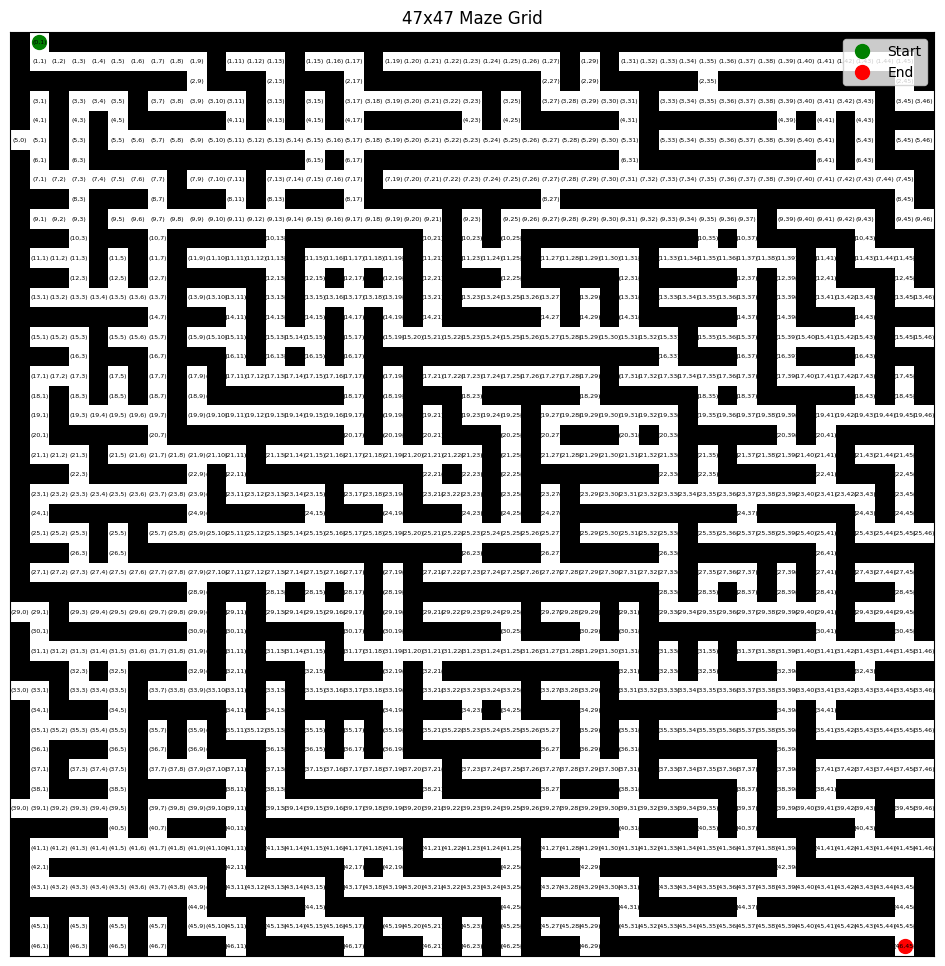

In [2]:
import random  # Import the random module

random.seed(10)
def create_maze_with_multiple_paths(size=35, wall_density=0.6, loop_probability=0.2):
    maze = np.ones((size, size))
    for i in range(1, size - 1, 2):
        for j in range(1, size - 1, 2):
            maze[i, j] = 0

            # If the number more than the density of the wall then draw wthite cell
            if random.random() > wall_density:
                maze[i, j + 1] = 0
            else:
                maze[i + 1, j] = 0

            if random.random() < loop_probability:
                if random.random() < 0.5 and i > 1:
                    maze[i - 1, j] = 0
                else:
                    maze[i, j - 1] = 0

    maze[0, 1] = 0
    maze[size - 1, size - 2] = 0
    return maze

maze_size = 47
maze = create_maze_with_multiple_paths(maze_size, wall_density=0.4)


# Set up the plot
plt.figure(figsize=(12, 12))
plt.imshow(maze, cmap='binary')
plt.title('47x47 Maze Grid')

plt.xticks([])
plt.yticks([])

# Green For the Initil State
plt.plot(1, 0, 'go', markersize=10, label='Start')
# Red For the Goal State
plt.plot(maze_size-2, maze_size-1, 'ro', markersize=10, label='End')

plt.legend()

# Put the Cell number on each cell
for i in range(maze_size):
    for j in range(maze_size):
        text = f"({i},{j})"
        plt.text(j, i, text, ha="center", va="center", color="black", fontsize=4.5)

plt.show()

In [3]:
# The Node Class From the Labs

class Node:
    '''Node data structure for search space bookkeeping.'''
    def __init__(self, state, parent, action, path_cost):
        '''Constructor for the node state with the required parameters.'''
        self.state = state
        self.parent = parent
        self.action = action
        self.path_cost = path_cost

    @classmethod
    def root(cls, init_state):
        '''Factory method to create the root node.'''
        return cls(init_state, None, None, 0)

    @classmethod
    def child(cls, problem, parent, action):
        '''Factory method to create a child node.'''
        return cls(
            problem.result(parent.state, action),
            parent,
            action,
            parent.path_cost + problem.step_cost(parent.state, action))

    def __lt__(self, other):
        """Compare nodes based on path cost."""
        return self.path_cost < other.path_cost

def solutions(node):
    '''A method to extract the sequence of actions representing the solution from the goal node.'''
    actions = []
    cost = node.path_cost
    while node.parent is not None:
        actions.append(node.action)
        node = node.parent
    actions.reverse()
    return actions, cost

In [4]:
# Visualization Class from the Labs

terminal_width, _ = get_terminal_size()

_visualizers = {}

def _default_visualizer(_, state):
    '''Generic visualizer for unknown problems.'''
    print(state)

class Visualizer:
    '''Visualization and printing functionality encapsulation.'''

    def __init__(self, problem):
        '''Constructor with the problem to visualize.'''
        self.problem = problem
        self.counter = 0

    def visualize(self, frontier):
        '''Visualizes the frontier at every step.'''
        self.counter += 1
        print(f'Frontier at step {self.counter}')
        for node in frontier:
            print()
            _visualizers.get(type(self.problem), _default_visualizer)(self.problem, node.state)
        print('-' * terminal_width)

In [5]:
def transition_function(state, action):
    row, col = state
    num_rows, num_cols = maze.shape  # Assuming 'maze' is your maze grid

    # Calculate next state based on action:
    if action == 0:  # North
        next_row, next_col = row - 1, col
    elif action == 1:  # South
        next_row, next_col = row + 1, col
    elif action == 2:  # East
        next_row, next_col = row, col + 1
    elif action == 3:  # West
        next_row, next_col = row, col - 1
    else:
        raise ValueError("Invalid action")

    # Check validity of next state:
    if 0 <= next_row < num_rows and 0 <= next_col < num_cols and maze[next_row, next_col] == 0:
        next_state = (next_row, next_col)
    else:
        next_state = state  # Stay in current state if move is invalid

    return next_state

In [6]:
# Create cost matrix
cost_matrix = np.ones_like(maze, dtype=int)

for i in range(maze.shape[0]):
    for j in range(maze.shape[1]):
        if maze[i, j] == 0:
            cost_matrix[i, j] = random.randint(1, 10)

In [7]:
# Maze Class

class MazeProblem:
    def __init__(self, maze, init_state, goal_state):
        self.maze = maze
        self.init_state = init_state
        self.goal_state = goal_state
        self.num_rows, self.num_cols = maze.shape  # Store maze dimensions

     # Define possible actions (North, South, East, West)
    def actions(self, state):
        return [0, 1, 2, 3]

    # Use the existing transition_function, but check boundaries
    def result(self, state, action):
        row, col = state
        if action == 0:  # North
            next_row, next_col = row - 1, col
        elif action == 1:  # South
            next_row, next_col = row + 1, col
        elif action == 2:  # East
            next_row, next_col = row, col + 1
        elif action == 3:  # West
            next_row, next_col = row, col - 1

        # Check validity of next state, including boundaries
        if 0 <= next_row < self.num_rows and 0 <= next_col < self.num_cols and self.maze[next_row, next_col] == 0:
            next_state = (next_row, next_col)
        else:
            next_state = state
        return next_state

    # Check If these state is a goal
    def goal_test(self, state):
        return state == self.goal_state

    # Calculate the step cost
    def step_cost(self, state, action):
        next_state = self.result(state, action)
        # Use cost from cost_matrix if you have one
        return cost_matrix[next_state[0], next_state[1]]

    #Calculates the heuristic value for a given state
    def heuristic(self, state):
        row, col = state
        goal_row, goal_col = self.goal_state
        return abs(row - goal_row) + abs(col - goal_col)

In [8]:
# Put the Initial State
start_state = (0, 1)

# Put the Goal State (46 , 45)
goal_state = (maze_size - 1, maze_size - 2)

# Give the Maze and the Initial State and Goal State to the problem
problem = MazeProblem(maze, start_state, goal_state)

# **Visualization**

In [28]:
# Visualize the Maze after Each step

def visualize_path(maze, explored_states, start_state, goal_state, show_path=False, show_explored=False):
    plt.figure(figsize=(12, 12))
    plt.imshow(maze, cmap='binary')
    plt.title('Maze with Explored States and Path')
    plt.xticks([])
    plt.yticks([])

    # Mark start and goal
    plt.plot(start_state[1], start_state[0], 'go', markersize=10, label='Start')
    plt.plot(goal_state[1], goal_state[0], 'ro', markersize=10, label='End')

    # Highlight explored states with Blue
    if show_explored:
        for node in explored_states:
            plt.plot(node.state[1], node.state[0], 'bo', markersize=5)

    # Highlight the final path
    if show_path:
        current = explored_states[-1]
        while current is not None and current.parent is not None:
            row, col = current.state
            parent_row, parent_col = current.parent.state
            plt.plot([col, parent_col], [row, parent_row], 'b-', linewidth=2)
            current = current.parent

    plt.legend()
    plt.show()

In [29]:
# Visualize the Maze after Each step with the cost on the cells

def visualize_path_with_cost(maze, explored_states, start_state, goal_state, cost_matrix, show_path=False, show_explored=False):
    plt.figure(figsize=(12, 12))
    plt.imshow(maze, cmap='binary')
    plt.title('Maze with Explored States, Path, and Costs')
    plt.xticks([])
    plt.yticks([])

    # Mark start and goal
    plt.plot(start_state[1], start_state[0], 'go', markersize=10, label='Start')
    plt.plot(goal_state[1], goal_state[0], 'ro', markersize=10, label='End')

    # Highlight explored states with blues
    if show_explored:
        for node in explored_states:
            plt.plot(node.state[1], node.state[0], 'bo', markersize=5)

    # Highlight the final path
    if show_path:
        current = explored_states[-1]
        while current is not None and current.parent is not None:
            row, col = current.state
            parent_row, parent_col = current.parent.state
            plt.plot([col, parent_col], [row, parent_row], 'b-', linewidth=2)
            current = current.parent

    # Add cost values to white cells
    for i in range(maze.shape[0]):
        for j in range(maze.shape[1]):
            if maze[i, j] == 0:
                plt.text(j, i, cost_matrix[i, j], ha="center", va="center", color="red", fontsize=8)

    plt.legend()
    plt.show()

In [30]:
# Visualize the Maze after Each step with the Heuristic values on the cells

def visualize_maze_with_heuristic(maze, heuristic_function, start_state, goal_state, explored_states=None, show_path=False, show_explored=False):
    plt.figure(figsize=(12, 12))
    plt.imshow(maze, cmap='binary')
    plt.title('Maze with Heuristic Values, Explored States, and Path')
    plt.xticks([])
    plt.yticks([])

    # Mark start and goal
    plt.plot(start_state[1], start_state[0], 'go', markersize=10, label='Start')
    plt.plot(goal_state[1], goal_state[0], 'ro', markersize=10, label='End')

    # Highlight explored states with blues
    if show_explored and explored_states:
        for node in explored_states:
            plt.plot(node.state[1], node.state[0], 'bo', markersize=5)

    # Highlight the final path
    if show_path and explored_states:
        current = explored_states[-1]
        while current is not None and current.parent is not None:
            row, col = current.state
            parent_row, parent_col = current.parent.state
            plt.plot([col, parent_col], [row, parent_row], 'b-', linewidth=2)
            current = current.parent

    # Add heuristic values to white cells
    for i in range(maze.shape[0]):
        for j in range(maze.shape[1]):
            if maze[i, j] == 0:
                node = Node(state=(i, j), parent=None, action=None, path_cost=0)
                heuristic_value = heuristic_function(node)
                plt.text(j, i, f"{heuristic_value:.1f}", ha="center", va="center", color="red", fontsize=5.5)

    plt.legend()
    plt.show()

# **3) Uninformed Search Algorithms**

## **A) Breadth First Search (BFS)**

In [31]:
# BFS Implementation from Labs

def breadth_first_graph_search(problem, verbose=False):
    c = 0
    node = Node.root(problem.init_state)
    if problem.goal_test(node.state):
        return solutions(node), 1

    frontier = deque([node])
    explored = set()

    # Store explored states for visualization
    explored_states_list = []
    max_frontier_size = 1

    if verbose:
        visualizer = Visualizer(problem)
        visualizer.visualize(frontier)

    while frontier:
        node = frontier.popleft()
        explored.add(node.state)
        explored_states_list.append(node)
        explored_cells = []

        for action in problem.actions(node.state):
            child = Node.child(problem, node, action)
            if child.state not in explored and child not in frontier:
                if problem.goal_test(child.state):
                    explored_states_list.append(child)  # Store the Node object

                    # Visualize the final path and all explored states here
                    visualize_path(maze, explored_states_list, start_state, goal_state, show_path=True, show_explored=True)
                    time.sleep(0.5)

                    for node in explored_states_list:
                        explored_cells.append(node.state)

                    return solutions(child), max_frontier_size, explored_cells

                frontier.append(child)


                # Visualize explored states only
                if (c % 2000) == 0:
                  visualize_path(maze, explored_states_list, start_state, goal_state, show_path=False, show_explored=True)
                  time.sleep(0.5)
                c = c + 1

        max_frontier_size = max(max_frontier_size, len(frontier))

        if verbose:
            visualizer.visualize(frontier)

    total_explored_states = len(explored_states_list)
    print("\nTotal Number of Explored States:", total_explored_states)

    return None, max_frontier_size, explored_cells

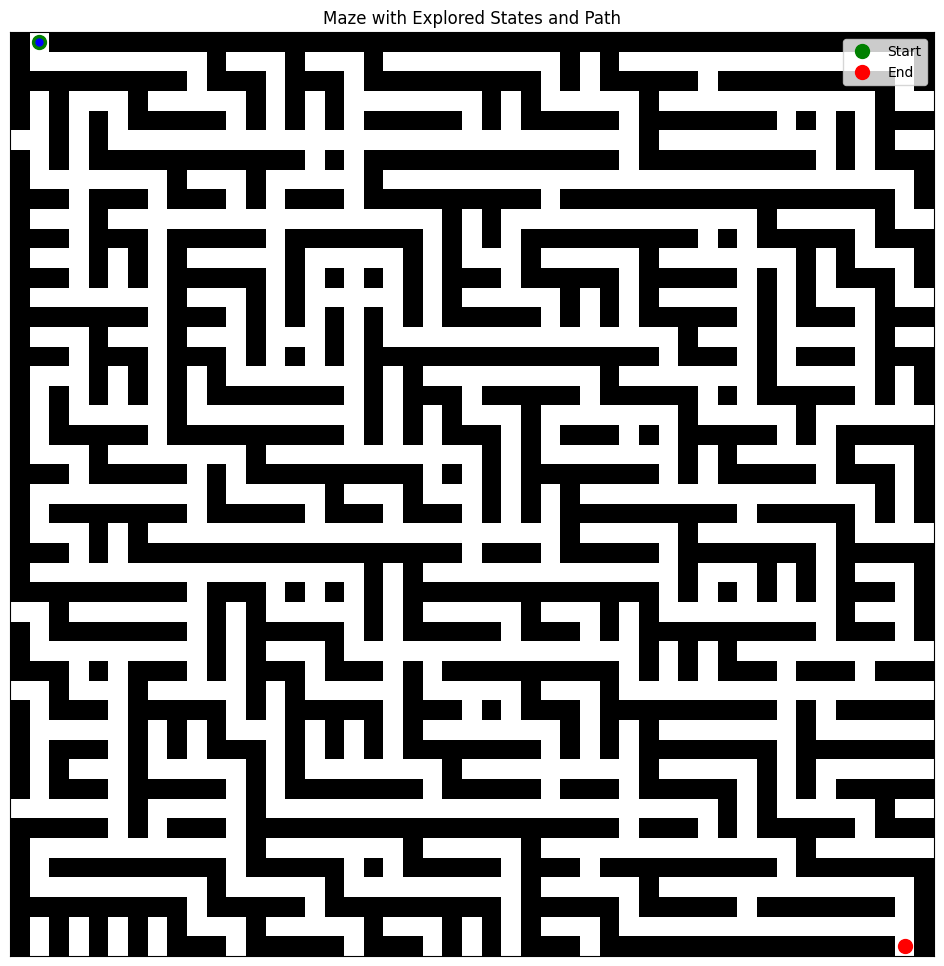

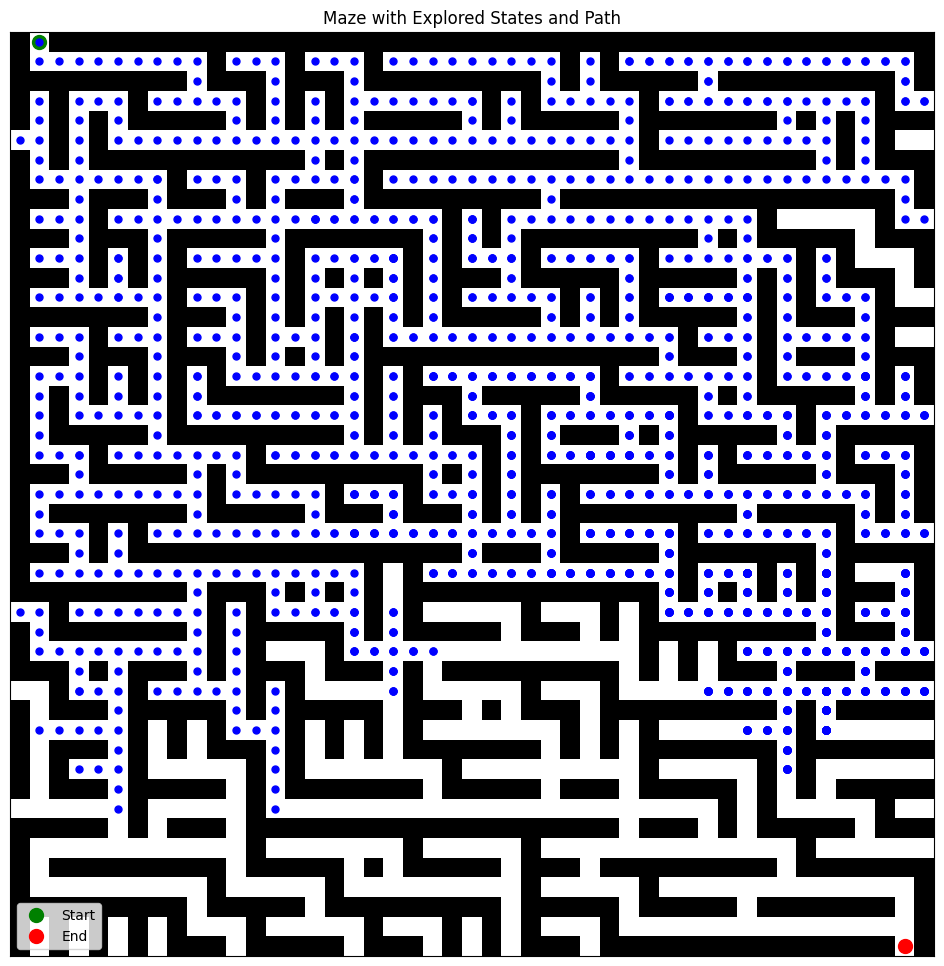

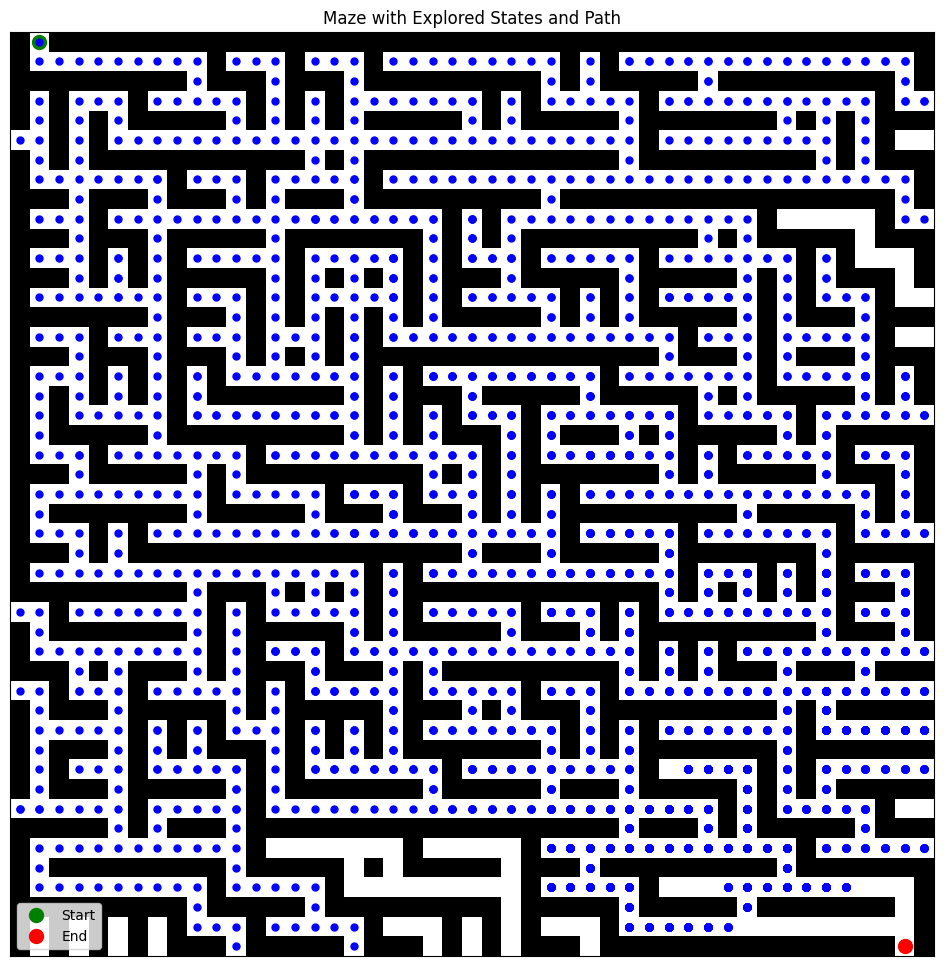

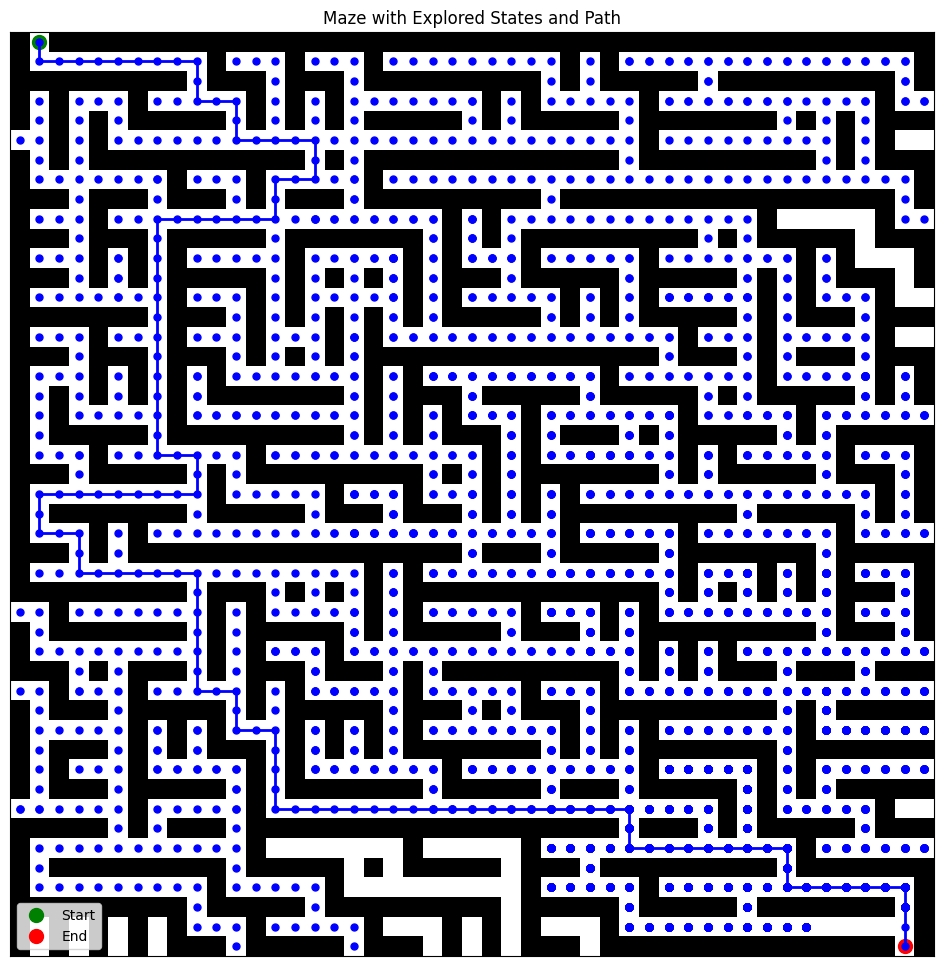

In [32]:
solution_path_bfs, max_frontier_size_bfs, explored_cells_bfs = breadth_first_graph_search(problem)

In [ ]:
# Print the Results

if solution_path_bfs:
       print("Explored States:", explored_cells_bfs)
       print("Cost: ", len(explored_cells_bfs))

       print("\n")
       print("Solution Path:", solution_path_bfs[0])
       print("Number of Actions in the Solution Path:", len(solution_path_bfs[0]))

       print("\n")
       print("Max Frontier Size: ", max_frontier_size_bfs)

else:
    print("No solution found.")

Explored States: [(0, 1), (1, 1), (1, 2), (1, 3), (1, 4), (1, 5), (1, 6), (1, 7), (1, 8), (1, 9), (2, 9), (3, 9), (3, 10), (3, 8), (3, 11), (3, 7), (4, 11), (5, 11), (5, 12), (5, 10), (5, 13), (5, 9), (4, 13), (5, 14), (5, 8), (3, 13), (5, 15), (5, 7), (2, 13), (4, 15), (6, 15), (5, 16), (5, 6), (1, 13), (3, 15), (7, 15), (5, 17), (5, 5), (1, 12), (7, 16), (7, 14), (4, 17), (6, 17), (5, 18), (4, 5), (1, 11), (7, 17), (7, 13), (3, 17), (7, 17), (5, 19), (3, 5), (8, 17), (8, 13), (2, 17), (3, 18), (8, 17), (5, 20), (3, 4), (9, 17), (9, 13), (1, 17), (3, 19), (9, 17), (5, 21), (3, 3), (9, 18), (9, 16), (10, 13), (9, 14), (9, 12), (1, 16), (3, 20), (9, 18), (9, 16), (5, 22), (4, 3), (9, 19), (9, 15), (11, 13), (9, 15), (9, 11), (1, 15), (3, 21), (9, 19), (9, 15), (5, 23), (5, 3), (9, 20), (12, 13), (11, 12), (8, 11), (9, 10), (3, 22), (9, 20), (4, 23), (5, 24), (6, 3), (9, 21), (13, 13), (11, 11), (7, 11), (9, 9), (3, 23), (9, 21), (3, 23), (5, 25), (7, 3), (10, 21), (14, 13), (11, 10), (7

## **B) Depth First Search (DFS)**

In [33]:
# DFS Implementation from Labs

def depth_first_graph_search(problem, verbose=False):
    c = 0
    node = Node.root(problem.init_state)
    frontier = [node]
    explored = set()

    # To store explored states for visualization
    explored_states_list = []
    max_frontier_size = 1

    if verbose:
        visualizer = Visualizer(problem)
        visualizer.visualize(frontier)

    while frontier:
        node = frontier.pop()
        explored.add(node.state)
        explored_states_list.append(node)
        explored_cells = []

        if problem.goal_test(node.state):
            # Visualize the final path and all explored states here
            visualize_path(maze, explored_states_list, start_state, goal_state, show_path=True, show_explored=True)
            time.sleep(0.5)

            for node in explored_states_list:
                explored_cells.append(node.state)

            return solutions(node), max_frontier_size, explored_cells

        for action in problem.actions(node.state):
            child = Node.child(problem, node, action)
            if child.state not in explored and child not in frontier:
                frontier.append(child)

                 # Visualize explored states only
                if (c % 500) == 0:
                  visualize_path(maze, explored_states_list, start_state, goal_state, show_path=False, show_explored=True)
                  time.sleep(0.5)
                c = c + 1

        max_frontier_size = max(max_frontier_size, len(frontier))

        if verbose:
            visualizer.visualize(frontier)

    total_explored_states = len(explored_states_list)
    print("\nTotal Number of Explored States:", total_explored_states)

    return None, max_frontier_size, explored_cells

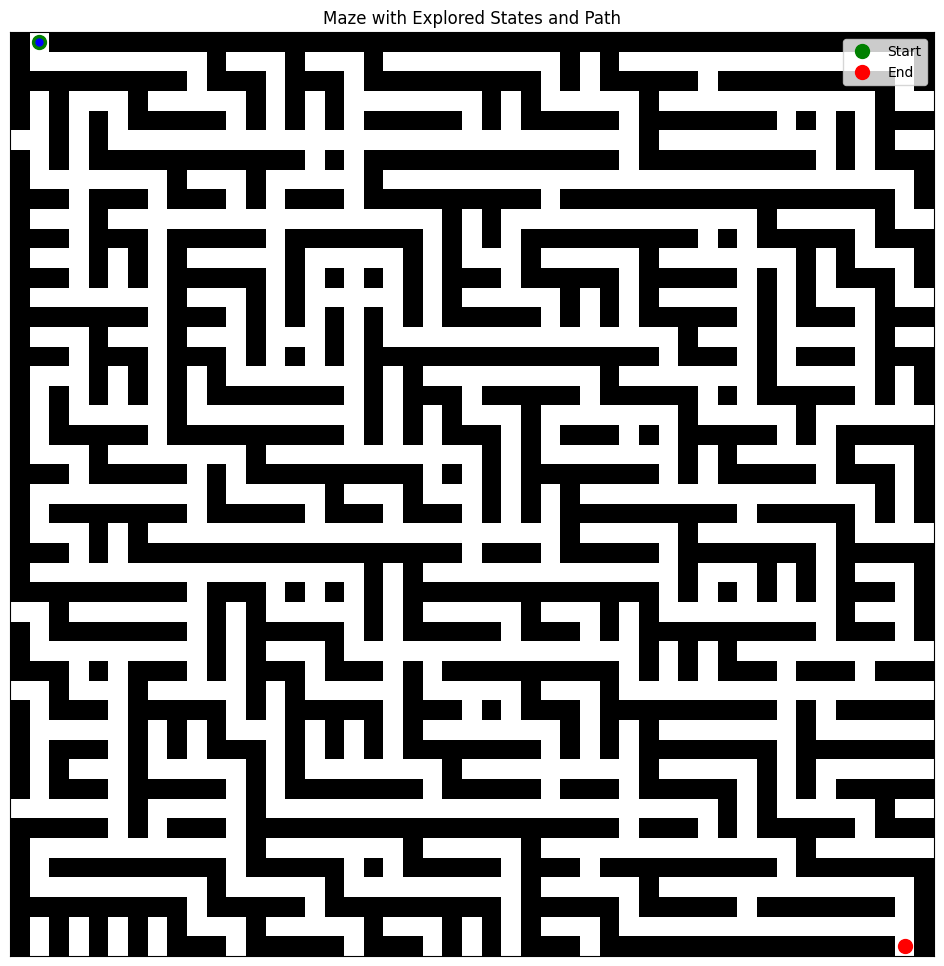

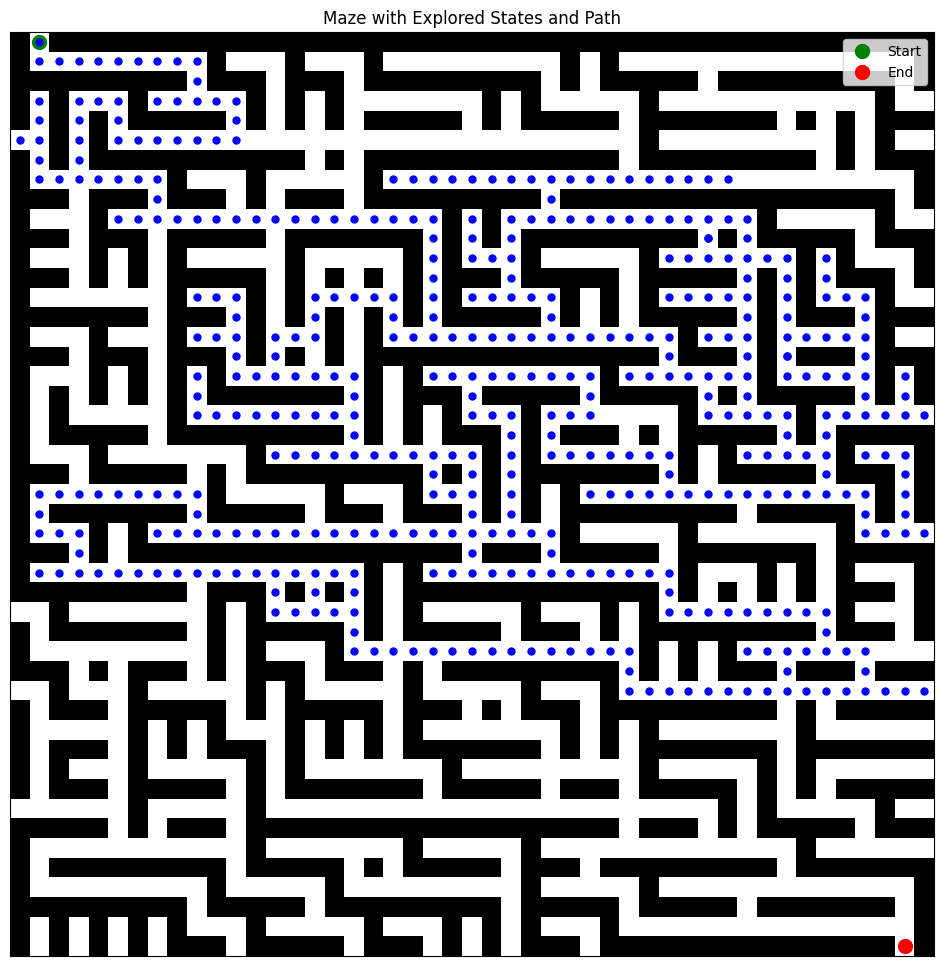

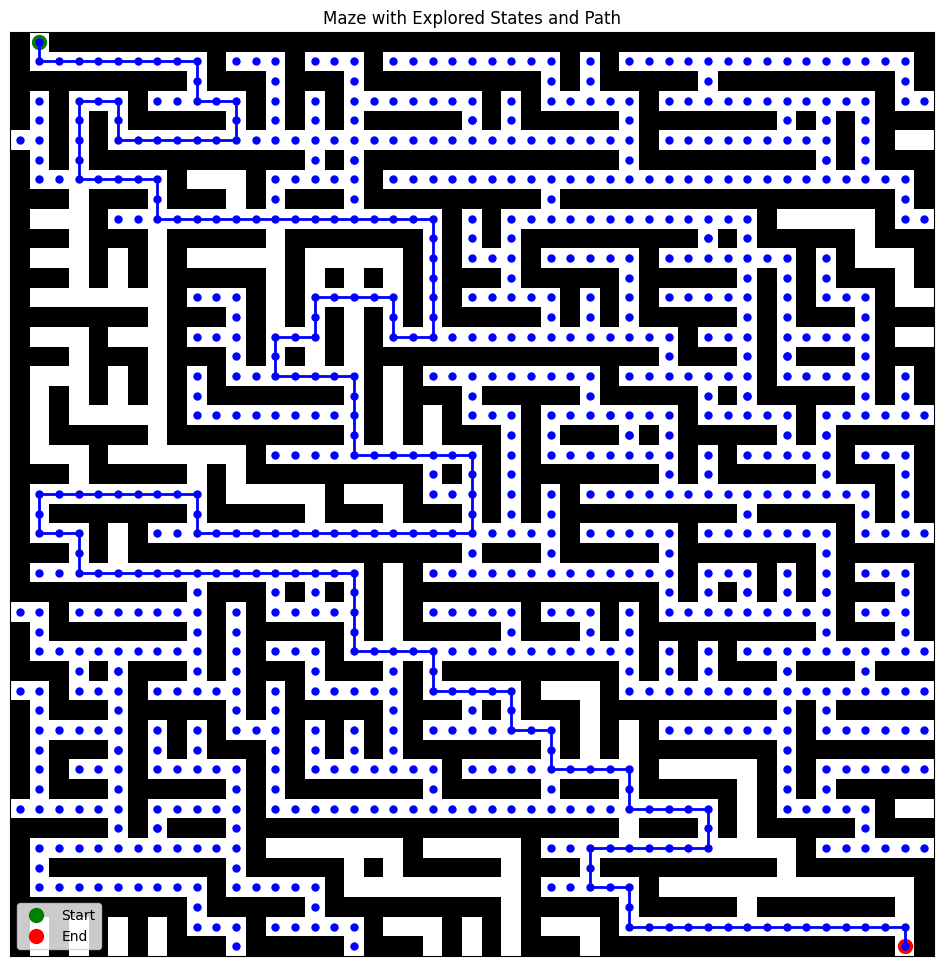

In [34]:
solution_path_dfs, max_frontier_size_dfs, explored_cells_dfs= depth_first_graph_search(problem)

In [ ]:
# Print the DFS Results

if solution_path_dfs:
       print("Explored States:", explored_cells_dfs)
       print("Cost: ", len(explored_cells_dfs))

       print("\n")
       print("Solution Path:", solution_path_dfs[0])
       print("Number of Actions in the Solution Path:", len(solution_path_dfs[0]))

       print("\n")
       print("Max Frontier Size: ", max_frontier_size_dfs)

else:
    print("No solution found.")

Explored States: [(0, 1), (1, 1), (1, 2), (1, 3), (1, 4), (1, 5), (1, 6), (1, 7), (1, 8), (1, 9), (2, 9), (3, 9), (3, 8), (3, 7), (3, 10), (3, 11), (4, 11), (5, 11), (5, 10), (5, 9), (5, 8), (5, 7), (5, 6), (5, 5), (4, 5), (3, 5), (3, 4), (3, 3), (4, 3), (5, 3), (6, 3), (7, 3), (7, 2), (7, 1), (6, 1), (5, 1), (5, 0), (4, 1), (3, 1), (7, 4), (7, 5), (7, 6), (7, 7), (8, 7), (9, 7), (9, 6), (9, 5), (9, 8), (9, 9), (9, 10), (9, 11), (9, 12), (9, 13), (9, 14), (9, 15), (9, 16), (9, 17), (9, 18), (9, 19), (9, 20), (9, 21), (10, 21), (11, 21), (12, 21), (13, 21), (14, 21), (15, 21), (15, 20), (15, 19), (14, 19), (13, 19), (13, 18), (13, 17), (13, 16), (13, 15), (14, 15), (15, 15), (15, 14), (15, 13), (16, 13), (17, 13), (17, 12), (17, 11), (16, 11), (15, 11), (15, 10), (15, 9), (14, 11), (13, 11), (13, 10), (13, 9), (17, 14), (17, 15), (17, 16), (17, 17), (18, 17), (19, 17), (19, 16), (19, 15), (19, 14), (19, 13), (19, 12), (19, 11), (19, 10), (19, 9), (18, 9), (17, 9), (20, 17), (21, 17), (2

## **C) Iteerative Deepening Search (IDS)**

In [ ]:
# IDS Implementation from Labs

def depth_limited_search(problem, limit=50, verbose=False, visualizer=None, explored_states_list=None):
    if explored_states_list is None:

        # Initialize list to store explored states
        explored_states_list = []

    def recursive_dls(node, problem, limit):
        nonlocal explored_states_list  # Access the outer list

        explored_states_list.append(node)  # Add explored node to the list

        if problem.goal_test(node.state):
            return node
        elif limit == 0:
            return 'cutoff'
        else:
            cutoff_occurred = False
            children = [Node.child(problem, node, action) for action in problem.actions(node.state)]
            if verbose and visualizer:
                visualizer.visualize(children)
            for child in children:
                if child.state not in [n.state for n in explored_states_list]: # avoid revisiting same state in same depth iteration
                    result = recursive_dls(child, problem, limit - 1)
                    if result == 'cutoff':
                        cutoff_occurred = True
                    elif result is not None:
                        return result
            return 'cutoff' if cutoff_occurred else None

    # Body of depth_limited_search:
    return recursive_dls(Node.root(problem.init_state), problem, limit)


def iterative_deepening_search(problem, verbose=False):
    explored_cells = []
    c = 0
    max_frontier_size = 1
    visualizer = Visualizer(problem) if verbose else None

    for depth in range(sys.maxsize):
        explored_states_list = []  # Reset list to store explored states for visualization
        result = depth_limited_search(problem, limit=depth, verbose=verbose,
                                      visualizer=visualizer, explored_states_list=explored_states_list)

        if result != 'cutoff':
            # Visualize the final path and all explored states when goal is found
            visualize_path(maze, explored_states_list, start_state, goal_state, show_path=True, show_explored=True)
            time.sleep(0.5)

            for node in explored_states_list:
                explored_cells.append(node.state)

            actions = solutions(result)
            return actions, max_frontier_size, explored_cells

        # Visualize explored states for the current depth
        if (c % 500) == 0:
          visualize_path(maze, explored_states_list, start_state, goal_state, show_path=False, show_explored=True)
          time.sleep(0.5)
        c = c + 1


        # Update max frontier size during each depth iteration
        max_frontier_size = max(max_frontier_size, depth)  # Update based on depth iteration

    return None, max_frontier_size, explored_cells

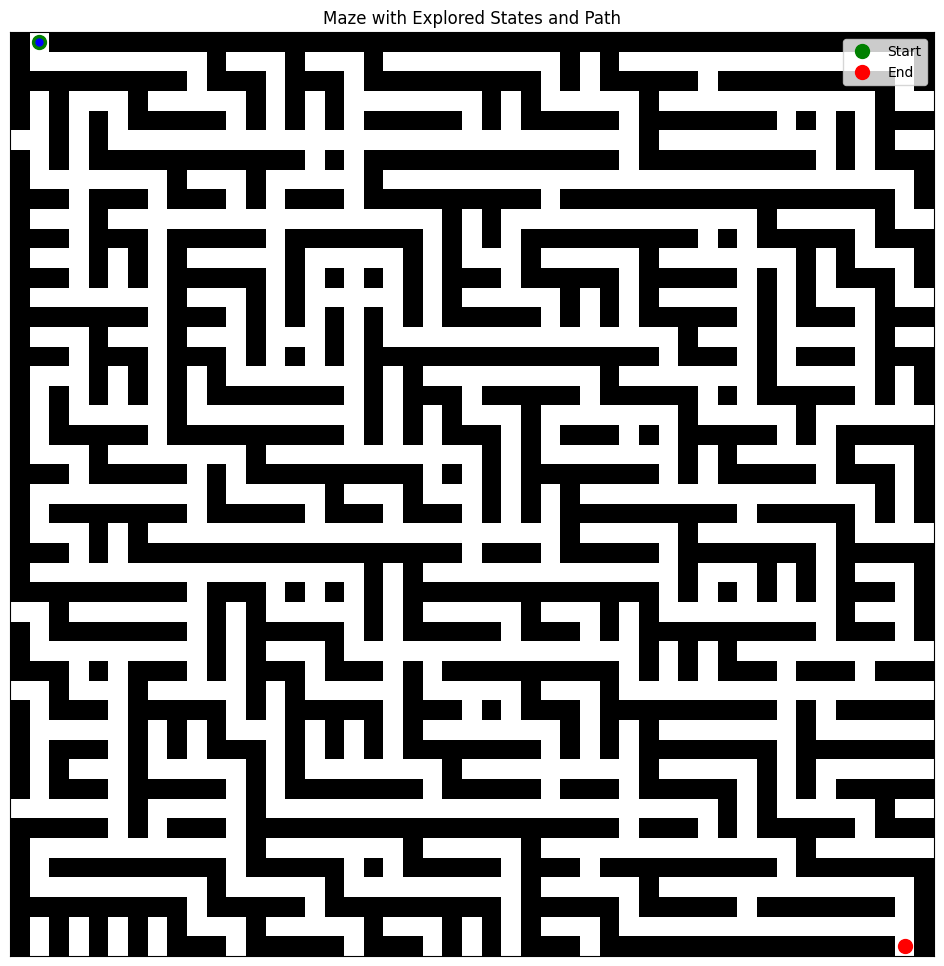

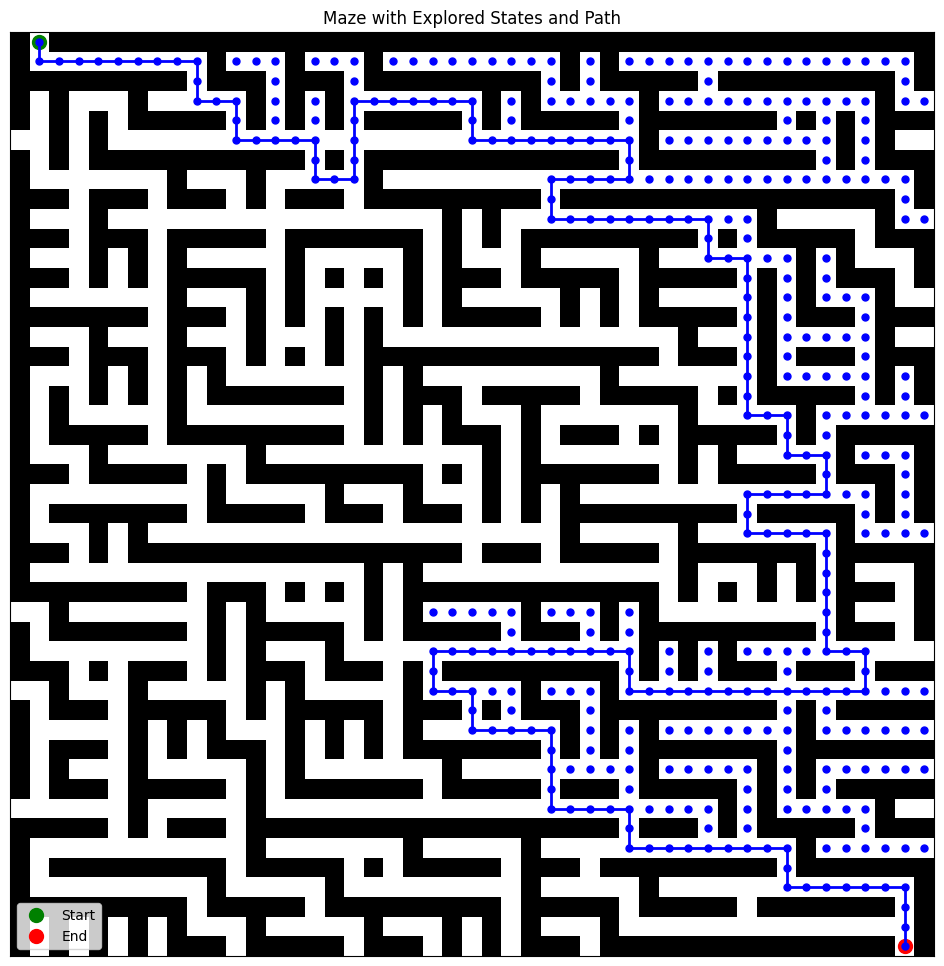

In [ ]:
solution_path_IDS, max_frontier_size_IDS, explored_cells_IDS= iterative_deepening_search(problem)

In [ ]:
# Print IDS Results

if solution_path_IDS:
       print("Explored States:", explored_cells_IDS)
       print("Cost: ", len(explored_cells_IDS))

       print("\n")
       print("Solution Path:", solution_path_IDS[0])
       print("Number of Actions in the Solution Path:", len(solution_path_IDS[0]))

       print("\n")
       print("Max Frontier Size: ", max_frontier_size_IDS)

else:
    print("No solution found.")

Explored States: [(0, 1), (1, 1), (1, 2), (1, 3), (1, 4), (1, 5), (1, 6), (1, 7), (1, 8), (1, 9), (2, 9), (3, 9), (3, 10), (3, 11), (4, 11), (5, 11), (5, 12), (5, 13), (4, 13), (3, 13), (2, 13), (1, 13), (1, 12), (1, 11), (5, 14), (5, 15), (4, 15), (3, 15), (6, 15), (7, 15), (7, 16), (7, 17), (6, 17), (5, 17), (4, 17), (3, 17), (2, 17), (1, 17), (1, 16), (1, 15), (3, 18), (3, 19), (3, 20), (3, 21), (3, 22), (3, 23), (4, 23), (5, 23), (5, 24), (5, 25), (4, 25), (3, 25), (5, 26), (5, 27), (5, 28), (5, 29), (5, 30), (5, 31), (4, 31), (3, 31), (3, 30), (3, 29), (2, 29), (1, 29), (3, 28), (3, 27), (2, 27), (1, 27), (1, 26), (1, 25), (1, 24), (1, 23), (1, 22), (1, 21), (1, 20), (1, 19), (6, 31), (7, 31), (7, 32), (7, 33), (7, 34), (7, 35), (7, 36), (7, 37), (7, 38), (7, 39), (7, 40), (7, 41), (6, 41), (5, 41), (4, 41), (3, 41), (3, 42), (3, 43), (4, 43), (5, 43), (6, 43), (7, 43), (7, 44), (7, 45), (8, 45), (9, 45), (9, 46), (7, 42), (3, 40), (3, 39), (4, 39), (5, 39), (5, 40), (5, 38), (5, 

## **D) Uniform Cost Search (UCS)**

In [ ]:
# UCS Implementation

def uniform_cost_search(problem, verbose=False):

    explored_c = []
    c = 0
    node = Node.root(problem.init_state)
    frontier = [(node.path_cost, node)]
    explored = set()
    explored_states_list = []
    max_frontier_size = 1

    while frontier:
        _, node = heapq.heappop(frontier)

        if problem.goal_test(node.state):
            visualize_path_with_cost(maze, explored_states_list, start_state, goal_state, cost_matrix, show_path=True, show_explored=True)
            time.sleep(0.5)
            explored_cells = [n.state for n in explored_states_list]
            return solutions(node), max_frontier_size, explored_c

        explored_c.append(node.state)
        explored.add(node.state)
        explored_states_list.append(node)

        for action in problem.actions(node.state):
            child = Node.child(problem, node, action)

            if child.state not in explored and child not in (n[1] for n in frontier):
                heapq.heappush(frontier, (child.path_cost, child))

            if child.state in frontier:
              for i, (cost, frontier_node) in enumerate(frontier):
                  if frontier_node.state == child.state:
                      if child.path_cost < cost:
                          frontier[i] = (child.path_cost, child)
                          heapq.heapify(frontier)
                      break

            # Visualize explored states only
            if (c % 550) == 0:
                visualize_path_with_cost(maze, explored_states_list, start_state, goal_state, cost_matrix, show_path=False, show_explored=True)
                time.sleep(0.5)
            c = c + 1

        # Update max_frontier_size
        max_frontier_size = max(max_frontier_size, len(frontier))

    return None, None, None

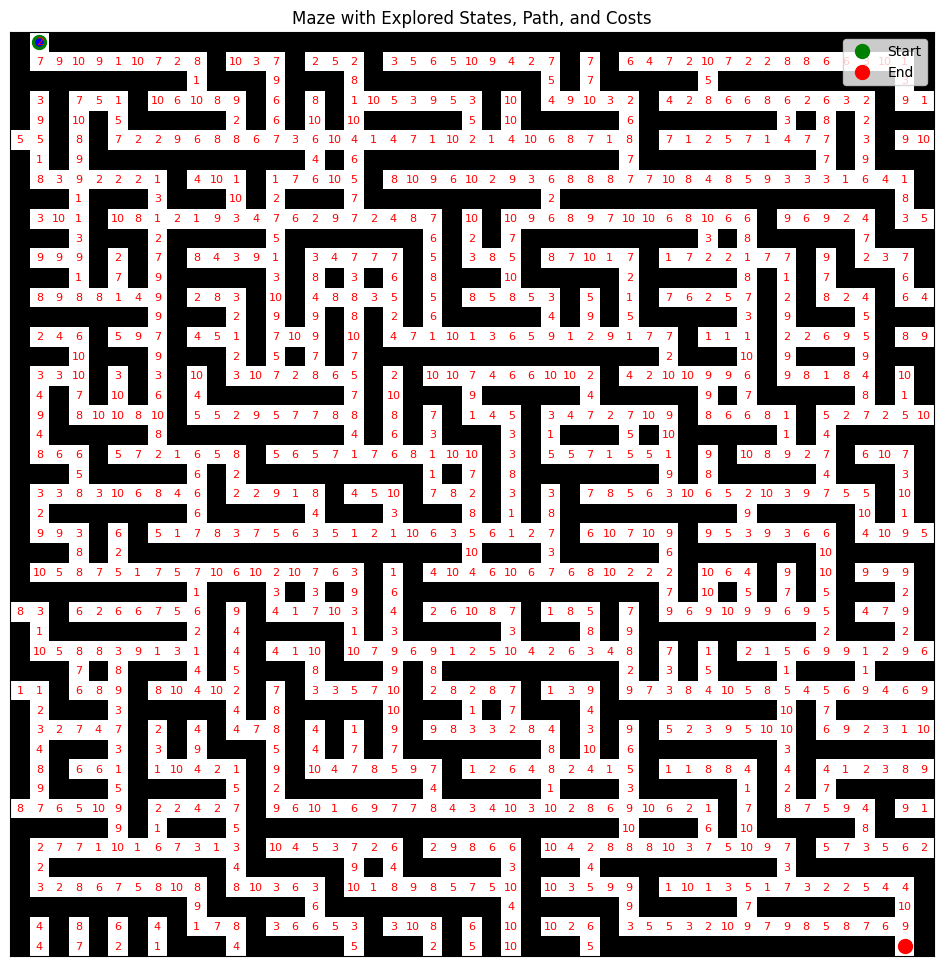

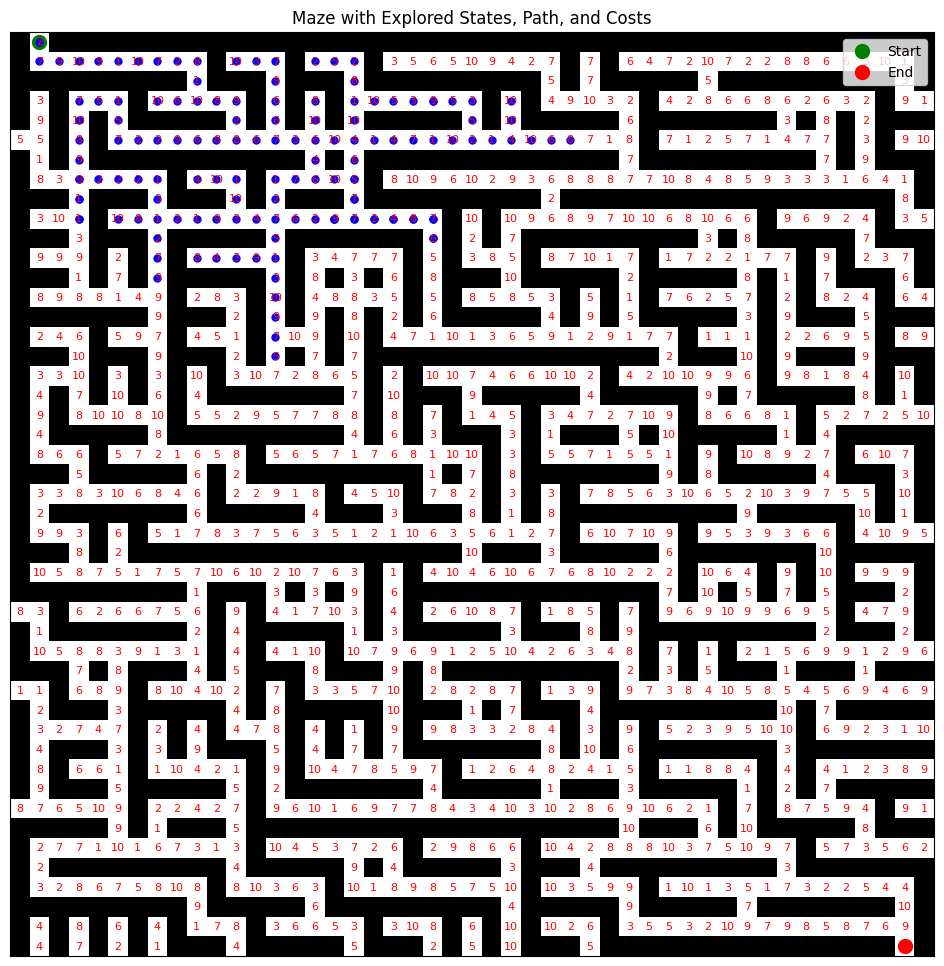

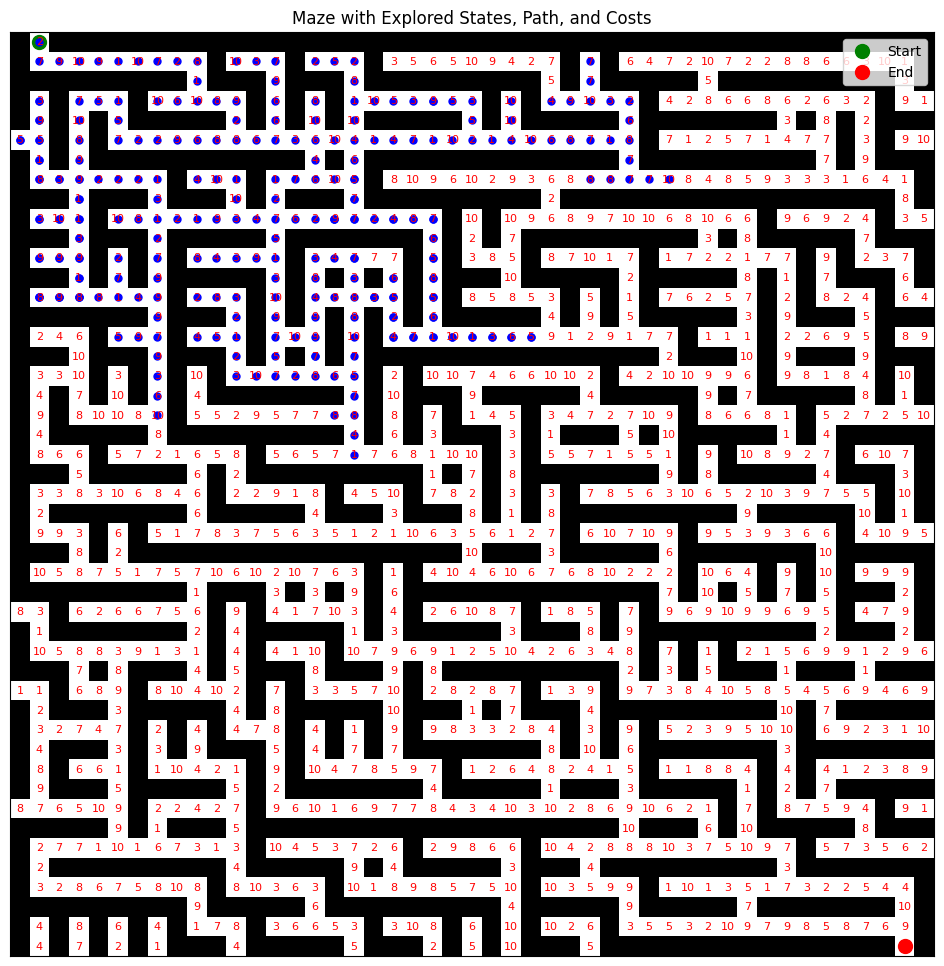

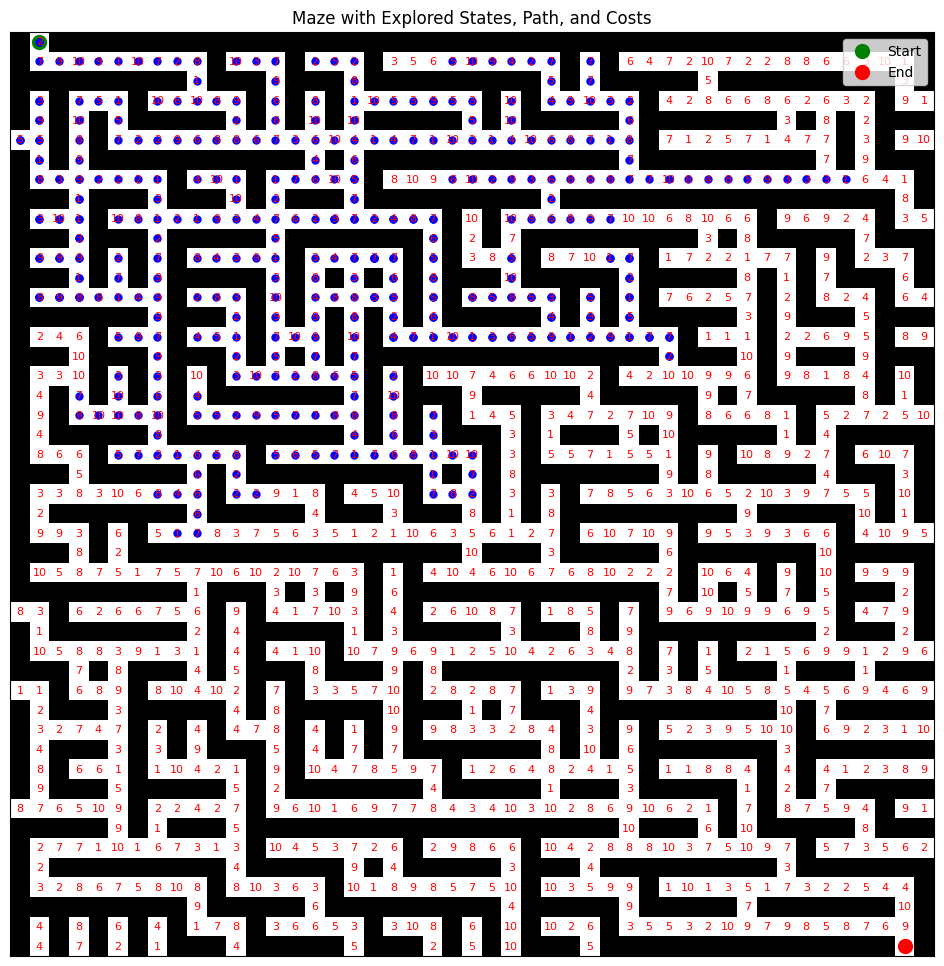

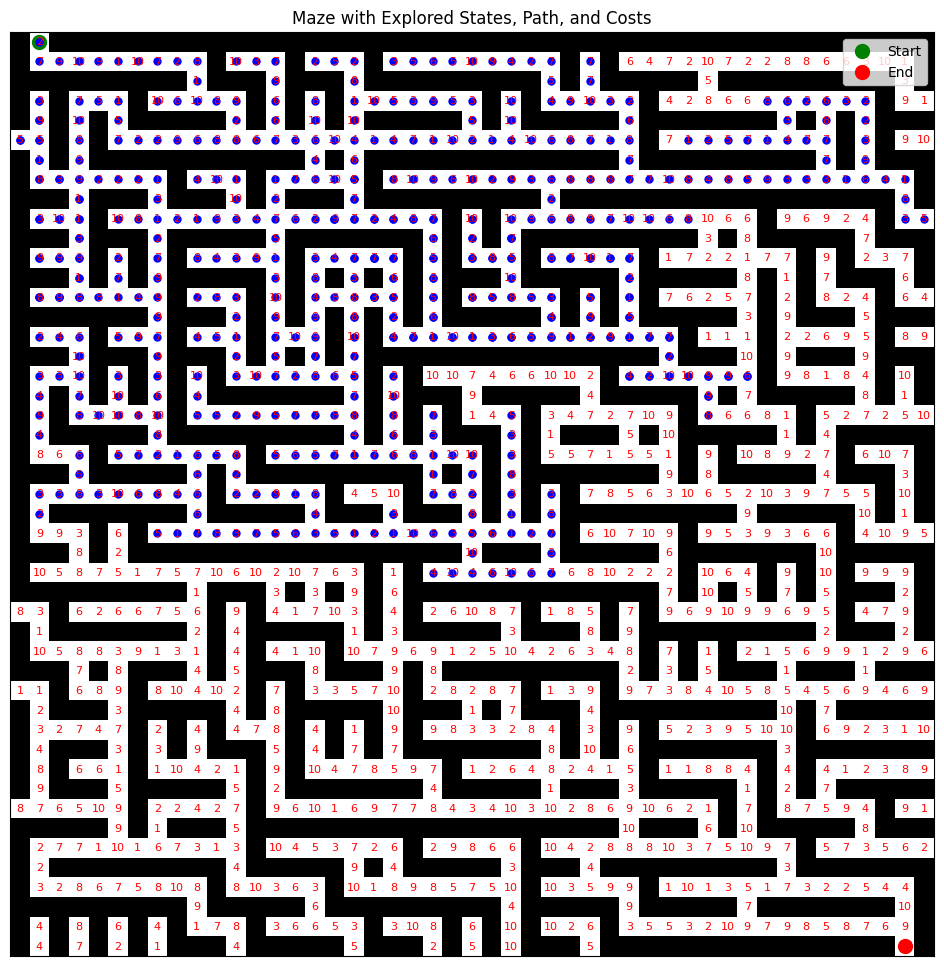

...

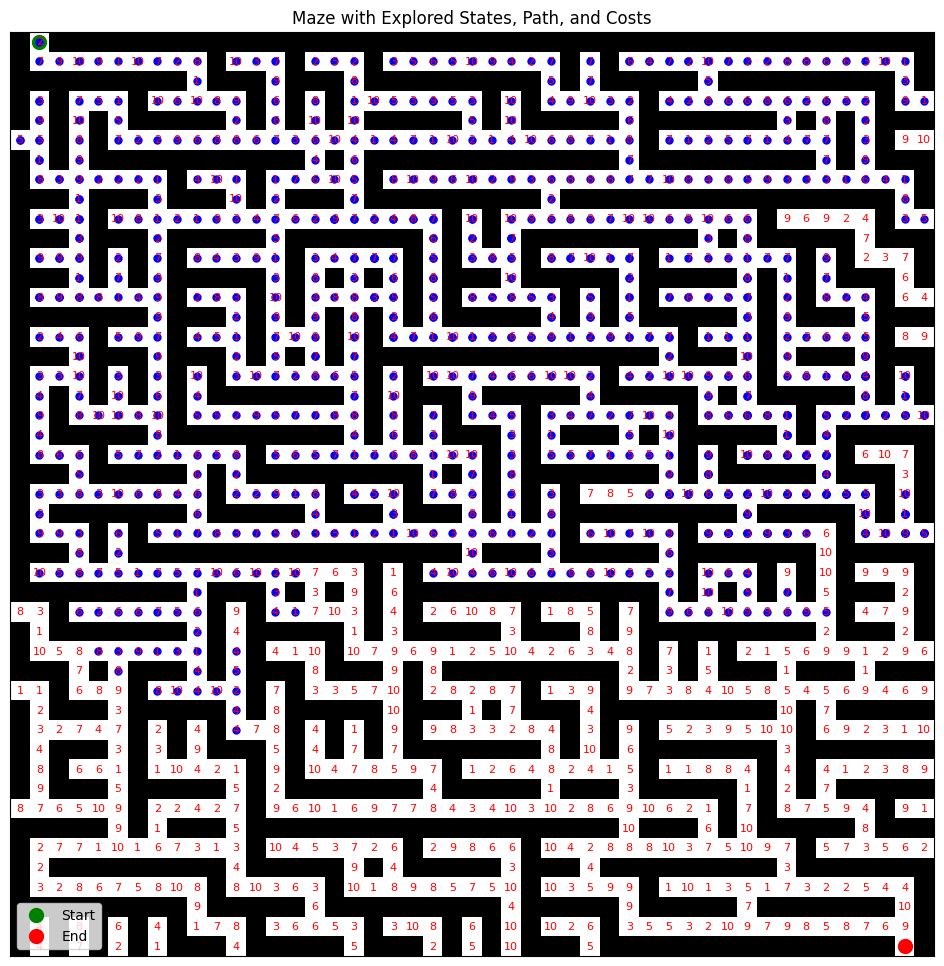

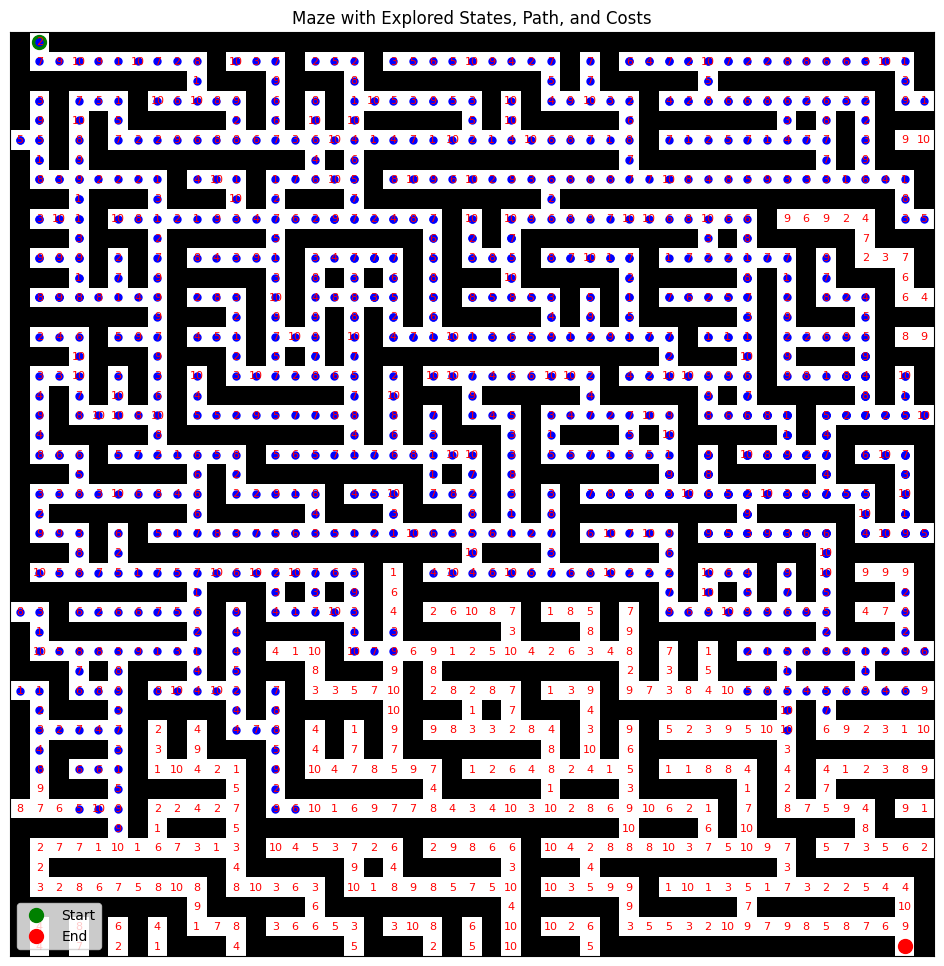

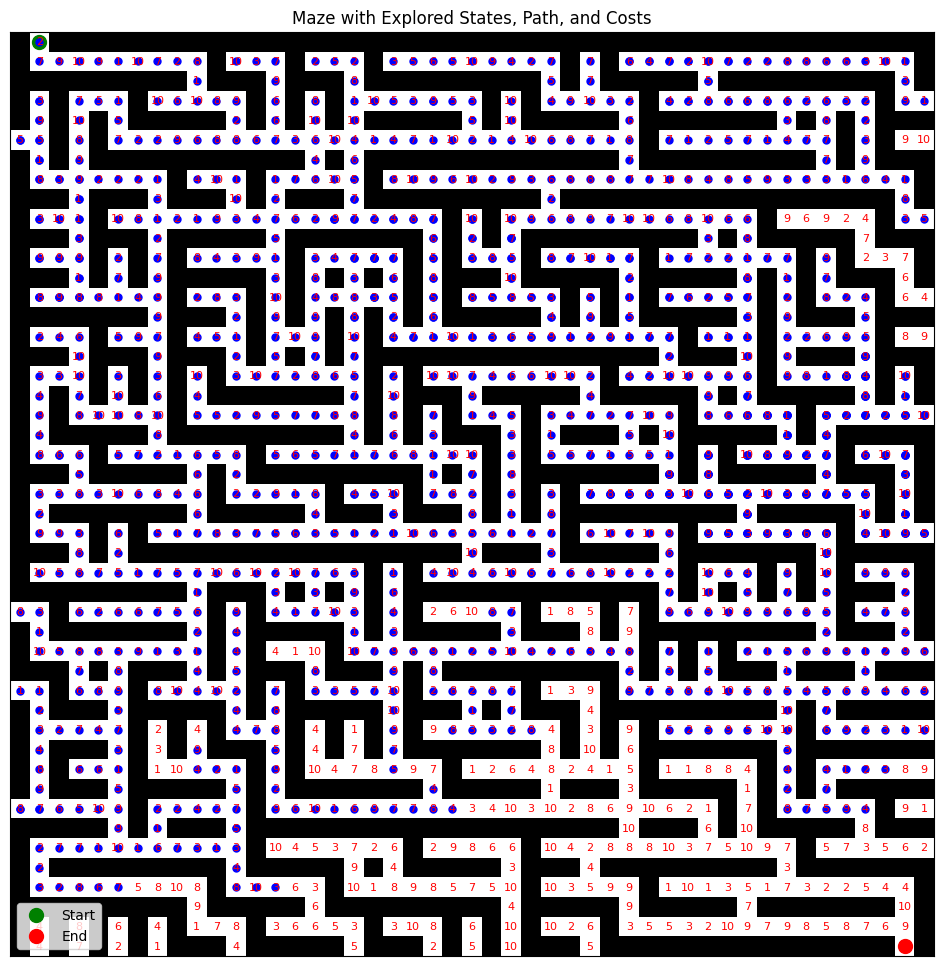

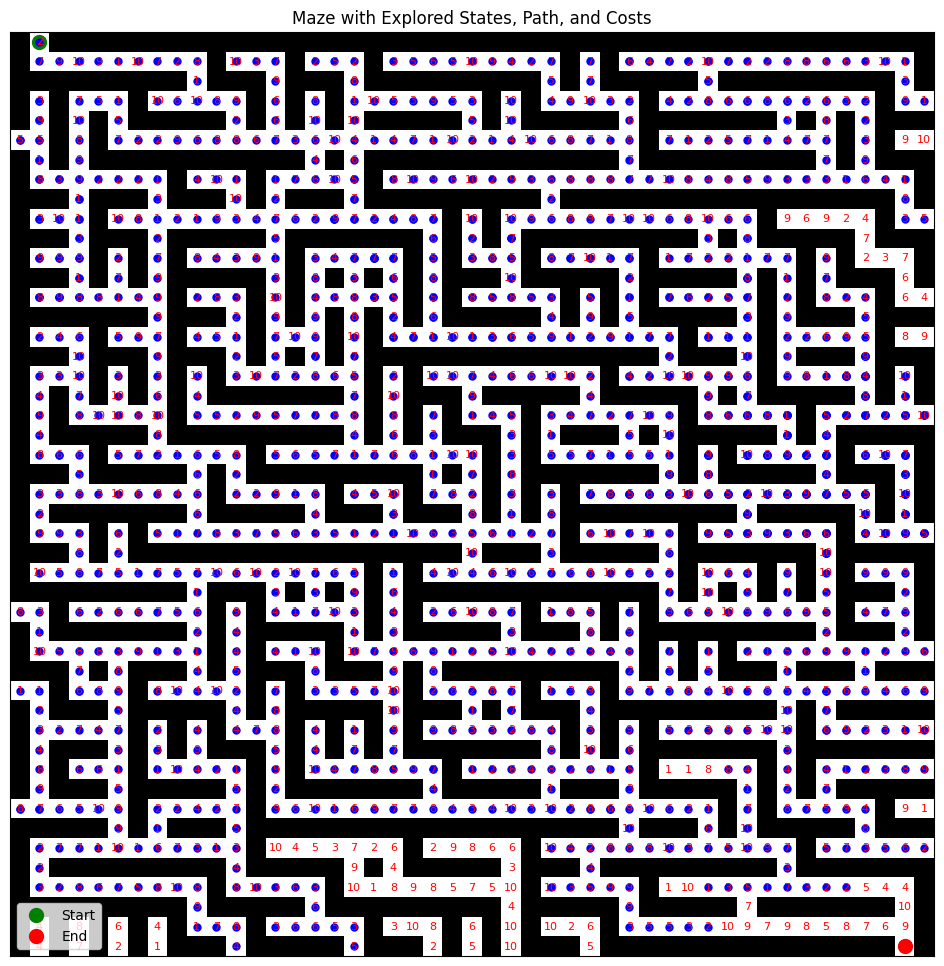

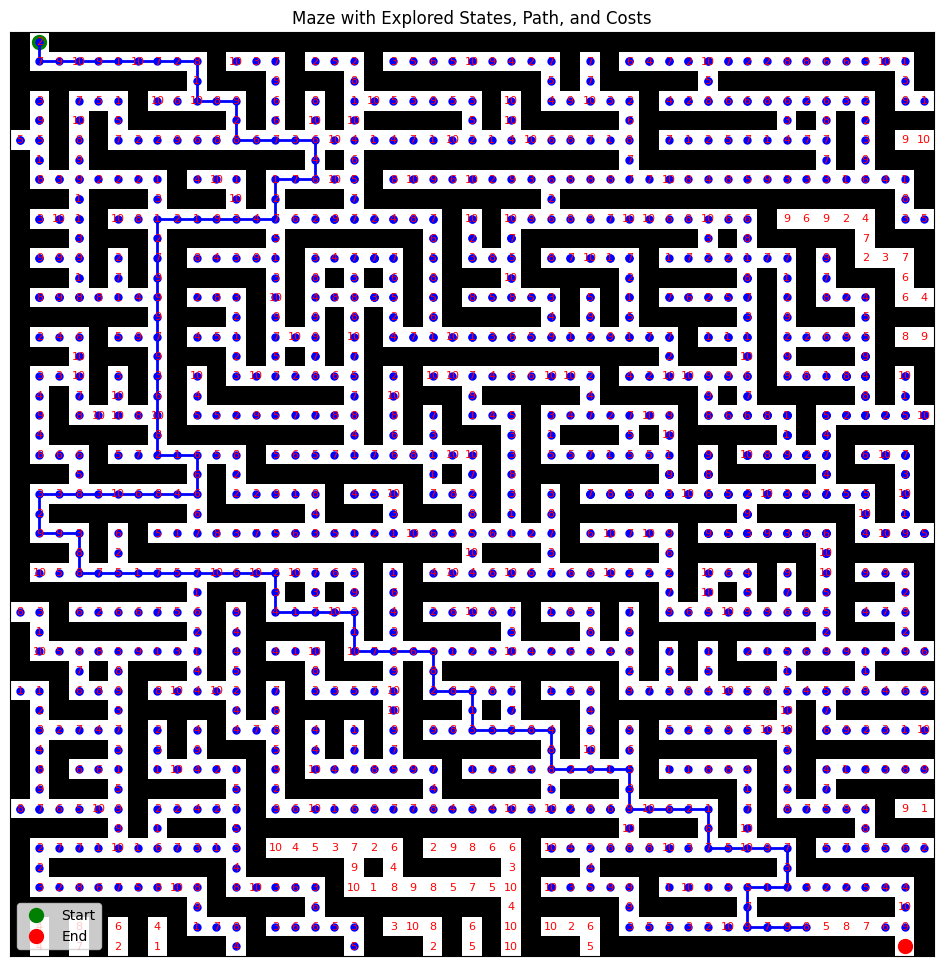

In [ ]:
solution_path_ucs, max_frontier_size_ucs, explored_cells_ucs = uniform_cost_search(problem)

In [ ]:
# Calculate the total cost from the Initial state to the Goal state
total_explored_cost_ucs = sum(cost_matrix[row, col] for row, col in explored_cells_ucs)

# Print UCS Results
if solution_path_ucs:
       print("Explored States:", explored_cells_ucs)
       print("Cost: ", total_explored_cost_ucs)

       print("\n")
       print("Solution Path:", solution_path_ucs[0])
       print("Number of Actions in the Solution Path:", len(solution_path_ucs[0]))

       print("\n")
       print("Max Frontier Size: ", max_frontier_size_ucs)

else:
    print("No solution found.")

Explored States: [(0, 1), (1, 1), (1, 2), (1, 3), (1, 4), (1, 5), (1, 6), (1, 7), (1, 8), (1, 9), (2, 9), (3, 9), (3, 8), (3, 10), (3, 7), (3, 11), (4, 11), (5, 11), (5, 12), (5, 10), (5, 13), (5, 9), (5, 14), (4, 13), (5, 15), (5, 8), (3, 13), (5, 7), (6, 15), (5, 6), (4, 15), (7, 15), (5, 16), (5, 5), (2, 13), (5, 17), (5, 18), (4, 5), (7, 14), (3, 15), (3, 5), (7, 13), (1, 13), (5, 19), (8, 13), (7, 16), (6, 17), (1, 12), (3, 4), (4, 17), (7, 17), (3, 17), (7, 17), (5, 20), (9, 13), (5, 21), (3, 3), (9, 12), (1, 11), (8, 17), (8, 17), (10, 13), (2, 17), (9, 14), (11, 13), (9, 11), (3, 18), (1, 17), (9, 15), (12, 13), (5, 22), (9, 17), (9, 17), (5, 23), (4, 3), (5, 24), (1, 16), (3, 19), (9, 18), (9, 18), (1, 15), (11, 12), (3, 20), (9, 10), (4, 23), (9, 9), (8, 11), (9, 16), (5, 25), (9, 19), (9, 19), (11, 11), (7, 11), (13, 13), (9, 8), (3, 23), (9, 7), (9, 16), (9, 16), (5, 3), (11, 10), (10, 7), (8, 7), (7, 7), (3, 22), (3, 21), (7, 6), (9, 20), (9, 20), (5, 26), (4, 25), (7, 5),

# **4) Heuristic Search:**

In [ ]:
# First Heuristic Function:

def manhattan_distance(node):
  """Calculates the Manhattan distance between the node's state and the goal state."""
  row, col = node.state
  goal_row, goal_col = problem.goal_state
  return abs(row - goal_row) + abs(col - goal_col)

In [ ]:
# Second Heuristic Function:

def euclidean_distance(node):
  """Calculates the Euclidean distance between the node's state and the goal state."""
  row, col = node.state
  goal_row, goal_col = problem.goal_state
  return np.sqrt((row - goal_row)**2 + (col - goal_col)**2)

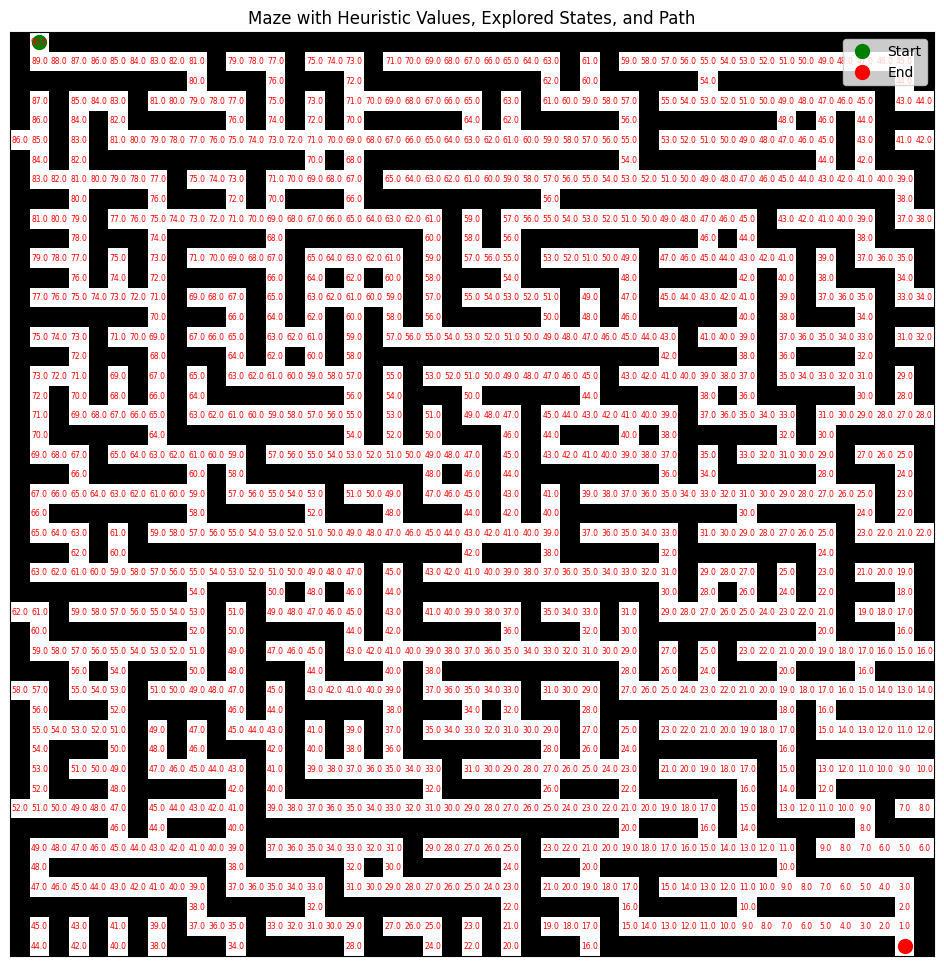

In [ ]:
# Visualize the Maze with Manhatan heuristic values on it
visualize_maze_with_heuristic(maze, manhattan_distance, start_state, goal_state)

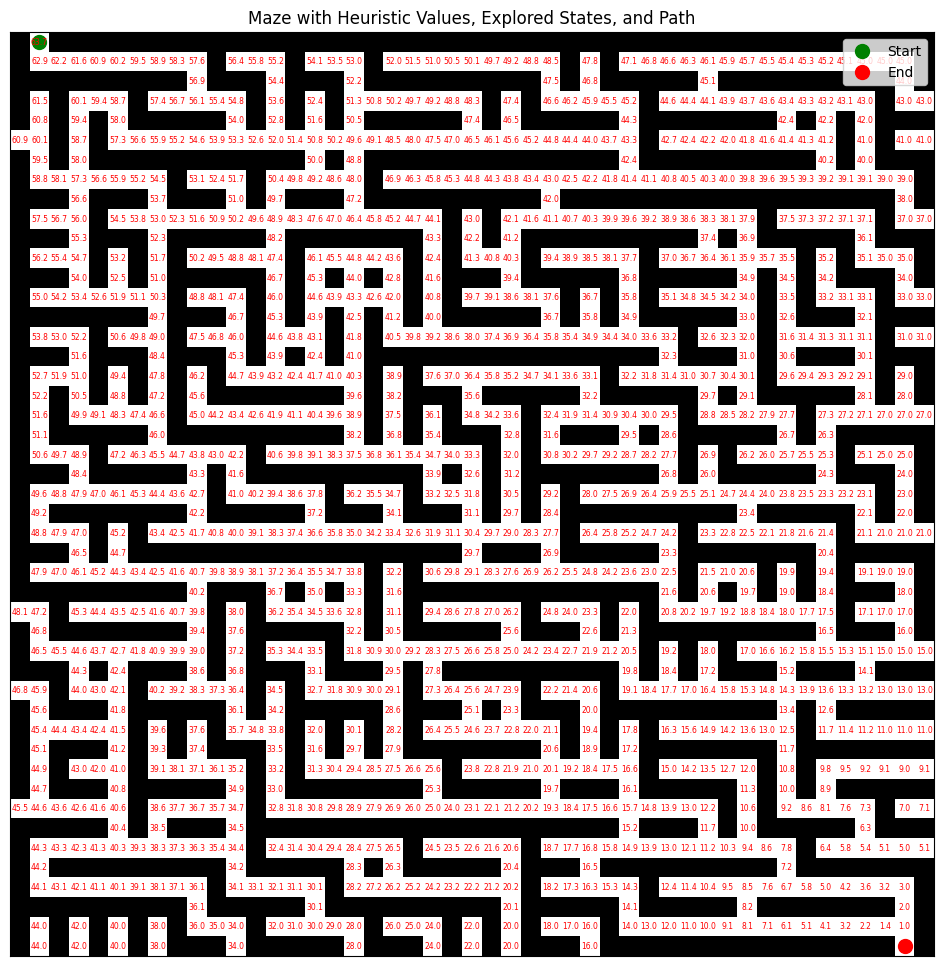

In [ ]:
# Visualize the Maze with Manhatan heuristic values on it
visualize_maze_with_heuristic(maze, euclidean_distance, start_state, goal_state)

## **A) Greedy Best First Algorithm**

In [ ]:
# Greaddy Best First Algorithm Implementation from Labs

def greedy_best_first_graph_search(problem, h=None, verbose=False):
    c = 0
    explored_cells = []
    h = h or problem.h
    node = Node.root(problem.init_state)
    frontier = [(h(node), node)]
    explored = set()

    # To store explored states for visualization
    explored_states_list = []
    max_frontier_size = 1

    while frontier:
        _, node = heappop(frontier)
        if problem.goal_test(node.state):
            total_cost = node.path_cost
            visualize_maze_with_heuristic(maze, h, start_state, goal_state, explored_states=explored_states_list, show_path=True, show_explored=True)
            time.sleep(0.5)
            return solutions(node), max_frontier_size, explored_cells

        explored.add(node.state)
        explored_cells.append(node.state)
        explored_states_list.append(node)

        for action in problem.actions(node.state):
            child = Node.child(problem, node, action)
            if child.state not in explored and all(c.state != child.state for _, c in frontier):
                heappush(frontier, (h(child), child))
                if problem.goal_test(child.state):
                    total_cost = child.path_cost
                    visualize_maze_with_heuristic(maze, h, start_state, goal_state, explored_states=explored_states_list, show_path=True, show_explored=True)
                    time.sleep(0.5)
                    return solutions(child), max_frontier_size, explored_cells
            if (c % 1000) == 0:
              visualize_maze_with_heuristic(maze, h, start_state, goal_state, explored_states=explored_states_list, show_path=False, show_explored=True)
              time.sleep(0.5)
            c = c + 1
        max_frontier_size = max(max_frontier_size, len(frontier))

    return None, None, None

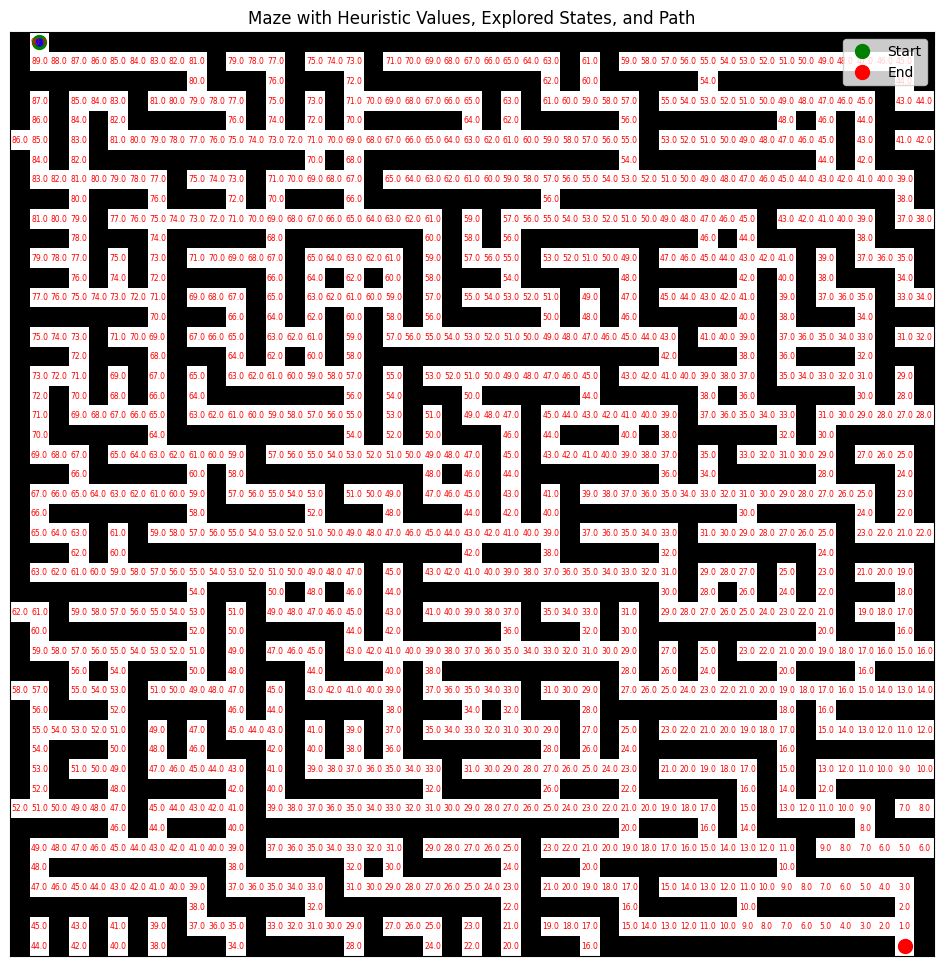

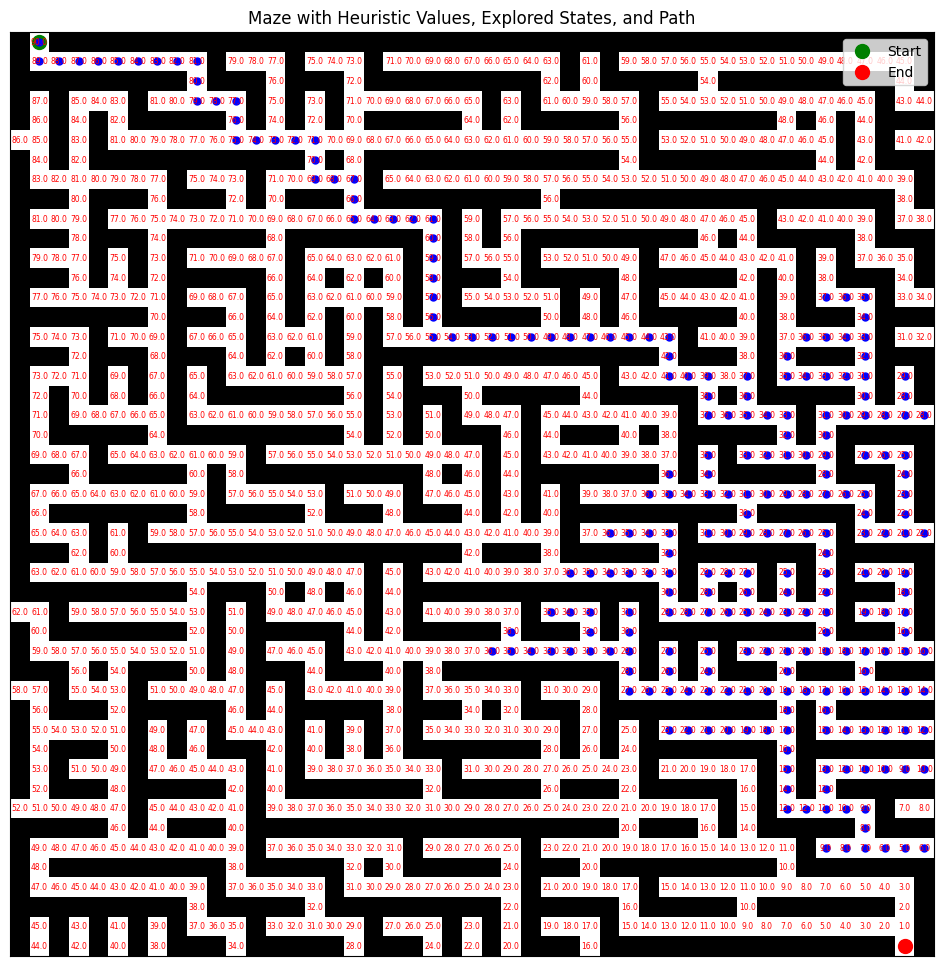

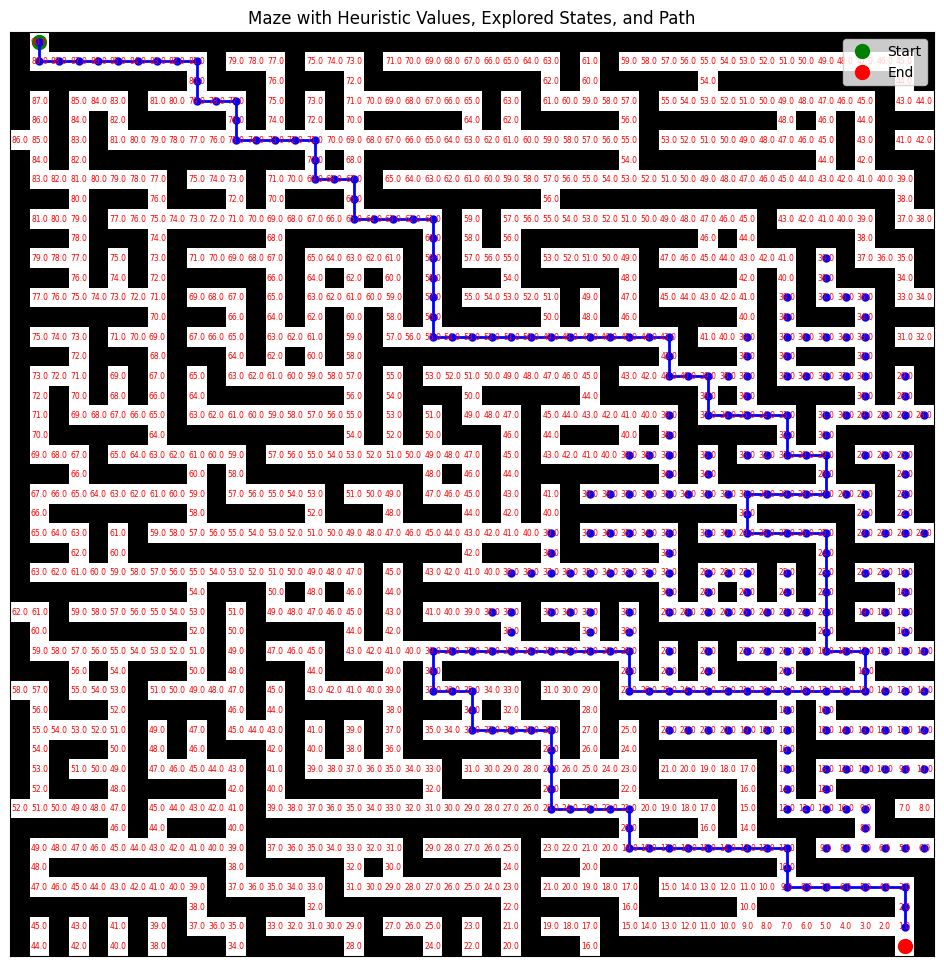

In [ ]:
# Using Manhattan distance with Greedy Best-First search
solution_path_gbfs_1, max_frontier_size_gbfs_1, explored_cells_gbfs_1 = greedy_best_first_graph_search(problem, h=manhattan_distance)

In [ ]:
# Calculate the total Heuristic from the Initial state to the Goal state with manhattan_distance

heuristic_values_gbfs_1 = []
for cell in explored_cells_gbfs_1:
    dummy_node = Node(state=cell, parent=None, action=None, path_cost=0)
    heuristic_value = manhattan_distance(dummy_node)
    heuristic_values_gbfs_1.append(heuristic_value)

In [ ]:
# Print Greedy Best First Search Results With Manhattan Heuristic Values

if solution_path_gbfs_1:
       print("Explored States:", explored_cells_gbfs_1)
       print("Cost Using Heuristic: ", sum(heuristic_values_gbfs_1))

       print("\n")
       print("Solution Path:", solution_path_gbfs_1[0])
       print("Number of Actions in the Solution Path:", len(solution_path_gbfs_1[0]))

       print("\n")
       print("Max Frontier Size: ", max_frontier_size_gbfs_1)

else:
    print("No solution found.")

Explored States: [(0, 1), (1, 1), (1, 2), (1, 3), (1, 4), (1, 5), (1, 6), (1, 7), (1, 8), (1, 9), (2, 9), (3, 9), (3, 10), (3, 11), (4, 11), (5, 11), (5, 12), (5, 13), (5, 14), (5, 15), (6, 15), (7, 15), (7, 16), (7, 17), (8, 17), (9, 17), (9, 18), (9, 19), (9, 20), (9, 21), (10, 21), (11, 21), (12, 21), (13, 21), (14, 21), (15, 21), (15, 22), (15, 23), (15, 24), (15, 25), (15, 26), (15, 27), (15, 28), (15, 29), (15, 30), (15, 31), (15, 32), (15, 33), (16, 33), (17, 33), (17, 34), (17, 35), (18, 35), (19, 35), (19, 36), (19, 37), (19, 38), (19, 39), (20, 39), (21, 39), (21, 40), (21, 41), (22, 41), (23, 41), (23, 42), (23, 43), (24, 43), (25, 43), (25, 44), (25, 45), (24, 45), (25, 46), (23, 45), (22, 45), (21, 45), (21, 44), (21, 43), (23, 40), (23, 39), (20, 41), (23, 38), (19, 41), (19, 42), (19, 43), (19, 44), (19, 45), (18, 45), (19, 46), (17, 45), (18, 43), (17, 43), (23, 37), (24, 37), (25, 37), (25, 38), (25, 39), (25, 40), (25, 41), (26, 41), (27, 41), (28, 41), (29, 41), (30,

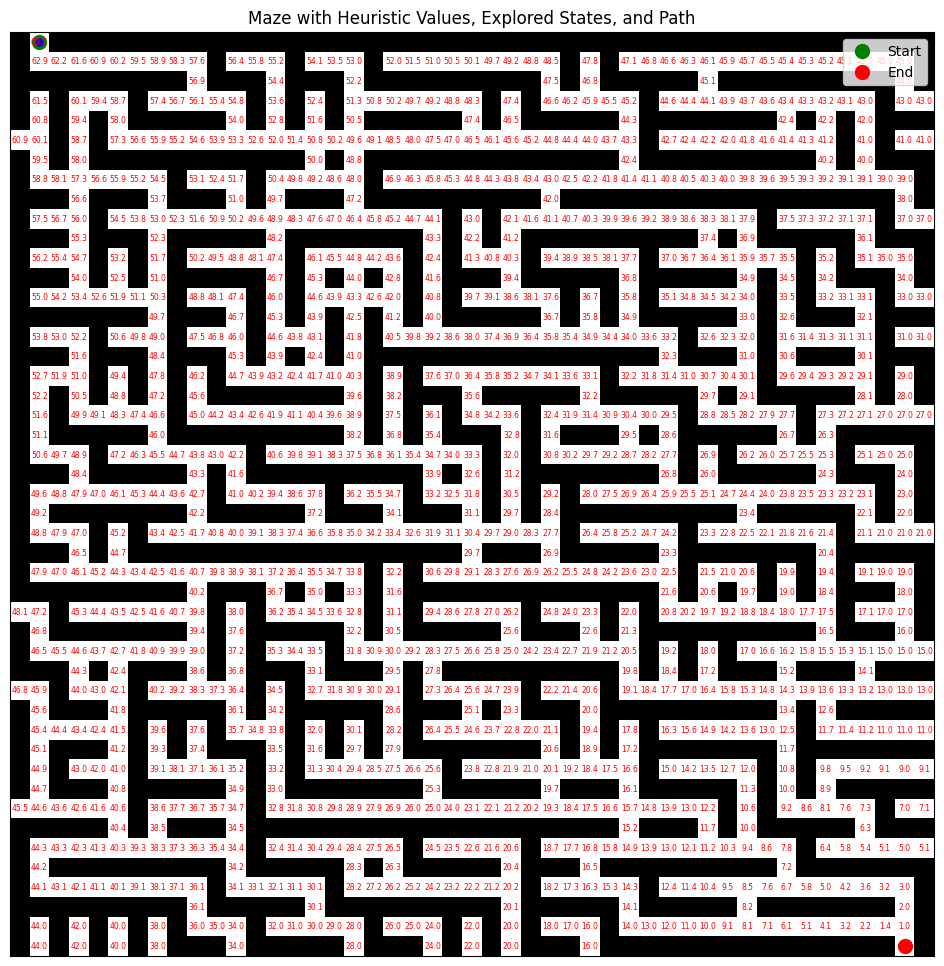

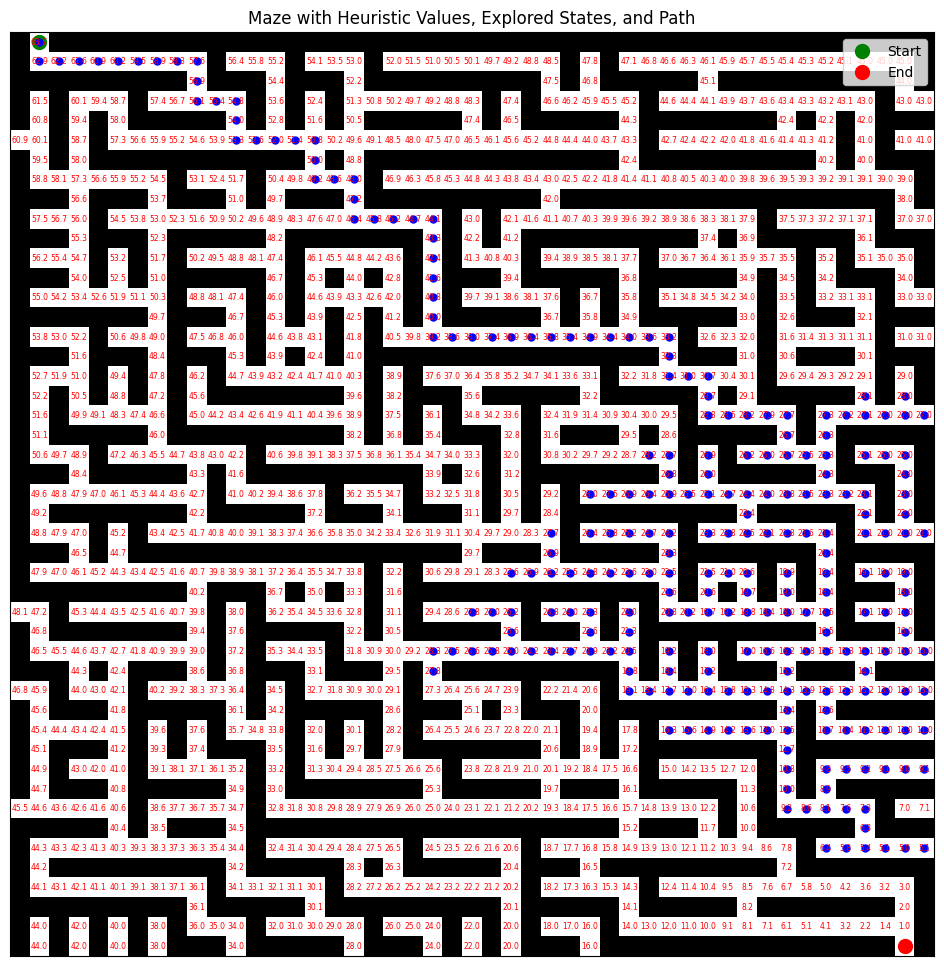

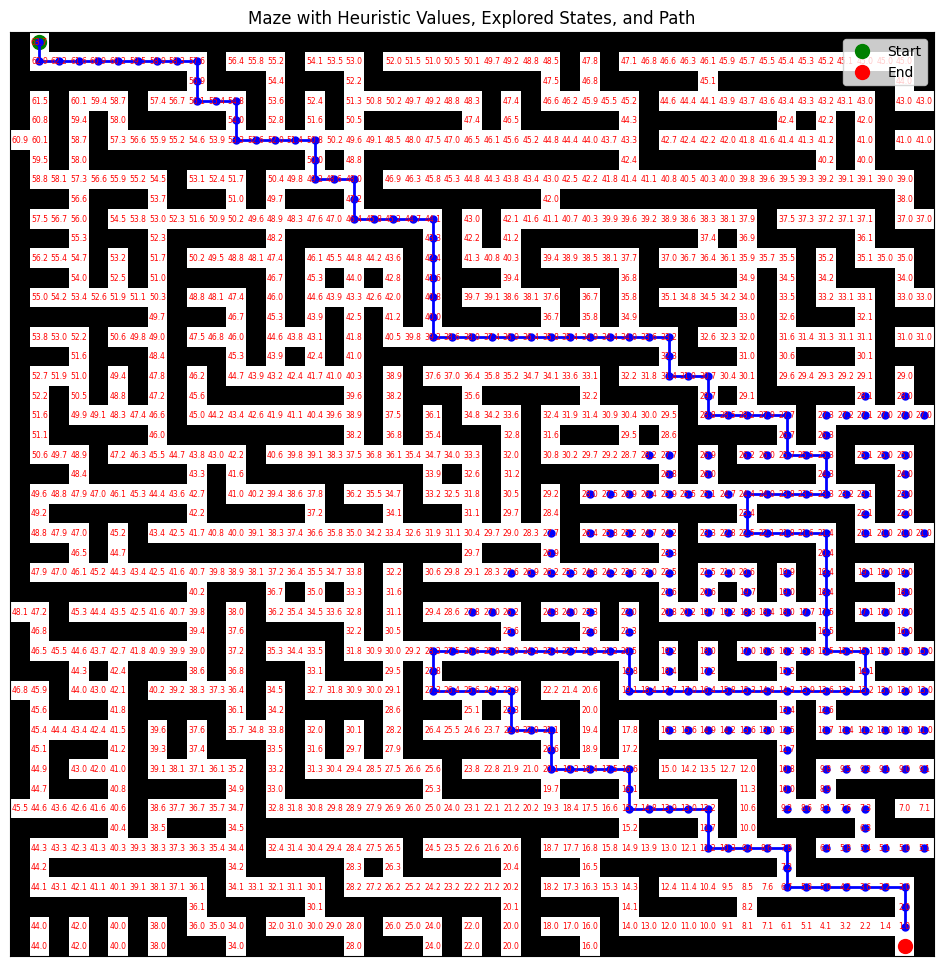

In [ ]:
# Using Euclidean distance with Greedy Best-First search
solution_path_gbfs_2, max_frontier_size_gbfs_2, explored_cells_gbfs_2 = greedy_best_first_graph_search(problem, h=euclidean_distance)

In [ ]:
# Calculate the total Heuristic from the Initial state to the Goal state with Eculidian Distance

heuristic_values_gbfs_2 = []
for cell in explored_cells_gbfs_2:
    dummy_node = Node(state=cell, parent=None, action=None, path_cost=0)
    heuristic_value2 = euclidean_distance(dummy_node)
    heuristic_values_gbfs_2.append(heuristic_value2)

In [ ]:
# Print Greedy Best First Search Results With Euclidian Heuristic Values

if solution_path_gbfs_2:
       print("Explored States:", explored_cells_gbfs_2)
       print("Cost Using Heuristic: ", sum(heuristic_values_gbfs_2))

       print("\n")
       print("Solution Path:", solution_path_gbfs_2[0])
       print("Number of Actions in the Solution Path:", len(solution_path_gbfs_2[0]))

       print("\n")
       print("Max Frontier Size: ", max_frontier_size_gbfs_2)

else:
    print("No solution found.")

Explored States: [(0, 1), (1, 1), (1, 2), (1, 3), (1, 4), (1, 5), (1, 6), (1, 7), (1, 8), (1, 9), (2, 9), (3, 9), (3, 10), (3, 11), (4, 11), (5, 11), (5, 12), (5, 13), (5, 14), (5, 15), (6, 15), (7, 15), (7, 16), (7, 17), (8, 17), (9, 17), (9, 18), (9, 19), (9, 20), (9, 21), (10, 21), (11, 21), (12, 21), (13, 21), (14, 21), (15, 21), (15, 22), (15, 23), (15, 24), (15, 25), (15, 26), (15, 27), (15, 28), (15, 29), (15, 30), (15, 31), (15, 32), (15, 33), (16, 33), (17, 33), (17, 34), (17, 35), (18, 35), (19, 35), (19, 36), (19, 37), (19, 38), (19, 39), (20, 39), (21, 39), (21, 40), (21, 41), (22, 41), (23, 41), (23, 42), (23, 43), (24, 43), (25, 43), (25, 44), (25, 45), (25, 46), (24, 45), (23, 45), (23, 40), (23, 39), (22, 45), (23, 38), (23, 37), (24, 37), (25, 37), (25, 38), (25, 39), (25, 40), (25, 41), (26, 41), (27, 41), (28, 41), (29, 41), (30, 41), (31, 41), (31, 42), (31, 43), (32, 43), (33, 43), (33, 44), (33, 45), (33, 46), (33, 42), (33, 41), (34, 41), (35, 41), (35, 42), (35,

## **B) A Star Search Algorithm**

In [ ]:
def memoize(fn, attr_name):
    cache = {}

    def memoized_fn(node):
        if node not in cache:
            cache[node] = fn(node)
        return cache[node]

    return memoized_fn


In [ ]:
# Astar Algorithm Implementation from the Labs

def astar_search(problem, h=None, verbose=False):
    c = 0
    explored_cells = []
    """A* search with optional verbose output."""
    h = memoize(h or problem.h, 'h')  # Memoize the heuristic function for efficiency.
    node = Node.root(problem.init_state)
    frontier = [(h(node), 0, node)]  # Priority queue ordered by (f(n), tiebreaker, node)
    explored = set()
    max_frontier_size = 1
    explored_states_list = []

    while frontier:
        _, _, node = heappop(frontier)
        if problem.goal_test(node.state):
            visualize_maze_with_heuristic(maze, h, start_state, goal_state, explored_states=explored_states_list, show_path=True, show_explored=True)
            return solutions(node), max_frontier_size, explored_cells

        explored_states_list.append(node)
        explored_cells.append(node.state)
        explored.add(node.state)
        for action in problem.actions(node.state):
            child = Node.child(problem, node, action)
            f = child.path_cost + h(child)  # f(n) = g(n) + h(n)
            if child.state not in explored and all(c.state != child.state for _, _, c in frontier):
                heappush(frontier, (f, len(explored), child))  # Use len(explored) as a tiebreaker
                if problem.goal_test(child.state):
                    visualize_maze_with_heuristic(maze, h, start_state, goal_state, explored_states=explored_states_list, show_path=True, show_explored=True)
                    return solutions(child), max_frontier_size, explored_cells

            if (c % 1000) == 0:
              visualize_maze_with_heuristic(maze, h, start_state, goal_state, explored_states=explored_states_list, show_path=False, show_explored=True)
              time.sleep(0.5)
            c = c + 1

        max_frontier_size = max(max_frontier_size, len(frontier))
    return None, None, None


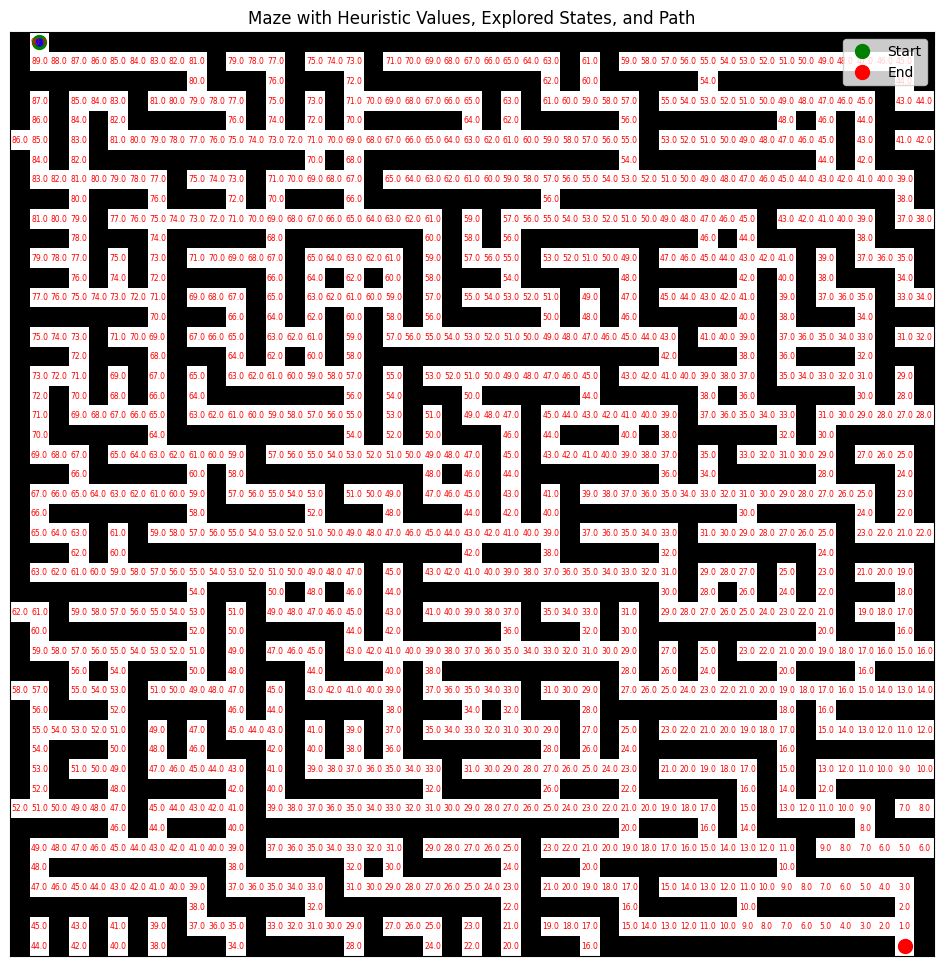

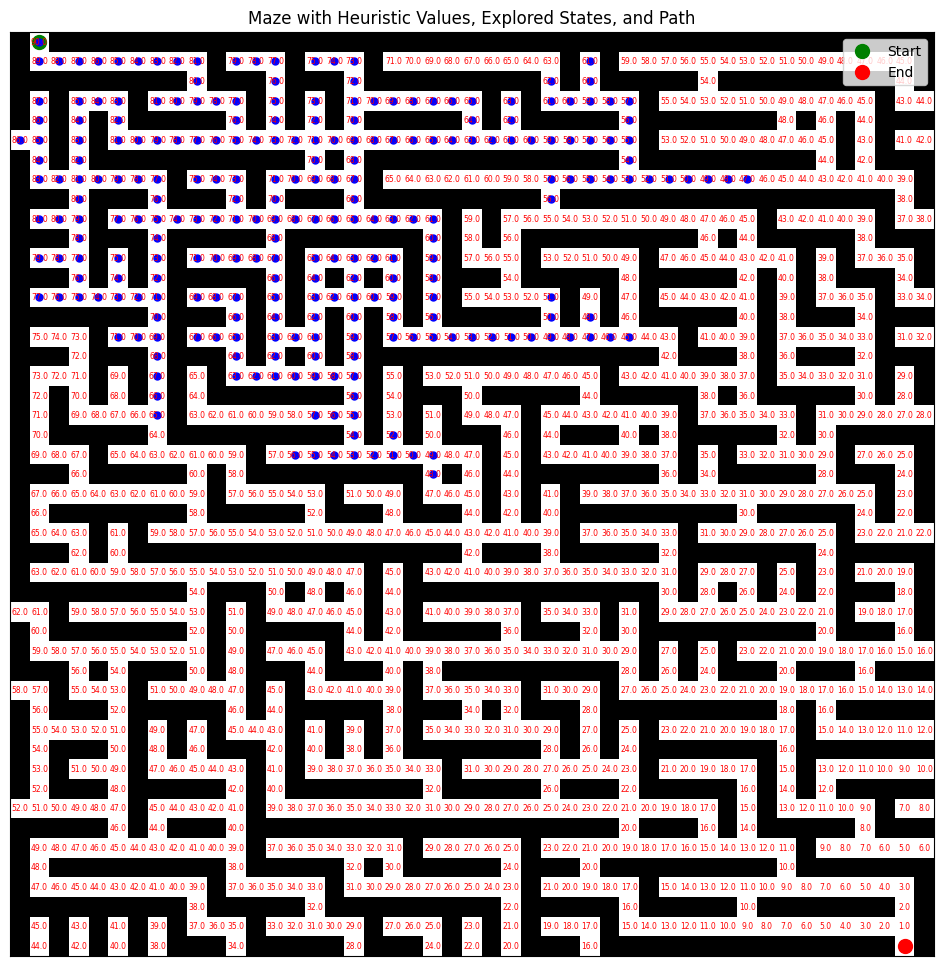

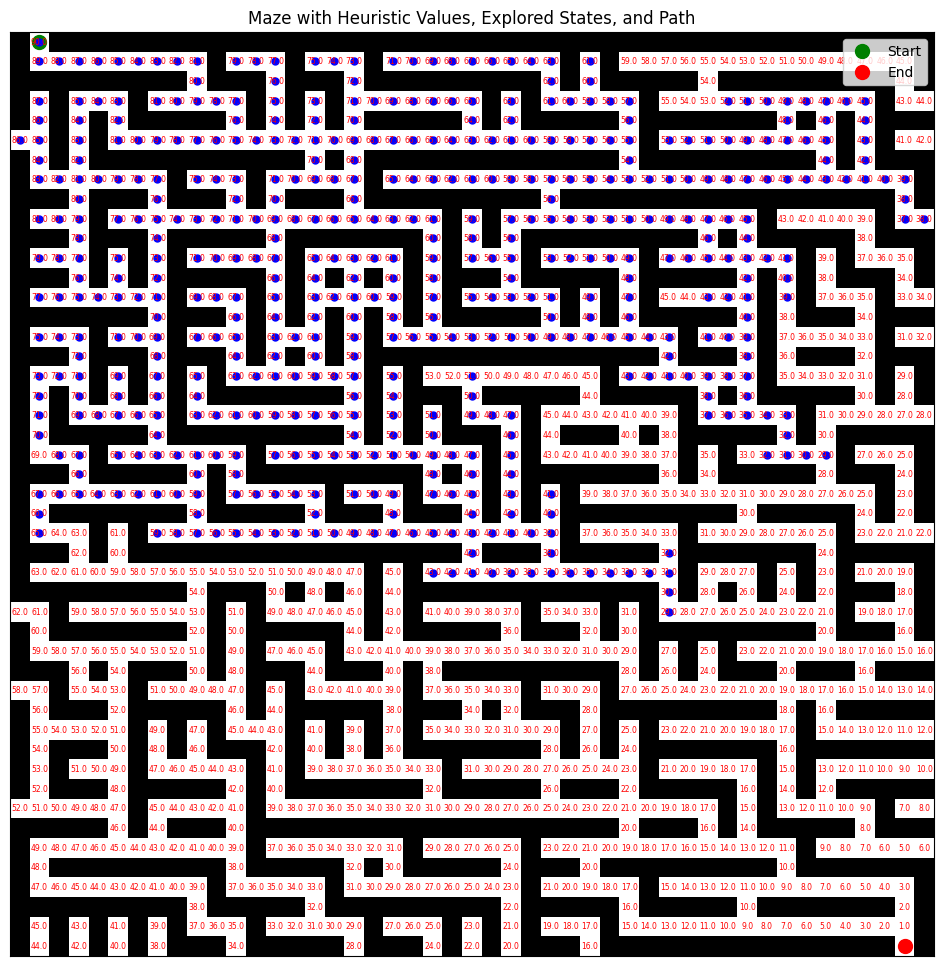

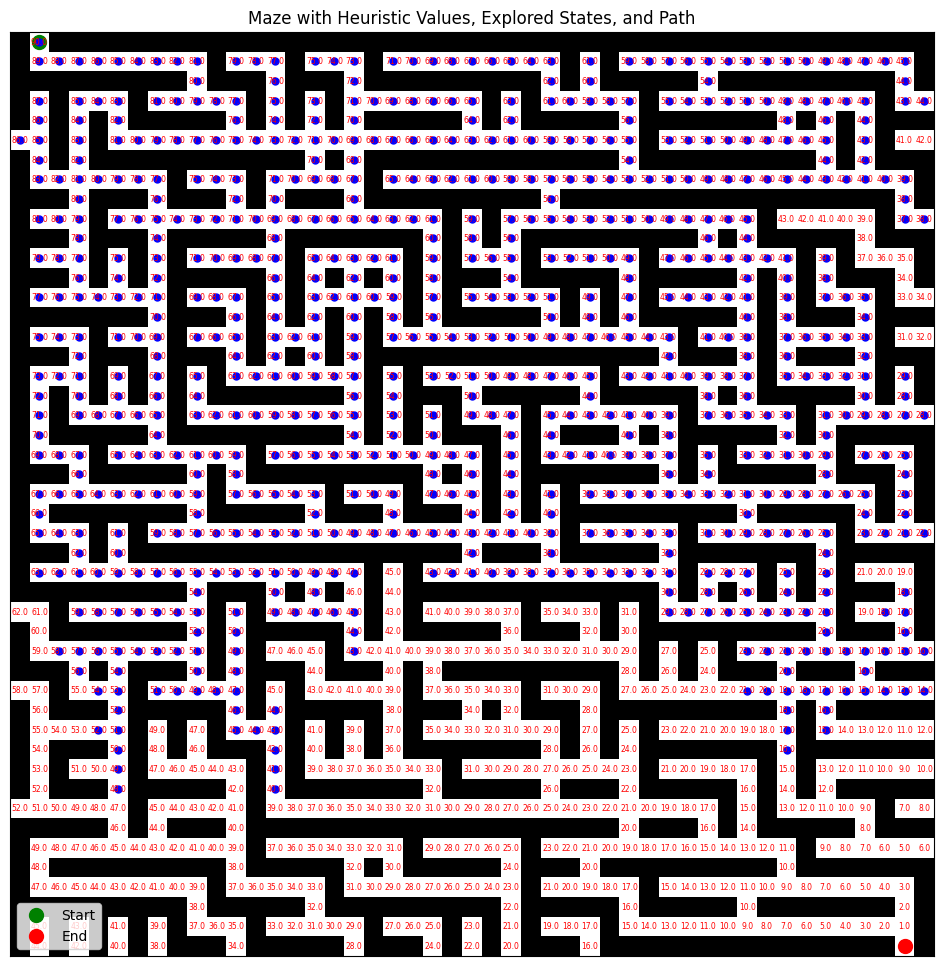

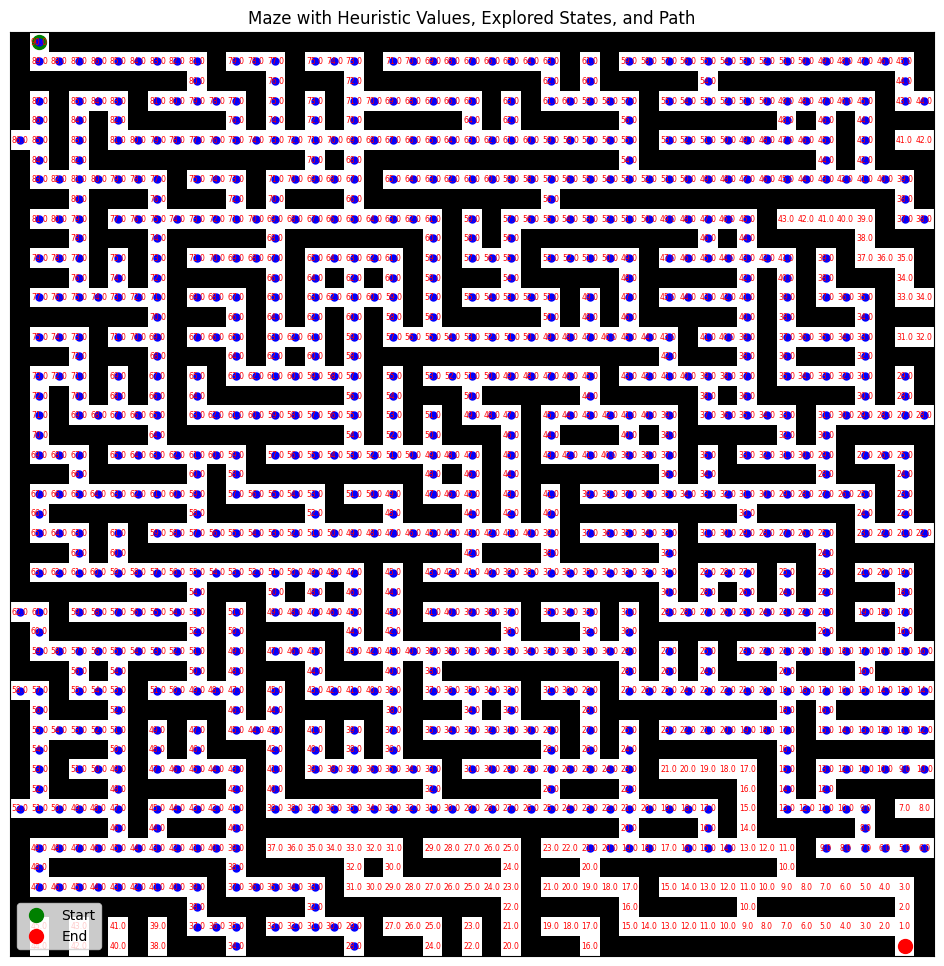

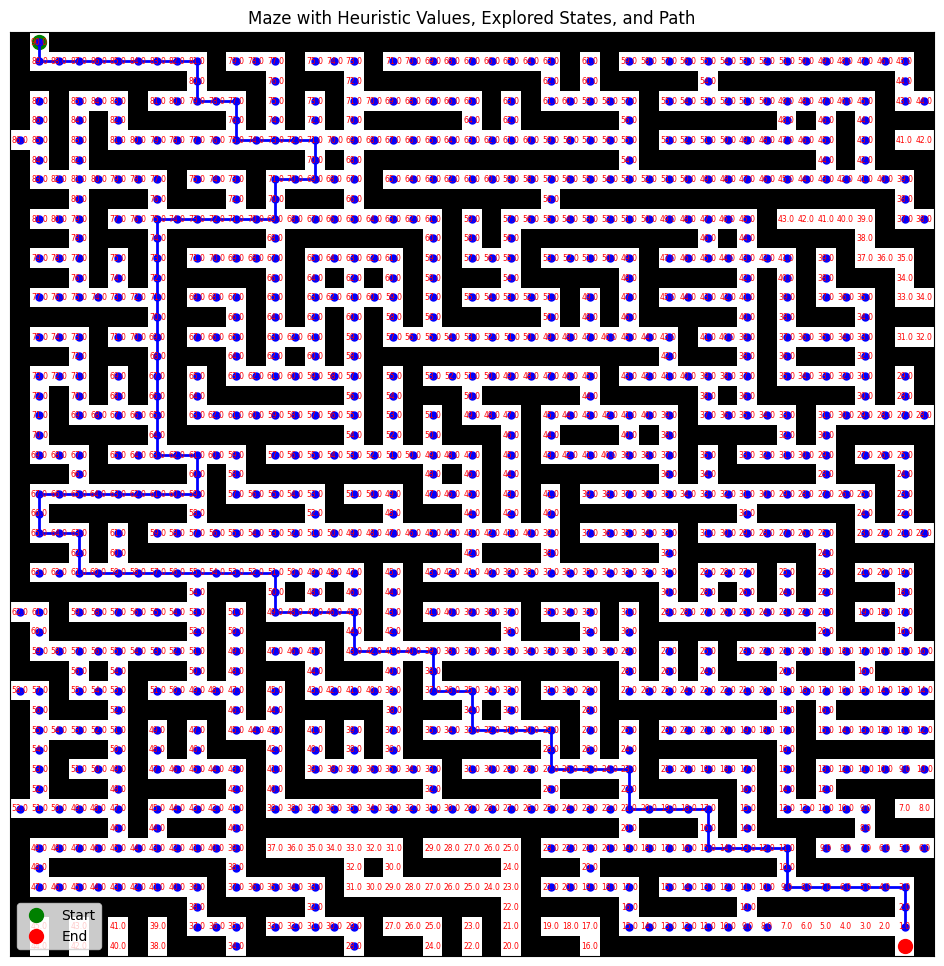

In [ ]:
# Using Manhattan Distance with A star search
solution_path_A_1, max_frontier_size_A_1, explored_cells_A_1 = astar_search(problem, h=manhattan_distance)

In [ ]:
# Print A Star Results With Manhattan Heuristic Values

if solution_path_A_1:
       print("Explored States:", explored_cells_A_1)
       print("Cost: ", len(explored_cells_A_1))

       print("\n")
       print("Solution Path:", solution_path_A_1[0])
       print("Number of Actions in the Solution Path:", len(solution_path_A_1[0]))

       print("\n")
       print("Max Frontier Size: ", max_frontier_size_A_1)

else:
    print("No solution found.")

Explored States: [(0, 1), (1, 1), (1, 2), (1, 3), (1, 4), (1, 5), (1, 6), (1, 7), (1, 8), (1, 9), (2, 9), (3, 9), (3, 8), (3, 10), (3, 11), (4, 11), (3, 7), (5, 11), (5, 12), (5, 10), (5, 13), (5, 14), (5, 9), (4, 13), (5, 15), (6, 15), (3, 13), (5, 8), (7, 15), (5, 16), (4, 15), (5, 7), (5, 17), (5, 18), (5, 6), (5, 19), (7, 14), (2, 13), (7, 16), (6, 17), (7, 13), (8, 13), (3, 15), (5, 20), (7, 17), (5, 21), (5, 5), (4, 17), (1, 13), (9, 13), (3, 17), (8, 17), (4, 5), (1, 12), (10, 13), (11, 13), (5, 22), (9, 12), (9, 14), (3, 5), (12, 13), (5, 23), (9, 15), (5, 24), (9, 17), (2, 17), (3, 18), (9, 11), (5, 25), (9, 18), (3, 4), (4, 23), (1, 17), (9, 19), (3, 19), (11, 12), (9, 16), (1, 11), (13, 13), (3, 20), (3, 23), (5, 26), (1, 16), (11, 11), (9, 10), (3, 3), (9, 20), (8, 11), (4, 25), (1, 15), (9, 9), (3, 22), (7, 11), (14, 13), (3, 21), (5, 27), (11, 10), (9, 8), (9, 21), (9, 7), (10, 7), (4, 3), (15, 13), (5, 28), (10, 21), (8, 7), (3, 25), (11, 9), (7, 7), (7, 10), (11, 7), (1

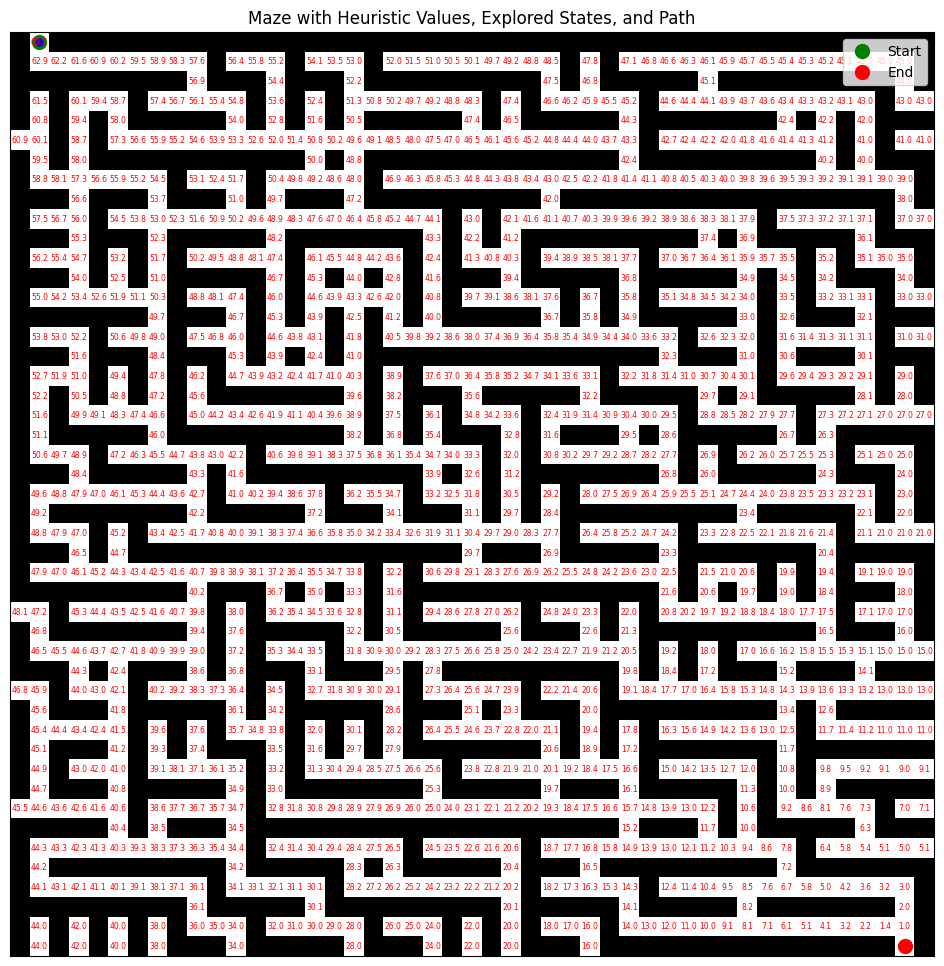

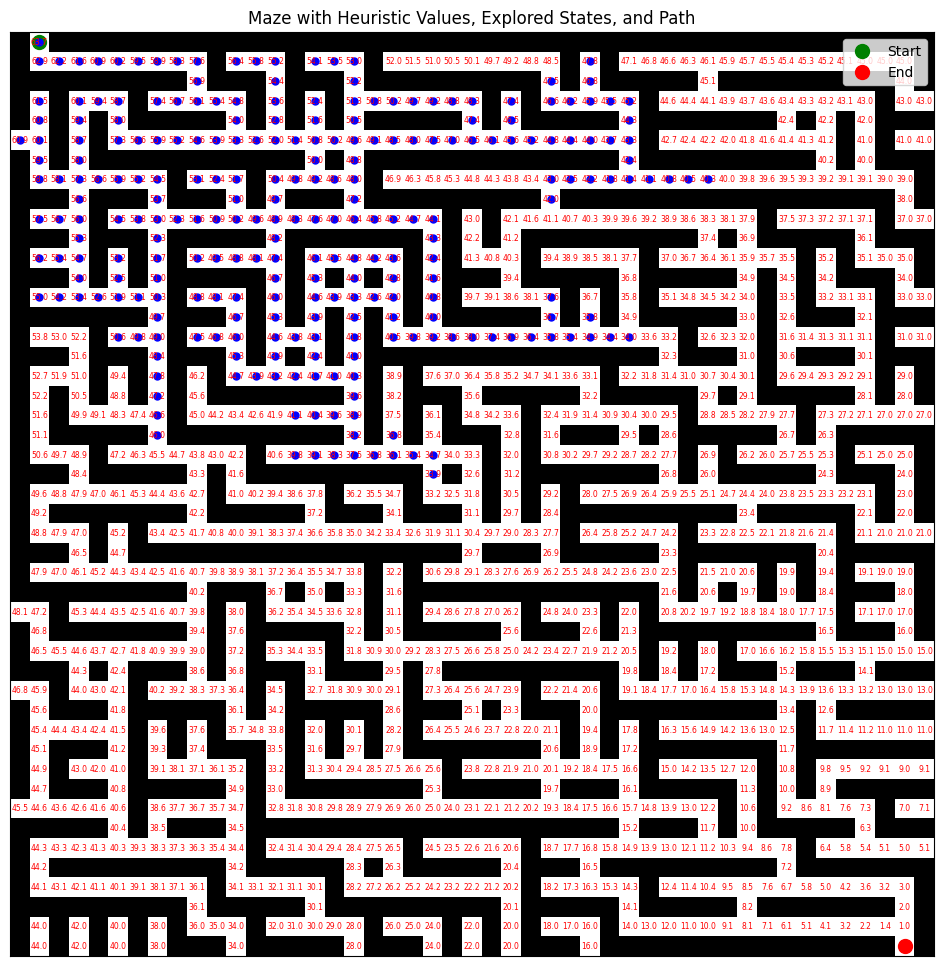

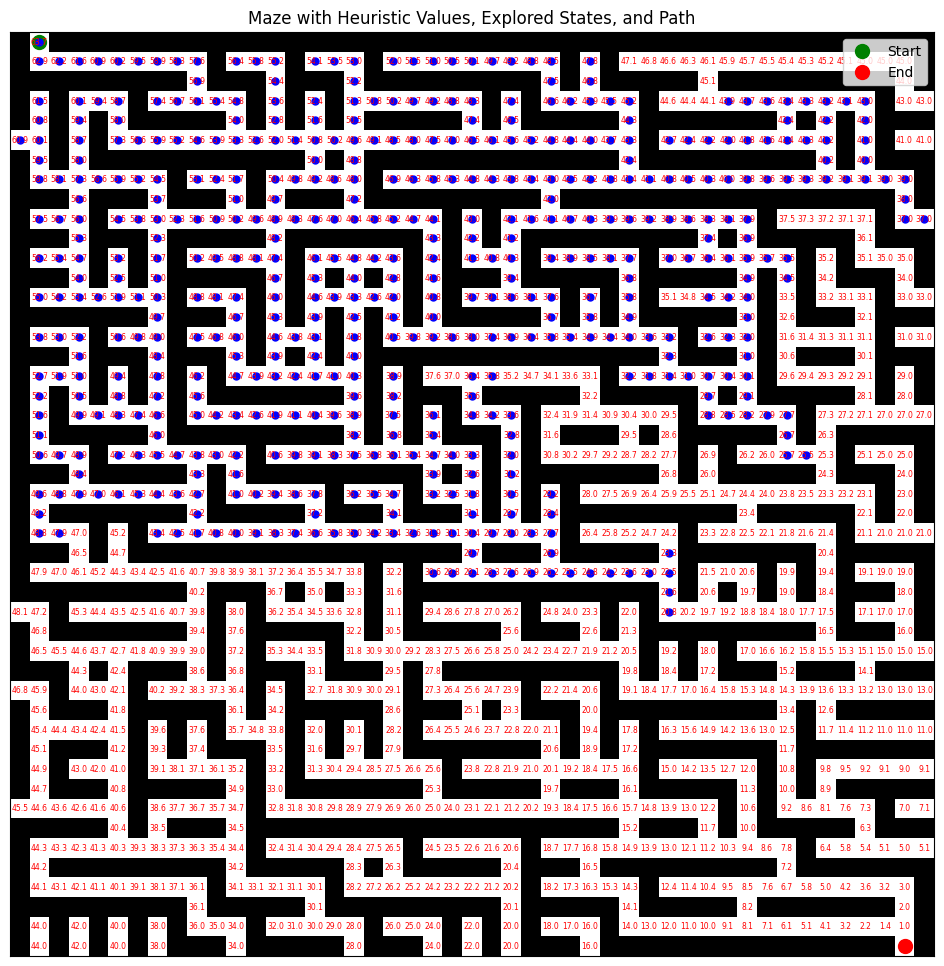

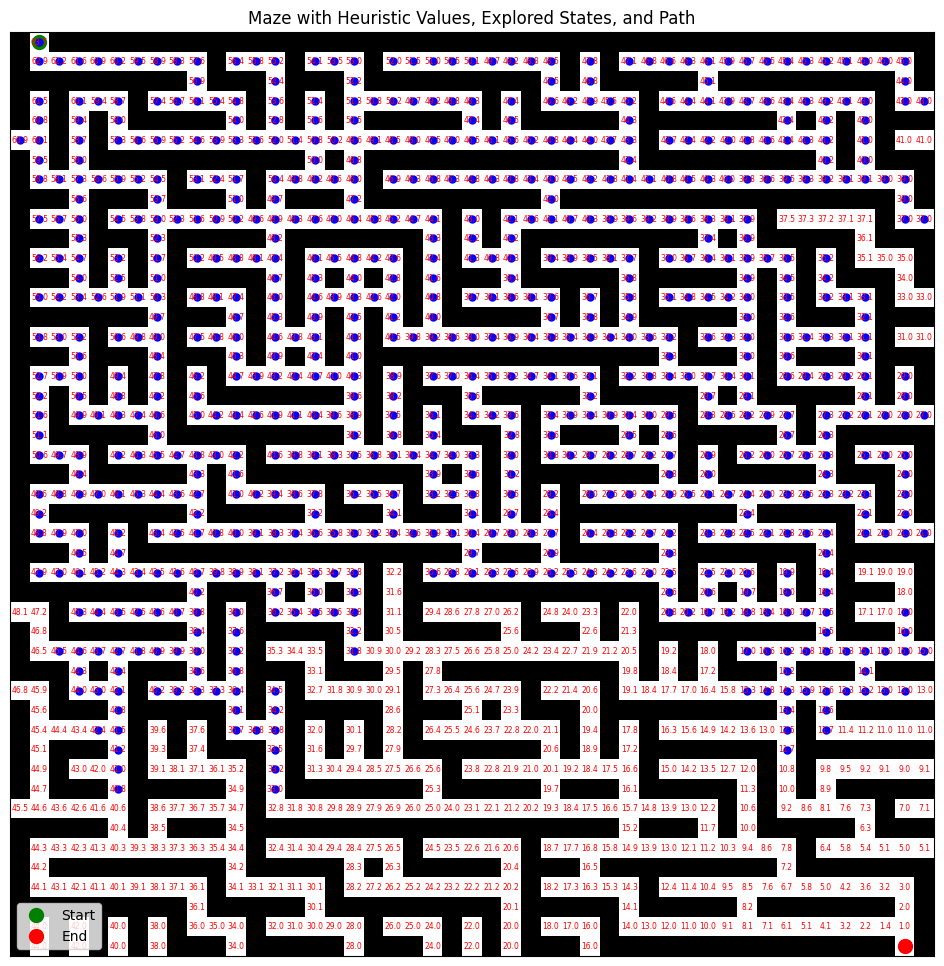

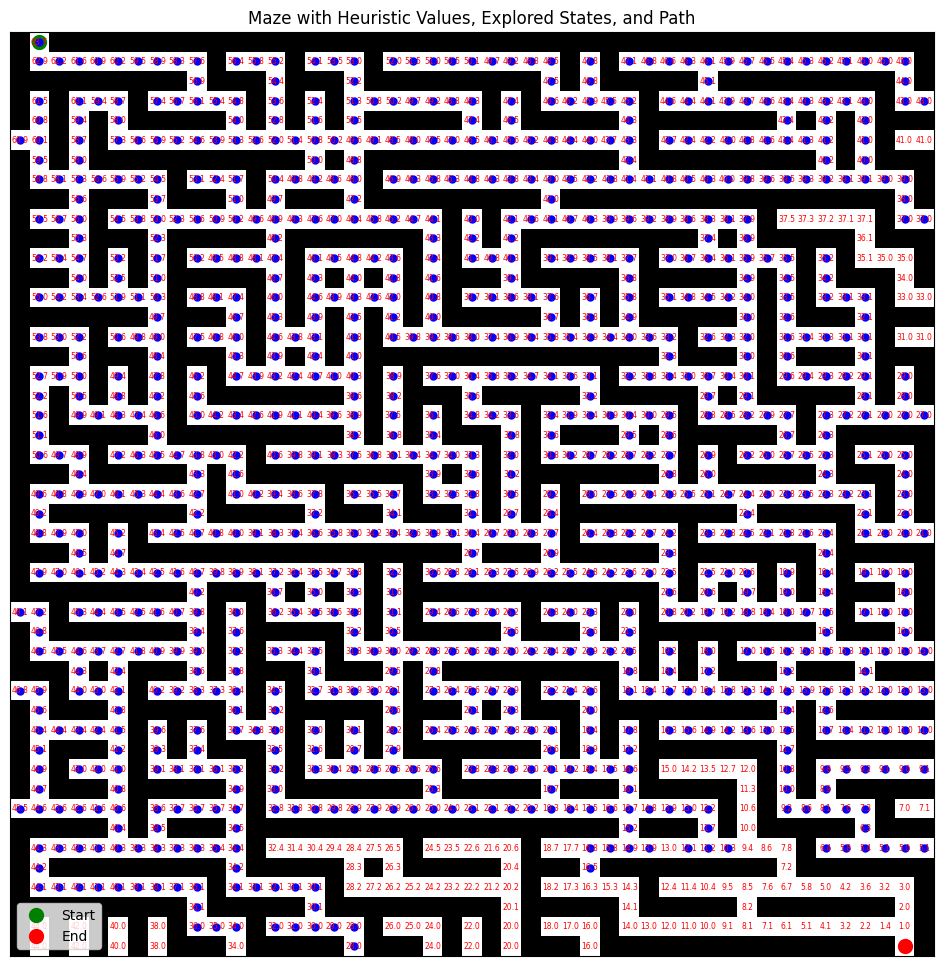

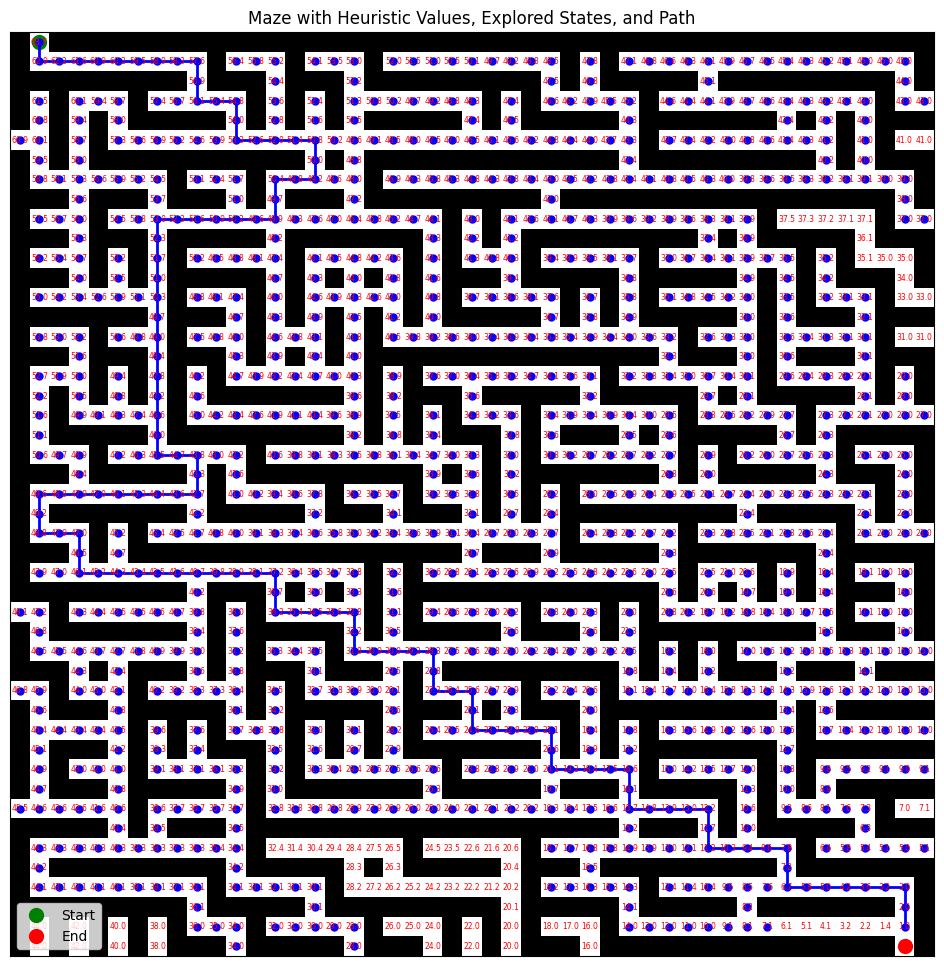

In [ ]:
# Using Euclidean distance with A Star search
solution_path_A_2, max_frontier_size_A_2, explored_cells_A_2 = astar_search(problem, h=euclidean_distance)

In [ ]:
# Print A Star First Search Results With Euclidian Heuristic Values

if solution_path_A_2:
       print("Explored States:", explored_cells_A_2)
       print("Cost: ", len(explored_cells_A_2))

       print("\n")
       print("Solution Path:", solution_path_A_2[0])
       print("Number of Actions in the Solution Path:", len(solution_path_A_2[0]))

       print("\n")
       print("Max Frontier Size: ", max_frontier_size_A_2)

else:
    print("No solution found.")

Explored States: [(0, 1), (1, 1), (1, 2), (1, 3), (1, 4), (1, 5), (1, 6), (1, 7), (1, 8), (1, 9), (2, 9), (3, 9), (3, 8), (3, 10), (3, 11), (4, 11), (3, 7), (5, 11), (5, 12), (5, 10), (5, 13), (5, 14), (5, 9), (4, 13), (5, 15), (6, 15), (5, 8), (3, 13), (5, 7), (7, 15), (5, 16), (5, 6), (4, 15), (5, 17), (5, 18), (2, 13), (7, 14), (5, 19), (7, 13), (7, 16), (6, 17), (5, 5), (8, 13), (3, 15), (7, 17), (5, 20), (1, 13), (4, 17), (5, 21), (4, 5), (9, 13), (3, 17), (3, 5), (1, 12), (8, 17), (10, 13), (11, 13), (9, 12), (9, 14), (3, 4), (9, 15), (12, 13), (5, 22), (9, 11), (2, 17), (9, 17), (5, 23), (3, 18), (5, 24), (9, 18), (1, 17), (1, 11), (5, 25), (11, 12), (3, 3), (9, 19), (3, 19), (9, 16), (4, 23), (13, 13), (3, 20), (1, 16), (11, 11), (9, 10), (8, 11), (3, 23), (9, 9), (1, 15), (7, 11), (9, 20), (9, 8), (11, 10), (5, 26), (4, 3), (9, 7), (14, 13), (4, 25), (3, 22), (3, 21), (10, 7), (8, 7), (9, 21), (5, 27), (7, 7), (15, 13), (5, 3), (11, 9), (7, 10), (11, 7), (7, 6), (9, 6), (10, 2

# **5) Local Search**

## **A) Hill Climbing**

In [ ]:
# Hill Climbing Algorithm Implementation from Labs

def hill_climbing(problem, h=None):
    current = Node.root(problem.init_state)
    max_frontier_size = 0
    explored_cells = []
    explored_states_list = []
    c = 0

    while True:
        explored_states_list.append(current)
        explored_cells.append(current.state)  # Add the current state to the path
        neighbors = [Node.child(problem, current, action) for action in problem.actions(current.state)]

        if (c % 2000)==0:
          visualize_maze_with_heuristic(maze, h, start_state, goal_state, explored_states=explored_states_list, show_path=True, show_explored=True)
        c = c + 1

        if not neighbors:
            visualize_maze_with_heuristic(maze, h, start_state, goal_state, explored_states=explored_states_list, show_path=True, show_explored=True)
            break

        max_frontier_size = max(max_frontier_size, len(neighbors))

        next_node = min(neighbors, key=lambda node: h(node) if h else h(node.state))

        if (h and h(next_node) >= h(current)) or (not h and h(next_node.state) >= h(current.state)):
            visualize_maze_with_heuristic(maze, h, start_state, goal_state, explored_states=explored_states_list, show_path=True, show_explored=True)
            break

        current = next_node

    return max_frontier_size, explored_cells

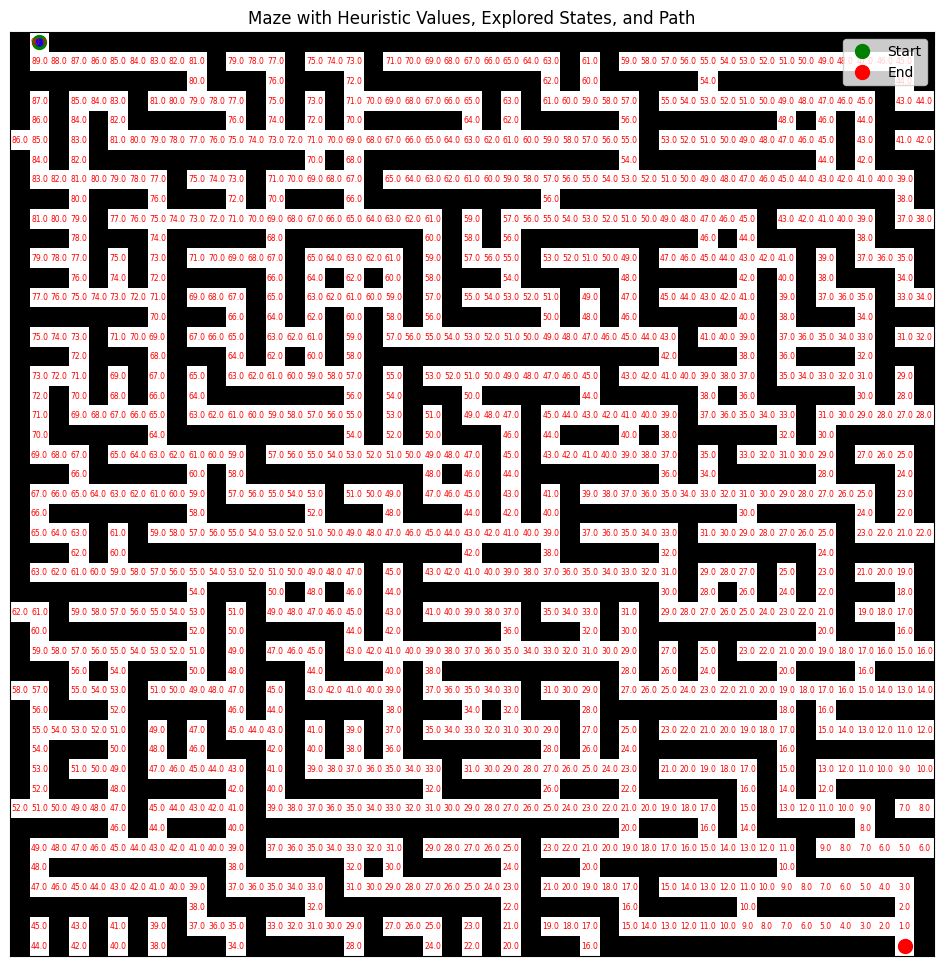

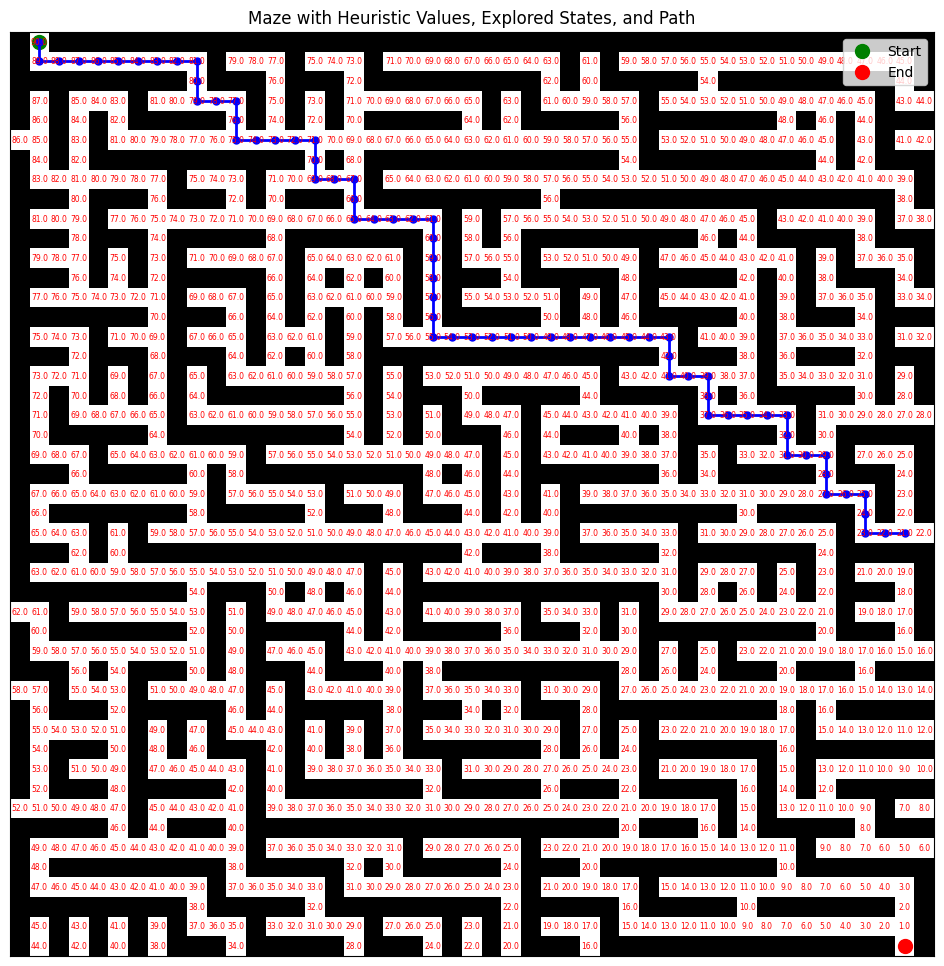

In [ ]:
max_frontier_size_hill_climbing, explored_cells_hill_climbing = hill_climbing(problem, h=manhattan_distance)

In [ ]:
# Calculate the total Heuristic from the Initial state to the Goal state with manhattan_distance

heuristic_values_hill_climbing = []
for cell in explored_cells_hill_climbing:
    dummy_node = Node(state=cell, parent=None, action=None, path_cost=0)
    heuristic_value = manhattan_distance(dummy_node)
    heuristic_values_hill_climbing.append(heuristic_value)

In [ ]:
# Print Hill Climbing Algorithm Results

if explored_cells_hill_climbing:
       print("Explored States:", explored_cells_hill_climbing)
       print("Cost Using Hueristic Values:", sum(heuristic_values_hill_climbing))

       print("\n")
       print("Number of Explored Cells: ", len(explored_cells_hill_climbing))

       print("\n")
       print("Max Frontier Size: ", max_frontier_size_hill_climbing)

Explored States: [(0, 1), (1, 1), (1, 2), (1, 3), (1, 4), (1, 5), (1, 6), (1, 7), (1, 8), (1, 9), (2, 9), (3, 9), (3, 10), (3, 11), (4, 11), (5, 11), (5, 12), (5, 13), (5, 14), (5, 15), (6, 15), (7, 15), (7, 16), (7, 17), (8, 17), (9, 17), (9, 18), (9, 19), (9, 20), (9, 21), (10, 21), (11, 21), (12, 21), (13, 21), (14, 21), (15, 21), (15, 22), (15, 23), (15, 24), (15, 25), (15, 26), (15, 27), (15, 28), (15, 29), (15, 30), (15, 31), (15, 32), (15, 33), (16, 33), (17, 33), (17, 34), (17, 35), (18, 35), (19, 35), (19, 36), (19, 37), (19, 38), (19, 39), (20, 39), (21, 39), (21, 40), (21, 41), (22, 41), (23, 41), (23, 42), (23, 43), (24, 43), (25, 43), (25, 44), (25, 45)]
Cost Using Hueristic Values: 3885


Number of Explored Cells:  70


Max Frontier Size:  4


## **B) Simulated Annealing**

In [ ]:
# Simulated Annealing Algorithm Implementation from Labs

def simulated_annealing(problem, schedule, h=None, verbose=False):
    c = 0
    cont = 0
    current = Node.root(problem.init_state)
    current_value = h(current)
    explored_states_list = []
    explored_cells = []
    max_frontier_size = 0

    for t in count():
        if cont >= 501:
          return max_frontier_size, explored_cells
        cont = cont + 1

        explored_states_list.append(current)
        explored_cells.append(current.state)
        T = schedule(t)  # Temperature as a function of the step count
        if current_value == 0 or T == 0:  # Stop if goal is found or temperature is zero
            visualize_maze_with_heuristic(maze, h, start_state, goal_state, explored_states=explored_states_list, show_path=True, show_explored=True)
            return max_frontier_size, explored_cells

        if (c % 1000) == 0:
          visualize_maze_with_heuristic(maze, h, start_state, goal_state, explored_states=explored_states_list, show_path=True, show_explored=True)
        c = c + 1

        neighbors = [Node.child(problem, current, action) for action in problem.actions(current.state)]
        max_frontier_size = max(max_frontier_size, len(neighbors))
        while True:
            next_node = choice(neighbors)
            next_value = h(next_node)
            delta = current_value - next_value
            if delta > 0 or random.random() < exp(delta / T):  # Use random() from the random module
                current, current_value = next_node, next_value
                break

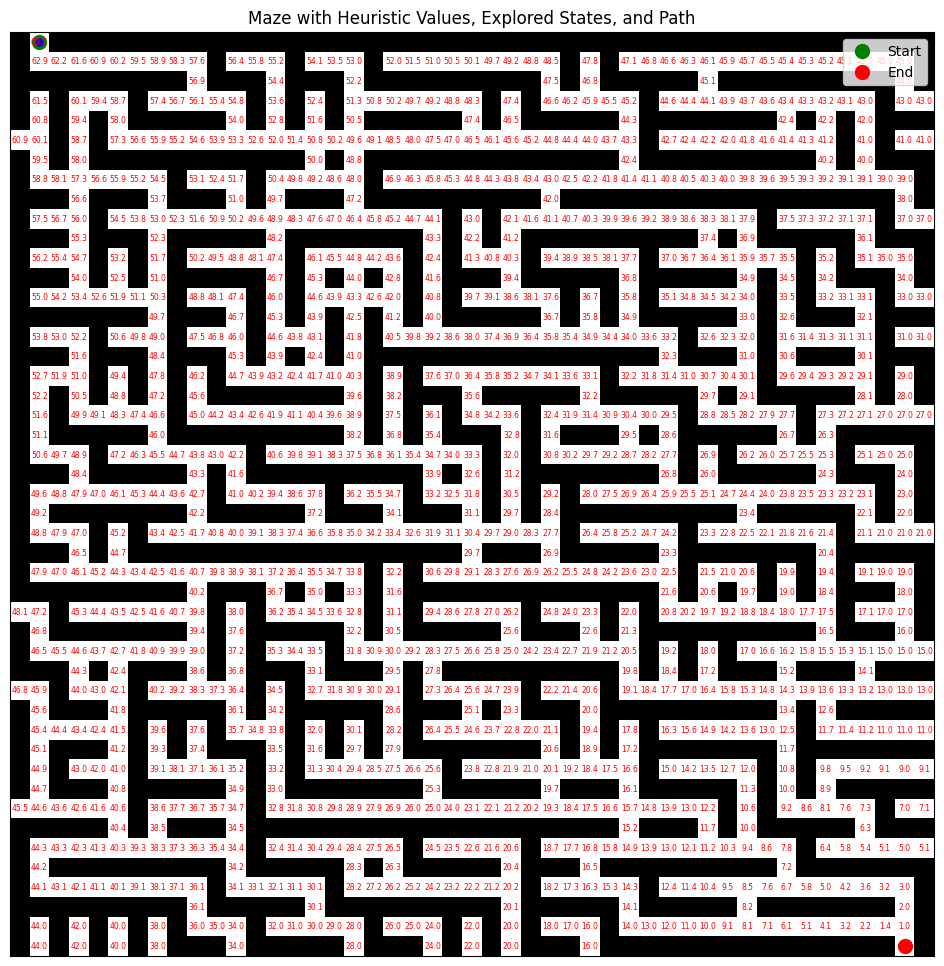

In [ ]:
def schedule(t):
    return max(1e-3, 100 / (1 + t**2))
max_frontier_size_SA, explored_cells_SA = simulated_annealing(problem, schedule ,h=euclidean_distance, verbose=True)

In [ ]:
# Calculate the total Heuristic from the Initial state to the Goal state with manhattan_distance

heuristic_values_SA = []
for cell in explored_cells_SA:
    dummy_node = Node(state=cell, parent=None, action=None, path_cost=0)
    heuristic_value = manhattan_distance(dummy_node)
    heuristic_values_SA.append(heuristic_value)

In [ ]:
# Print Simulated Annealing Results

if explored_cells_SA:
       print("Explored States:", explored_cells_SA)
       print("Cost Using Hueristic Values:", sum(heuristic_values_SA))

       print("\n")
       print("Number of Explored Cells: ", len(explored_cells_SA))

       print("\n")
       print("Max Frontier Size: ", max_frontier_size_SA)

Explored States: [(0, 1), (0, 1), (1, 1), (1, 1), (1, 1), (0, 1), (0, 1), (0, 1), (1, 1), (1, 2), (1, 3), (1, 2), (1, 2), (1, 2), (1, 1), (0, 1), (0, 1), (0, 1), (0, 1), (0, 1), (0, 1), (1, 1), (1, 2), (1, 2), (1, 2), (1, 2), (1, 3), (1, 4), (1, 4), (1, 5), (1, 5), (1, 6), (1, 7), (1, 7), (1, 8), (1, 9), (2, 9), (2, 9), (2, 9), (2, 9), (2, 9), (2, 9), (3, 9), (3, 9), (3, 9), (3, 9), (3, 10), (3, 10), (3, 11), (3, 11), (3, 11), (3, 11), (4, 11), (5, 11), (5, 11), (5, 12), (5, 12), (5, 13), (5, 14), (5, 14), (5, 15), (6, 15), (6, 15), (6, 15), (7, 15), (7, 16), (7, 16), (7, 16), (7, 16), (7, 16), (7, 16), (7, 16), (7, 17), (8, 17), (8, 17), (8, 17), (8, 17), (8, 17), (9, 17), (9, 18), (9, 18), (9, 19), (9, 19), (9, 19), (9, 20), (9, 21), (10, 21), (10, 21), (11, 21), (12, 21), (12, 21), (13, 21), (13, 21), (14, 21), (14, 21), (15, 21), (15, 22), (15, 22), (15, 22), (15, 23), (15, 23), (15, 24), (15, 24), (15, 24), (15, 24), (15, 24), (15, 25), (15, 25), (15, 26), (15, 26), (15, 27), (15,

## **C) Genetic**

In [21]:
gene_pool = [0, 1, 2, 3]  # Represents North, South, East, West movements
def init_population(pop_number, gene_pool, state_length):
       """Initializes the population."""
       population = []
       for i in range(pop_number):
           new_individual = [random.choice(gene_pool) for j in range(state_length)]
           population.append(new_individual)
       return population

population = init_population(100, gene_pool, 50)  # set the gene pool 50

In [22]:
def fitness(path, problem):
       """Evaluates the fitness of a path."""
       current_state = problem.init_state
       path_length = 0
       for move in path:
           next_state = problem.result(current_state, move)
           if next_state == current_state:  # Invalid move no path to move
               return 0  # Low fitness
           current_state = next_state
           path_length += 1
           if problem.goal_test(current_state):  # reached to the goal
               return 1000 - path_length  # Higher fitness for shorter paths
       return 0

In [23]:
import random

def select(k, population, fitness_fn, problem):
    """Selects parents based on fitness."""
    selected = random.choices(population, k=k)
    selected = sorted(selected, key=lambda individual: fitness_fn(individual, problem), reverse=True)  # Sort by fitness
    return selected[:2]  # Return top two

def recombine(x, y):
    """Combines parents to create offspring."""
    n = len(x)
    c = random.randrange(0, n)
    return x[:c] + y[c:]

def mutate(x, gene_pool, pmut):
    """Introduces random changes to an individual."""
    if random.uniform(0, 1) < pmut:  # Ensure mutation happens with probability pmut
        n = len(x)
        c = random.randrange(0, n)
        new_gene = random.choice(gene_pool)
        x = x[:c] + [new_gene] + x[c + 1:]  # Replace the gene at position c
    return x

In [24]:
def genetic_algorithm(population, fitness_fn, gene_pool, f_thres, problem):
    # Placeholder for genetic algorithm implementation

    # Example: basic steps of a genetic algorithm
    generation = 0
    best_individual = None
    best_fitness = float('-inf')

    while generation < f_thres:  # Or some other stopping condition
        selected_parents = select(2, population, fitness_fn, problem)  # Select top two parents
        offspring = recombine(selected_parents[0], selected_parents[1])  # Create offspring
        offspring = mutate(offspring, gene_pool, 0.05)  # Mutate offspring with probability of 0.05

        # Add the new individual back to the population
        population.append(offspring)

        # Evaluate fitness
        for individual in population:
            fitness = fitness_fn(individual, problem)
            if fitness > best_fitness:
                best_fitness = fitness
                best_individual = individual

        generation += 1

    return best_individual

In [25]:
solution_g = genetic_algorithm(population, fitness, gene_pool, f_thres=25, problem=problem)
print(solution_g)
print(fitness(solution_g, problem))

[2, 2, 3, 3, 1, 3, 3, 0, 2, 3, 3, 0, 2, 1, 2, 2, 1, 2, 2, 3, 0, 2, 0, 1, 2, 1, 0, 1, 0, 1, 0, 2, 1, 3, 3, 2, 0, 1, 3, 3, 3, 1, 2, 1, 1, 1, 3, 0, 0, 3]
0


# **6) Comparison of Methods**

In [ ]:
# Performance Measure Function

def measure_performance(search_algorithm, problem, verbose=False):
    """
    Wrapper function to measure the time and space performance of the search algorithm.
    """
    # Start measuring time
    start_time = time.time()

    # Run the search algorithm, capturing the solution and max frontier size
    solution_result, max_frontier_size, explored_cells = search_algorithm(problem, verbose=verbose)

    # Measure elapsed time
    elapsed_time = time.time() - start_time

    return {
        'solution': solution_result[0] if solution_result else None,
        'cost': len(explored_cells) if solution_result else 0,  # Ensure the cost is captured
        'elapsed_time': elapsed_time,
        'max_frontier_size': max_frontier_size,  # Return the max number of nodes in the frontier
        'explored_cells' : explored_cells
    }


Frontier at step 1

(0, 1)
----------------------------------------------------------------------------------------------------


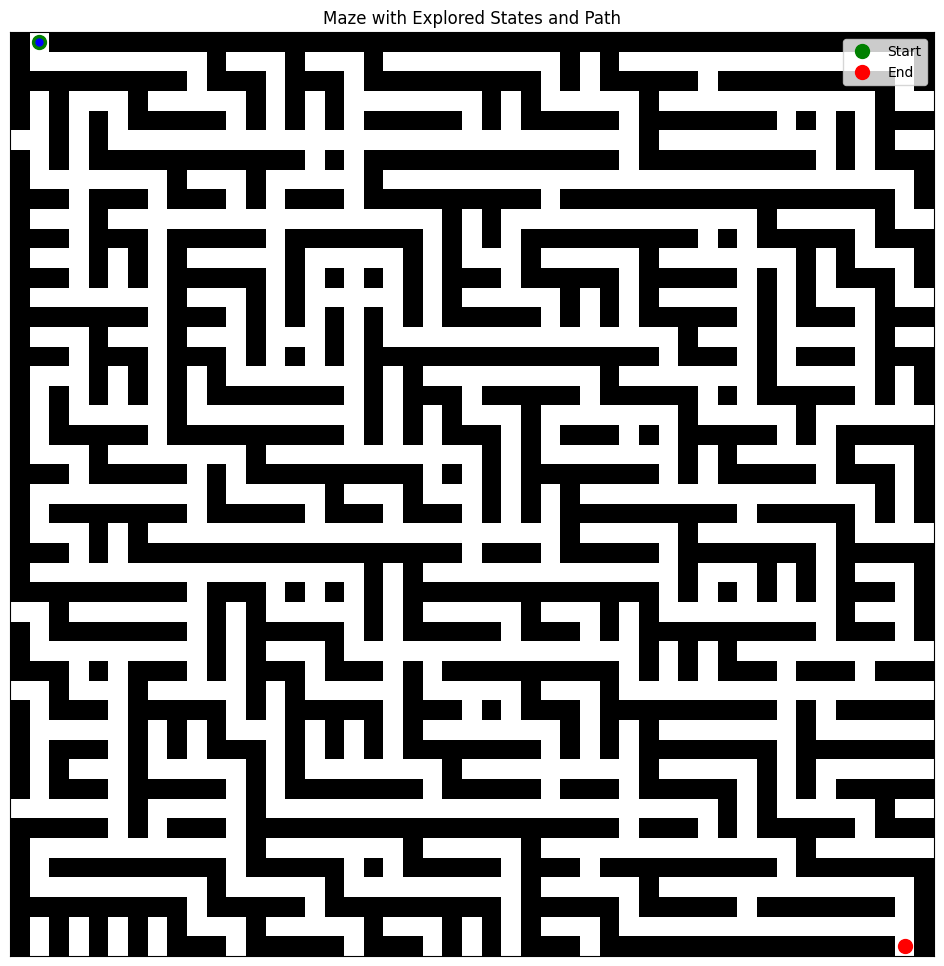

Streaming output truncated to the last 5000 lines.
(33, 19)

(31, 21)

(29, 19)

(33, 19)

(31, 21)

(29, 19)

(33, 19)

(31, 21)

(35, 42)

(27, 44)

(38, 39)

(35, 36)

(35, 42)

(32, 35)

(33, 34)

(35, 42)

(27, 44)

(38, 39)

(35, 36)

(35, 42)

(32, 35)

(33, 34)

(35, 42)

(27, 44)

(38, 39)

(35, 36)

(35, 42)

(32, 35)

(33, 34)

(35, 42)

(27, 44)

(38, 39)

(35, 36)

(35, 42)

(32, 35)

(33, 34)

(35, 42)

(27, 44)

(38, 39)
----------------------------------------------------------------------------------------------------
Frontier at step 1894

(35, 41)

(33, 35)

(35, 41)

(27, 45)

(29, 43)

(37, 39)

(35, 37)

(35, 41)

(33, 35)

(35, 41)

(27, 45)

(29, 43)

(37, 39)

(35, 37)

(35, 41)

(33, 35)

(35, 41)

(27, 45)

(29, 43)

(37, 39)

(35, 37)

(35, 41)

(33, 35)

(39, 13)

(39, 5)

(37, 3)

(35, 1)

(29, 19)

(33, 19)

(31, 21)

(29, 19)

(33, 19)

(31, 21)

(29, 19)

(33, 19)

(31, 21)

(35, 42)

(27, 44)

(38, 39)

(35, 36)

(35, 42)

(32, 35)

(33, 34)

(35, 42)


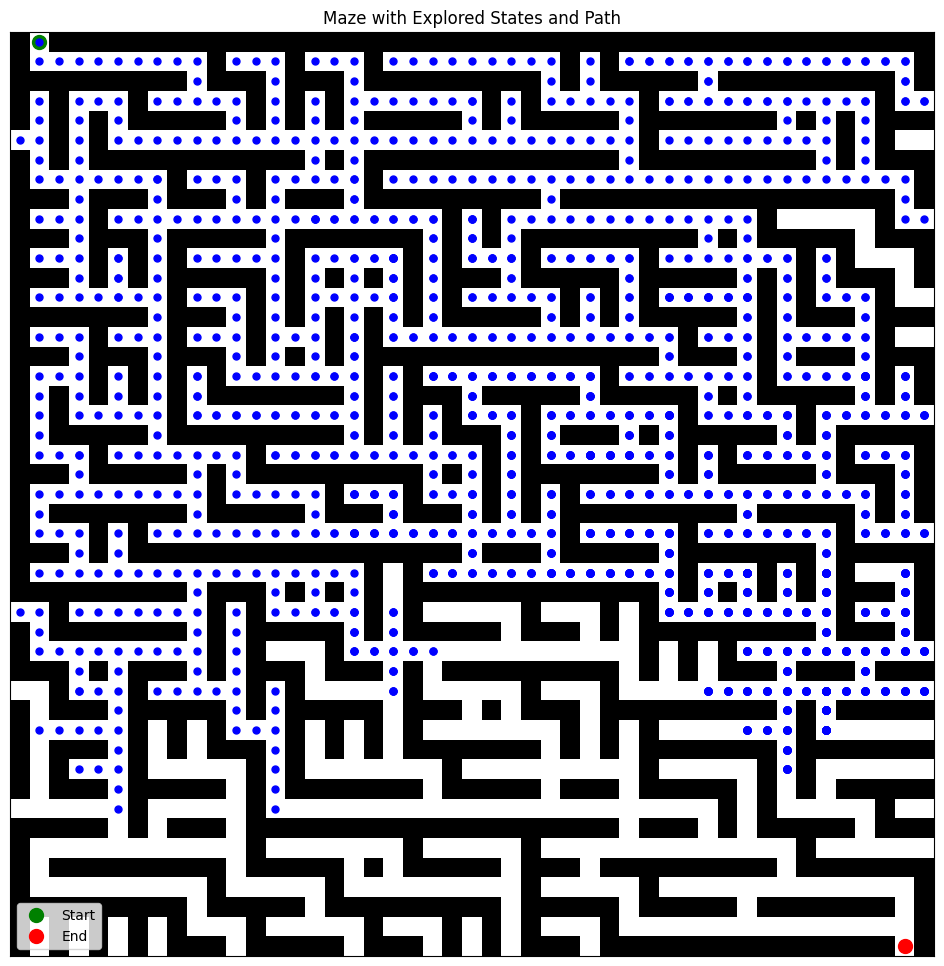

Streaming output truncated to the last 5000 lines.
(45, 37)

(37, 33)

(43, 43)

(45, 37)

(43, 35)

(37, 33)

(43, 43)

(45, 37)

(43, 35)

(45, 37)

(37, 33)

(43, 43)

(45, 37)

(43, 35)

(37, 33)

(43, 43)

(45, 37)

(43, 35)

(45, 37)

(37, 33)

(43, 43)

(45, 37)

(43, 35)

(37, 33)

(43, 43)

(45, 37)

(43, 35)

(45, 37)

(37, 33)

(43, 43)

(45, 37)

(43, 35)

(37, 33)

(43, 43)

(45, 37)
----------------------------------------------------------------------------------------------------
Frontier at step 3842

(45, 36)

(37, 34)

(43, 42)

(44, 37)

(43, 36)

(37, 34)

(43, 42)

(44, 37)

(43, 36)

(45, 36)

(37, 34)

(43, 42)

(44, 37)

(43, 36)

(37, 34)

(43, 42)

(44, 37)

(43, 36)

(45, 36)

(37, 34)

(43, 42)

(44, 37)

(43, 36)

(37, 34)

(43, 42)

(44, 37)

(43, 36)

(45, 36)

(37, 34)

(43, 42)

(44, 37)

(43, 36)

(37, 34)

(43, 42)

(44, 37)

(43, 36)

(45, 36)

(37, 34)

(43, 42)

(44, 37)

(43, 36)

(37, 34)

(43, 42)

(44, 37)

(43, 36)

(45, 36)

(37, 34)

(43, 4

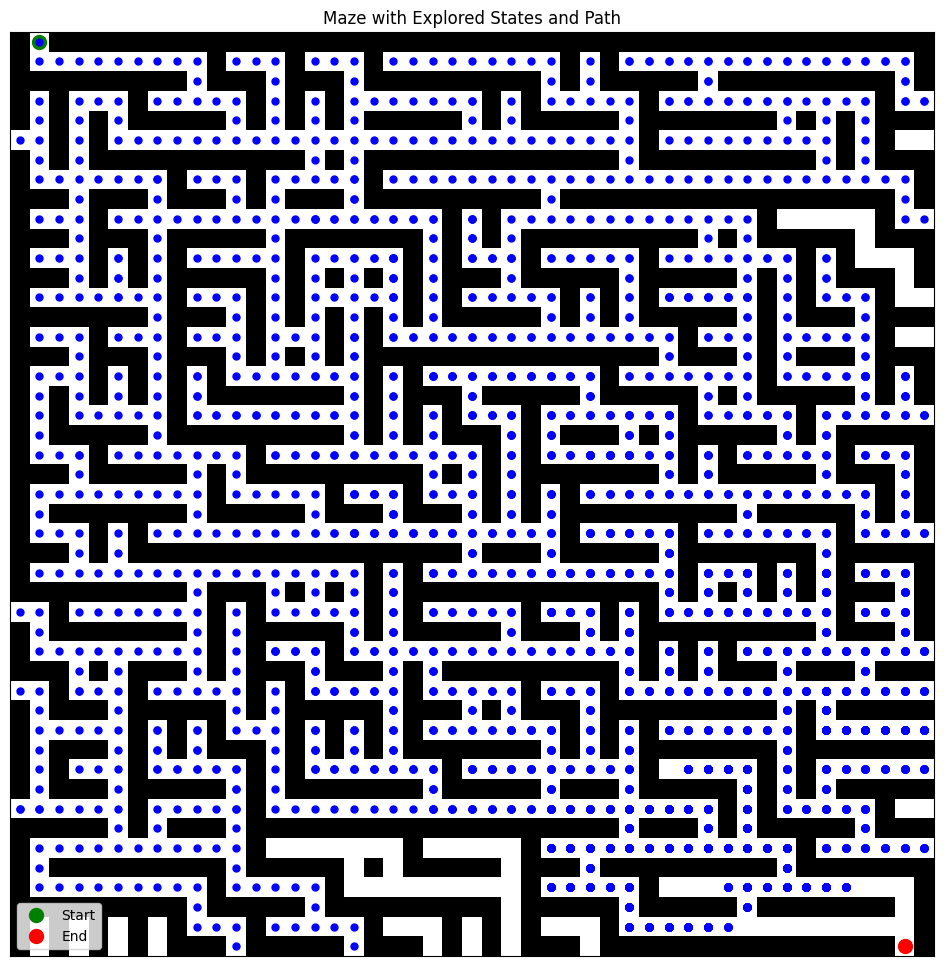

Streaming output truncated to the last 5000 lines.
(44, 45)

(45, 40)

(45, 40)

(44, 45)

(45, 40)

(44, 45)

(45, 40)

(45, 40)

(44, 45)

(45, 40)

(44, 45)

(45, 40)

(45, 40)

(44, 45)

(45, 40)

(44, 45)

(45, 40)

(45, 40)

(44, 45)

(45, 40)

(45, 45)

(45, 41)

(45, 41)

(45, 45)

(45, 41)

(45, 45)

(45, 41)

(45, 41)

(45, 45)

(45, 41)

(45, 45)

(45, 41)

(45, 41)

(45, 45)

(45, 41)

(45, 45)

(45, 41)

(45, 41)

(45, 45)

(45, 41)

(45, 45)

(45, 41)

(45, 41)

(45, 45)

(45, 41)

(45, 45)

(45, 41)

(45, 41)

(45, 45)

(45, 41)

(45, 45)

(45, 41)

(45, 41)

(45, 45)

(45, 41)

(45, 45)

(45, 41)

(45, 41)

(45, 45)

(45, 41)

(45, 45)

(45, 41)

(45, 41)

(45, 45)

(45, 41)

(45, 45)

(45, 41)

(45, 41)

(45, 45)

(45, 41)
----------------------------------------------------------------------------------------------------
Frontier at step 4356

(45, 40)

(45, 40)

(44, 45)

(45, 40)

(44, 45)

(45, 40)

(45, 40)

(44, 45)

(45, 40)

(44, 45)

(45, 40)

(45, 40)

(44, 4

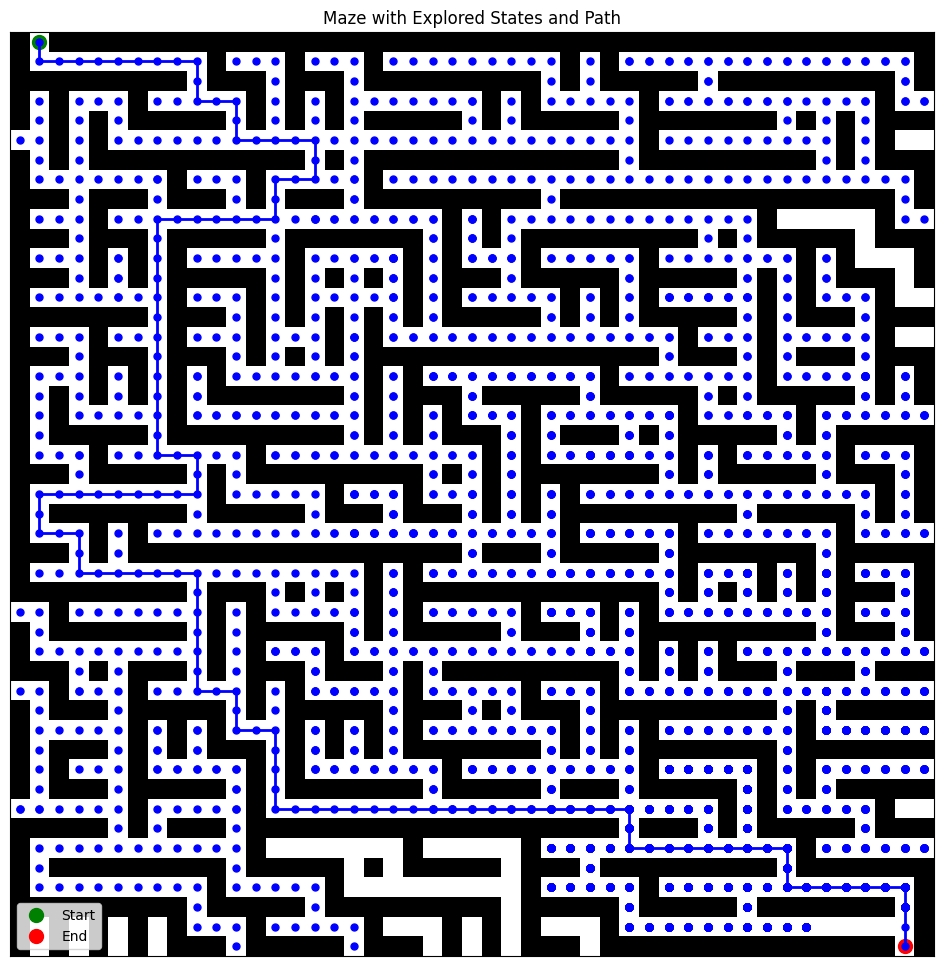

Frontier at step 1

(0, 1)
----------------------------------------------------------------------------------------------------


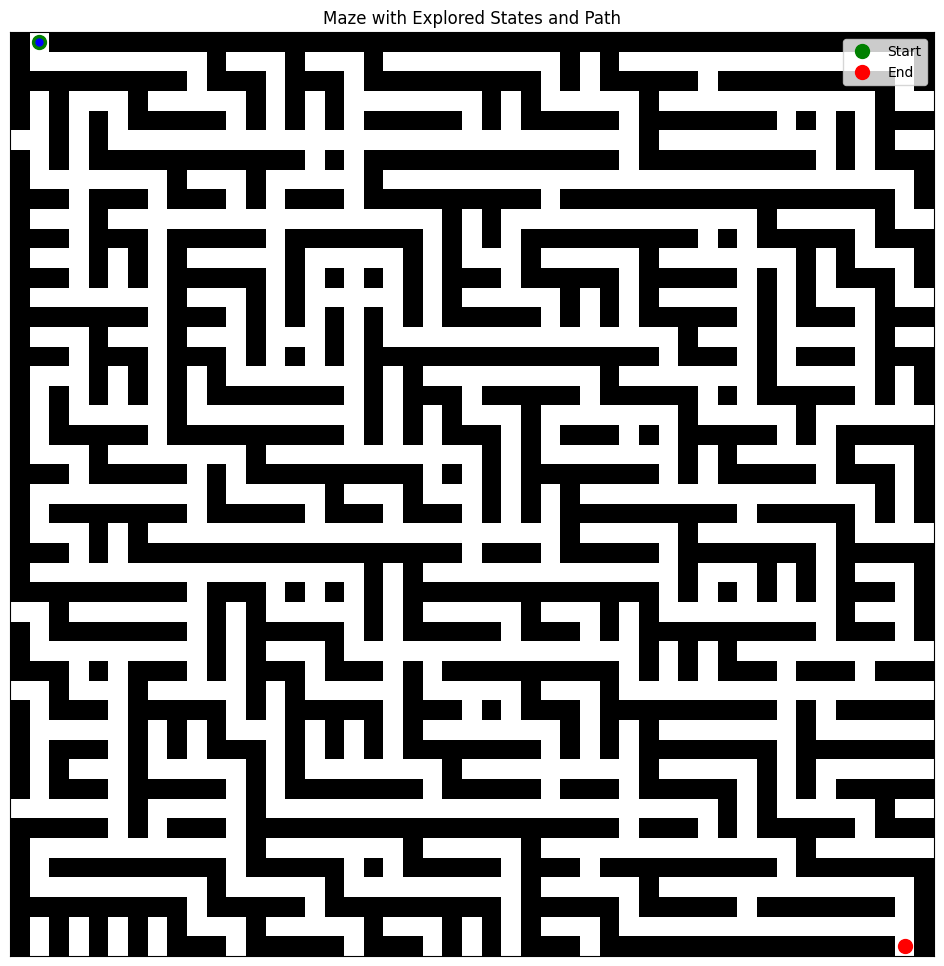

Streaming output truncated to the last 5000 lines.
(10, 35)

(12, 37)

(16, 39)

(14, 43)

(17, 45)
----------------------------------------------------------------------------------------------------
Frontier at step 403

(5, 12)

(8, 3)

(10, 7)

(8, 11)

(8, 13)

(10, 13)

(8, 17)

(15, 22)

(12, 19)

(12, 17)

(14, 17)

(12, 15)

(16, 15)

(14, 13)

(16, 15)

(16, 17)

(20, 19)

(20, 21)

(22, 21)

(26, 23)

(25, 24)

(24, 19)

(24, 15)

(22, 9)

(22, 3)

(26, 5)

(28, 9)

(28, 13)

(28, 15)

(30, 19)

(32, 19)

(32, 21)

(30, 25)

(30, 29)

(30, 31)

(32, 33)

(32, 35)

(32, 39)

(34, 39)

(34, 41)

(31, 44)

(28, 41)

(28, 39)

(28, 37)

(28, 35)

(26, 33)

(24, 27)

(19, 30)

(20, 31)

(20, 33)

(22, 35)

(24, 37)

(20, 41)

(18, 37)

(17, 36)

(14, 31)

(14, 29)

(8, 27)

(10, 35)

(12, 37)

(16, 39)

(14, 43)
----------------------------------------------------------------------------------------------------
Frontier at step 404

(5, 12)

(8, 3)

(10, 7)

(8, 11)

(8, 13)

(10

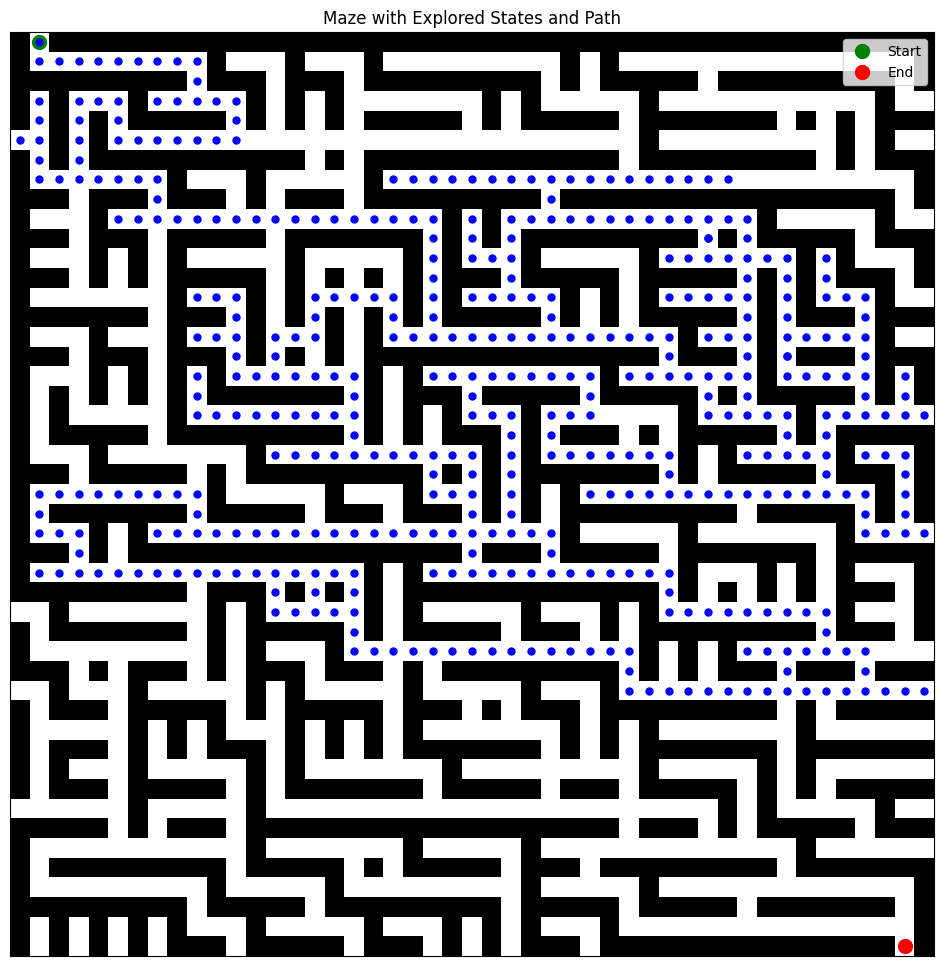

Streaming output truncated to the last 5000 lines.
(39, 32)

(38, 27)

(38, 21)
----------------------------------------------------------------------------------------------------
Frontier at step 866

(5, 12)

(8, 3)

(10, 7)

(8, 11)

(8, 13)

(10, 13)

(8, 17)

(15, 22)

(12, 19)

(12, 17)

(14, 17)

(12, 15)

(16, 15)

(14, 13)

(16, 15)

(16, 17)

(20, 19)

(20, 21)

(22, 21)

(26, 23)

(25, 24)

(24, 19)

(24, 15)

(22, 9)

(22, 3)

(26, 5)

(28, 9)

(28, 13)

(28, 15)

(30, 19)

(32, 19)

(34, 23)

(38, 27)

(36, 29)

(36, 31)

(40, 31)

(39, 32)

(38, 27)

(37, 21)
----------------------------------------------------------------------------------------------------
Frontier at step 867

(5, 12)

(8, 3)

(10, 7)

(8, 11)

(8, 13)

(10, 13)

(8, 17)

(15, 22)

(12, 19)

(12, 17)

(14, 17)

(12, 15)

(16, 15)

(14, 13)

(16, 15)

(16, 17)

(20, 19)

(20, 21)

(22, 21)

(26, 23)

(25, 24)

(24, 19)

(24, 15)

(22, 9)

(22, 3)

(26, 5)

(28, 9)

(28, 13)

(28, 15)

(30, 19)

(32, 19

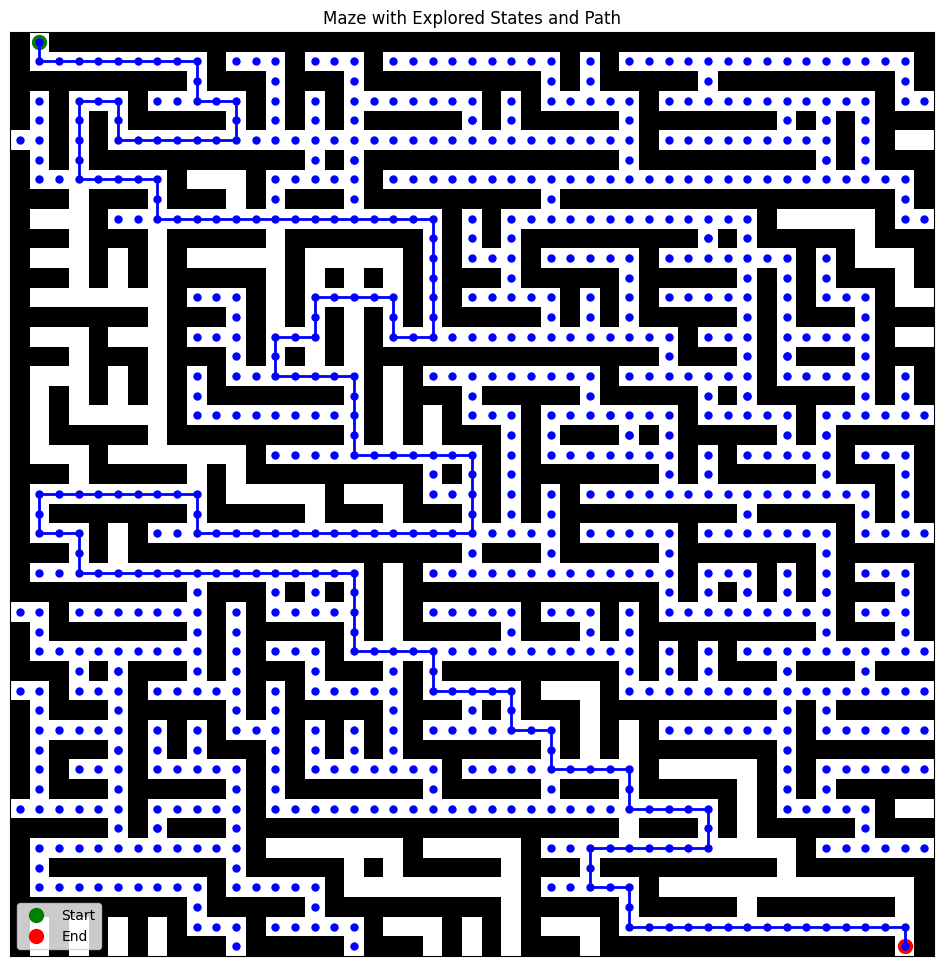

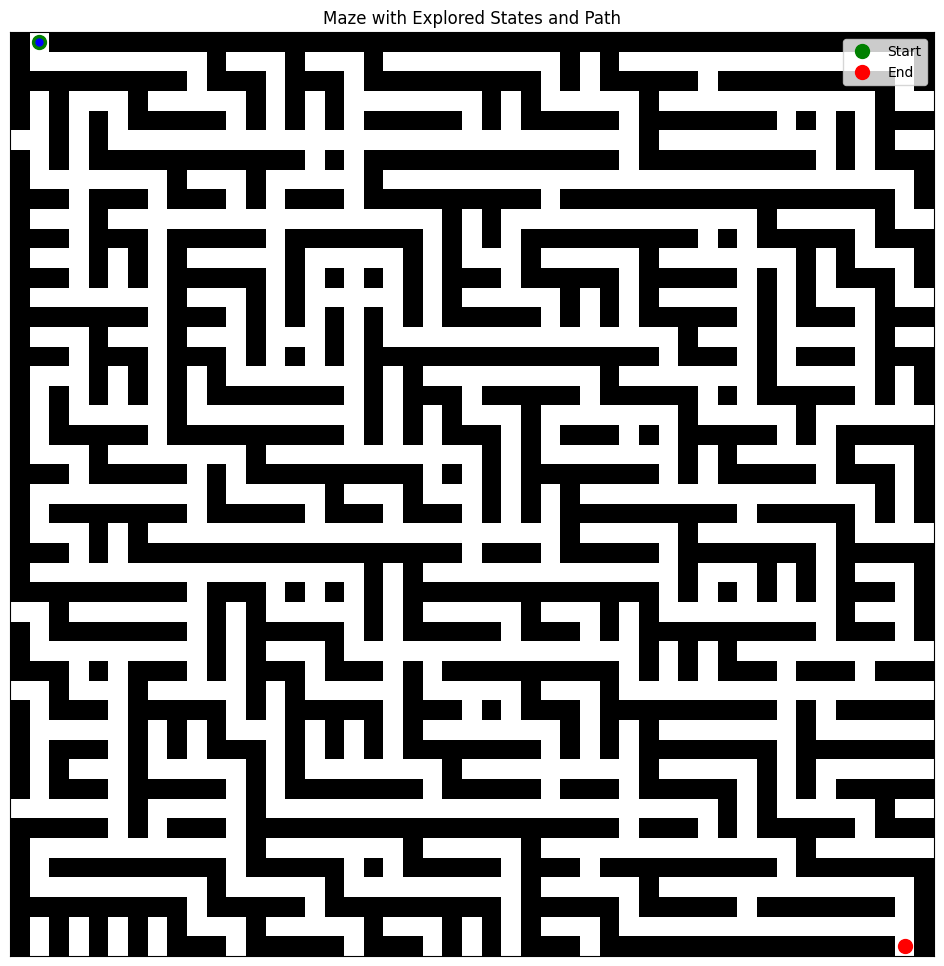

Streaming output truncated to the last 5000 lines.
Frontier at step 74759

(21, 5)

(21, 5)

(21, 6)

(21, 5)
----------------------------------------------------------------------------------------------------
Frontier at step 74760

(25, 36)

(25, 36)

(25, 37)

(25, 35)
----------------------------------------------------------------------------------------------------
Frontier at step 74761

(25, 35)

(25, 35)

(25, 36)

(25, 35)
----------------------------------------------------------------------------------------------------
Frontier at step 74762

(21, 38)

(21, 38)

(21, 39)

(21, 37)
----------------------------------------------------------------------------------------------------
Frontier at step 74763

(21, 37)

(21, 37)

(21, 38)

(21, 37)
----------------------------------------------------------------------------------------------------
Frontier at step 74764

(19, 36)

(19, 36)

(19, 37)

(19, 35)
----------------------------------------------------------------------

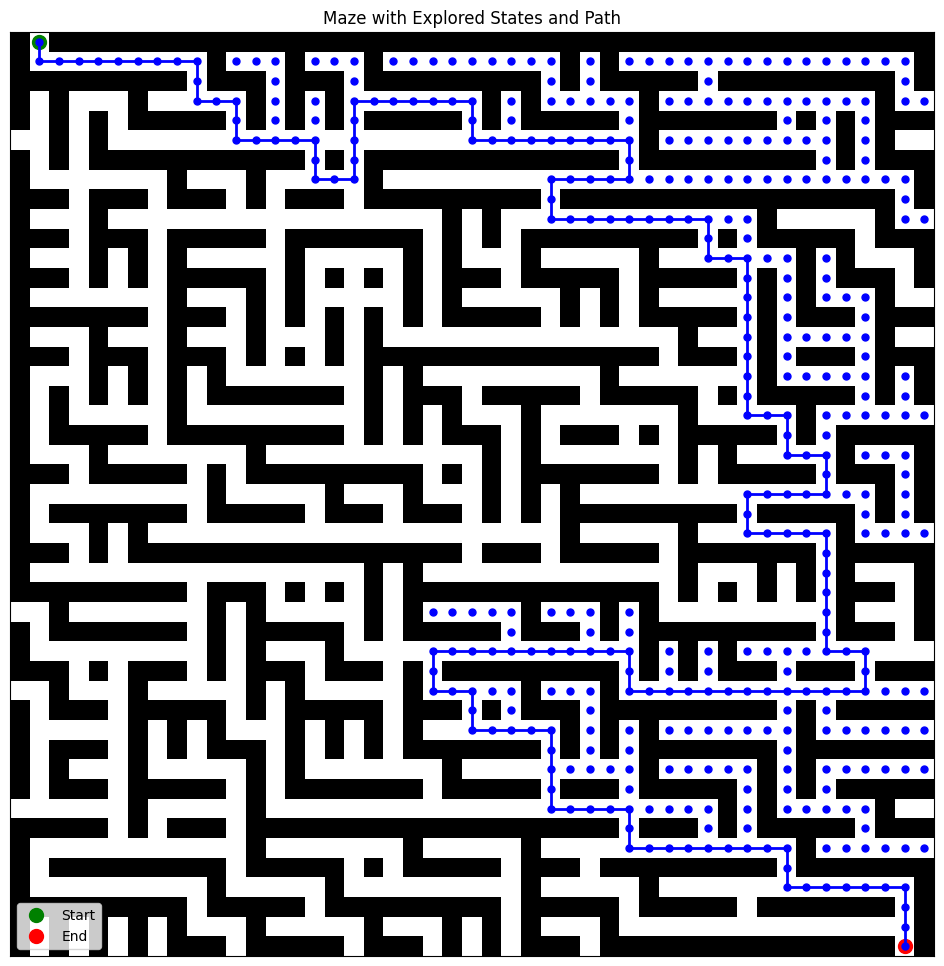

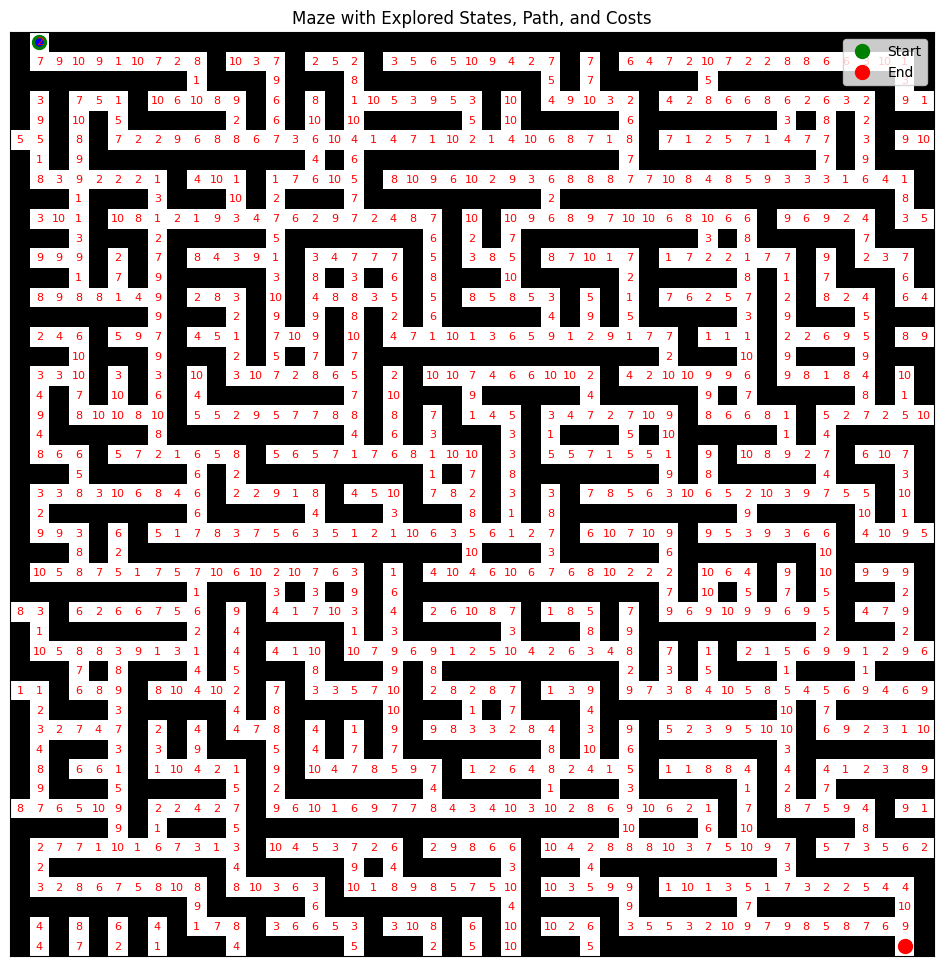

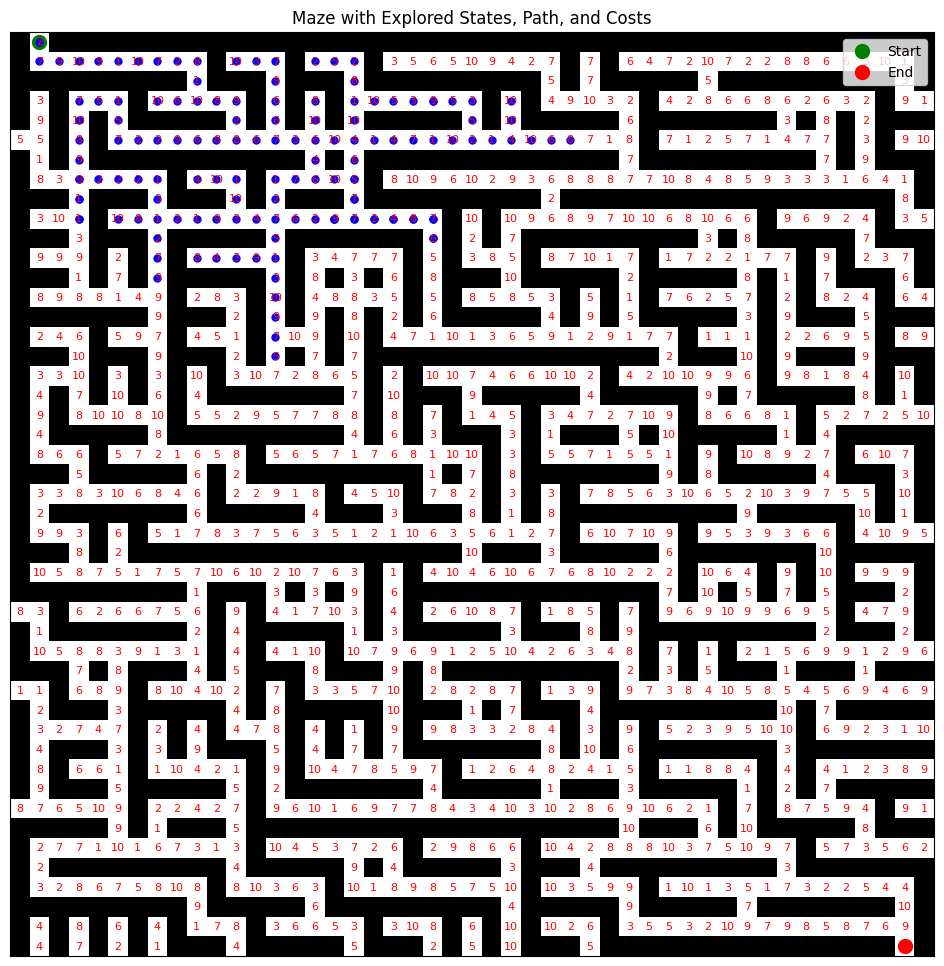

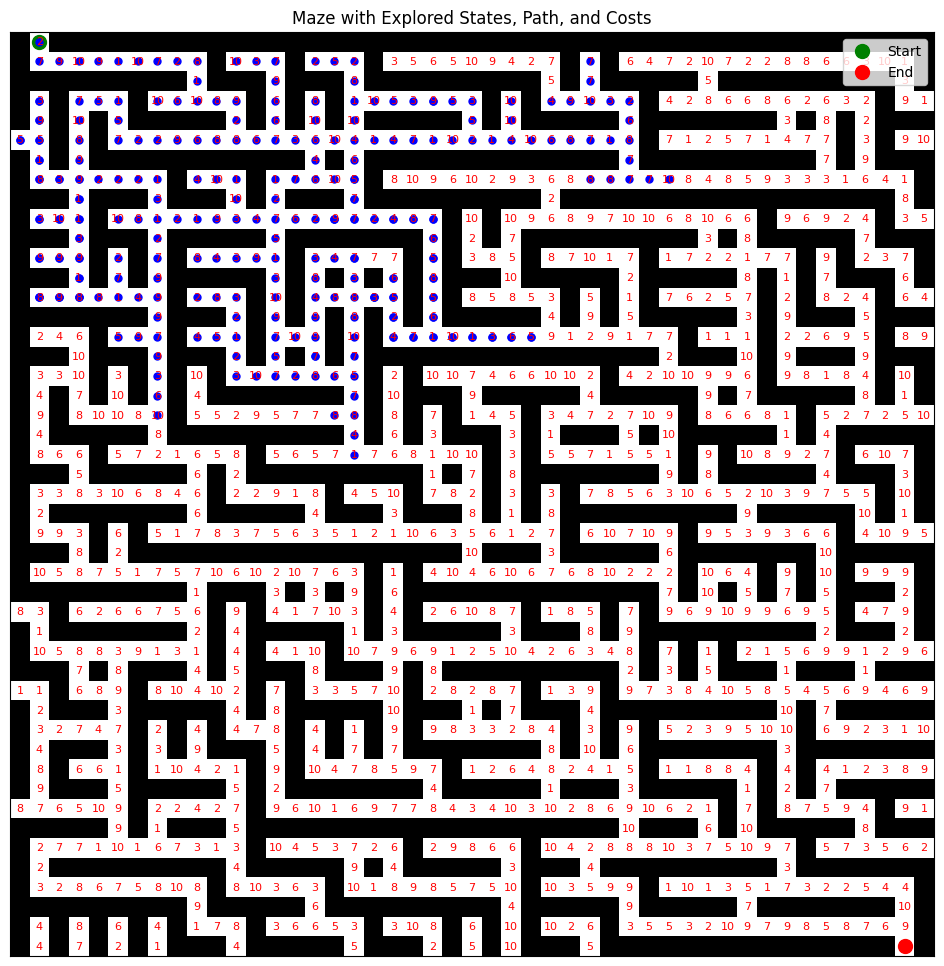

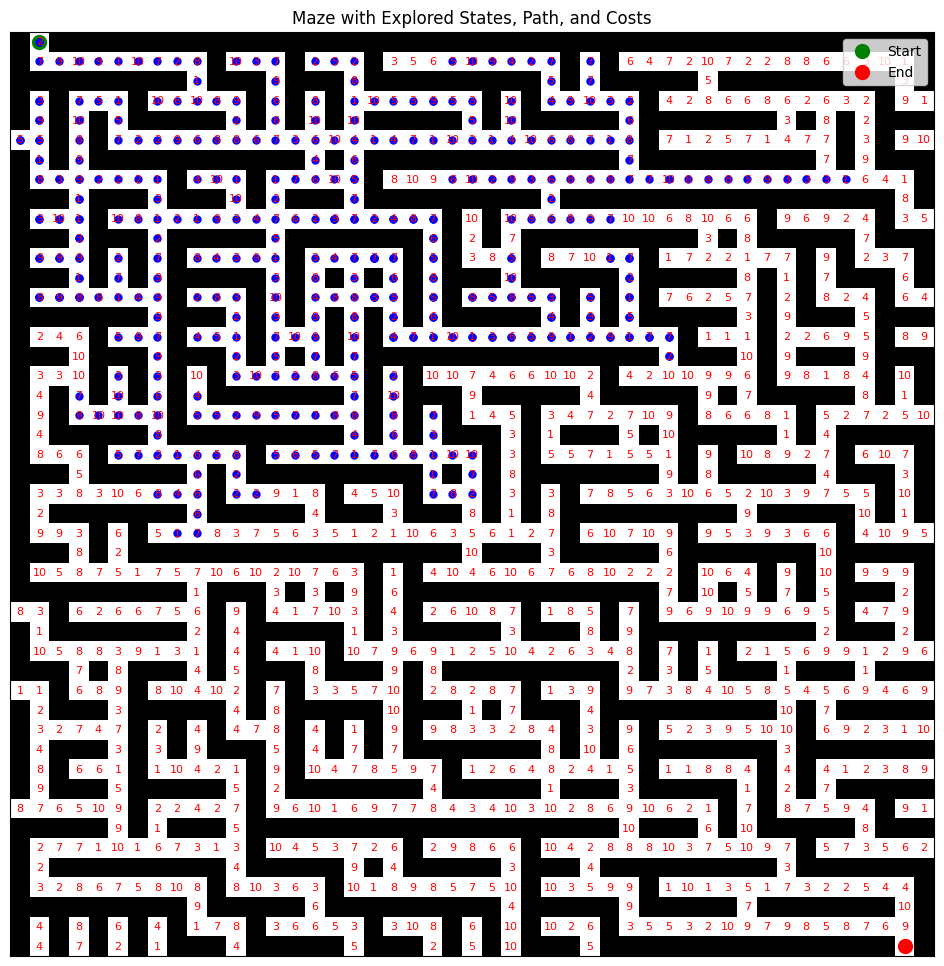

...

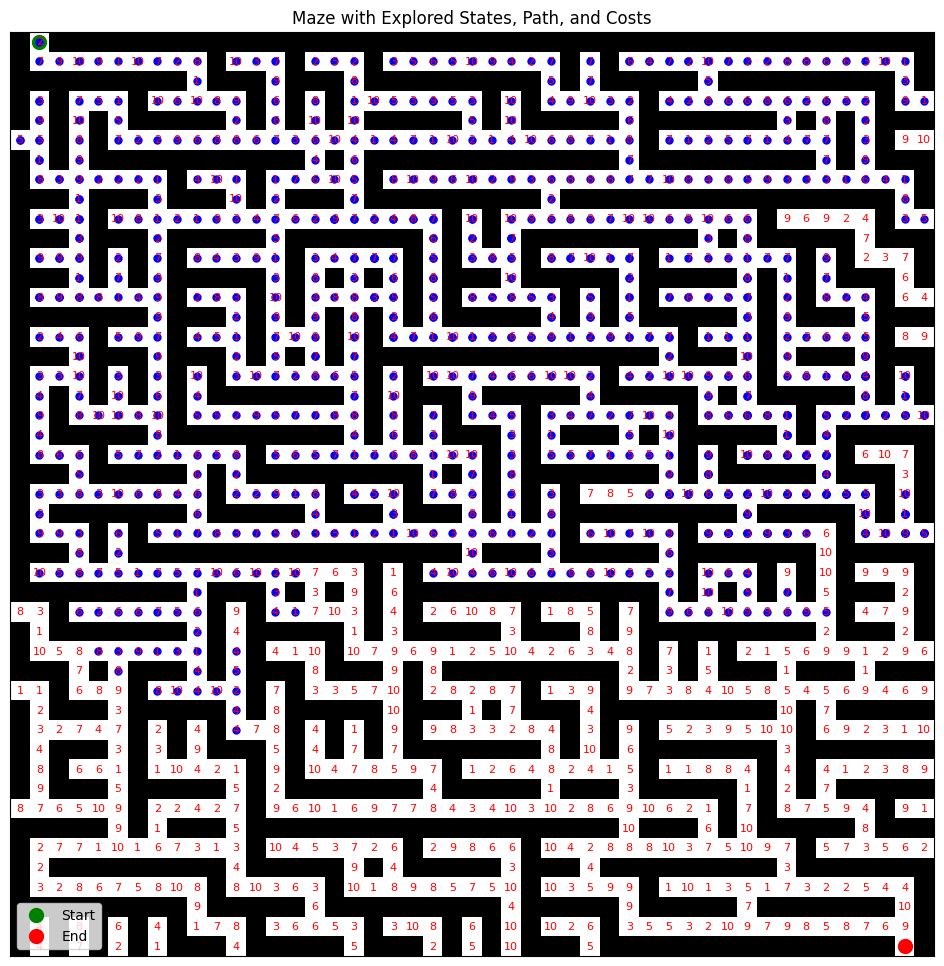

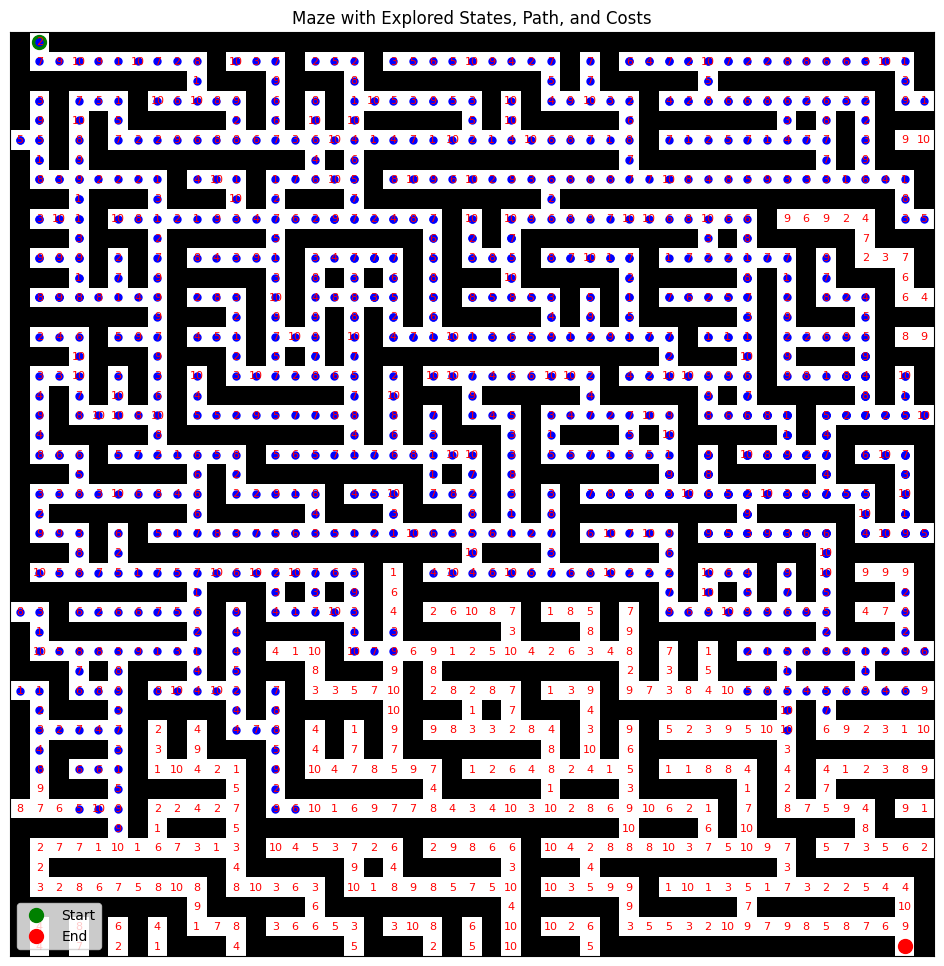

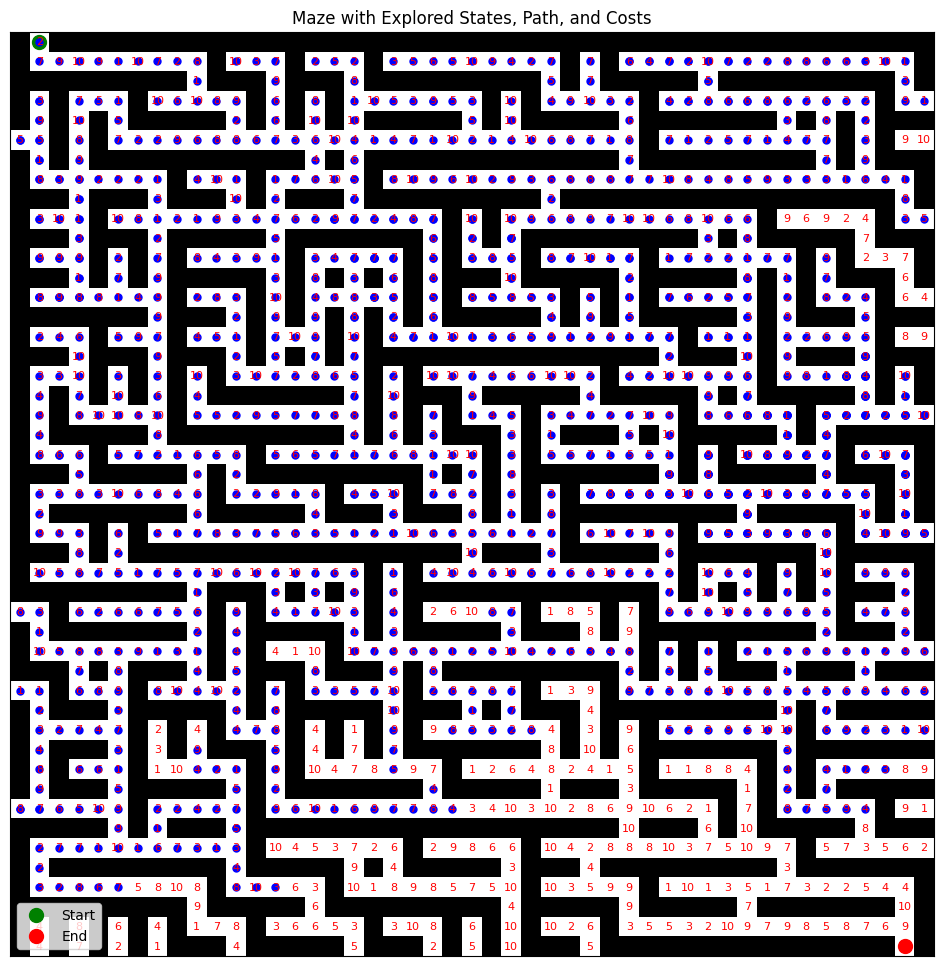

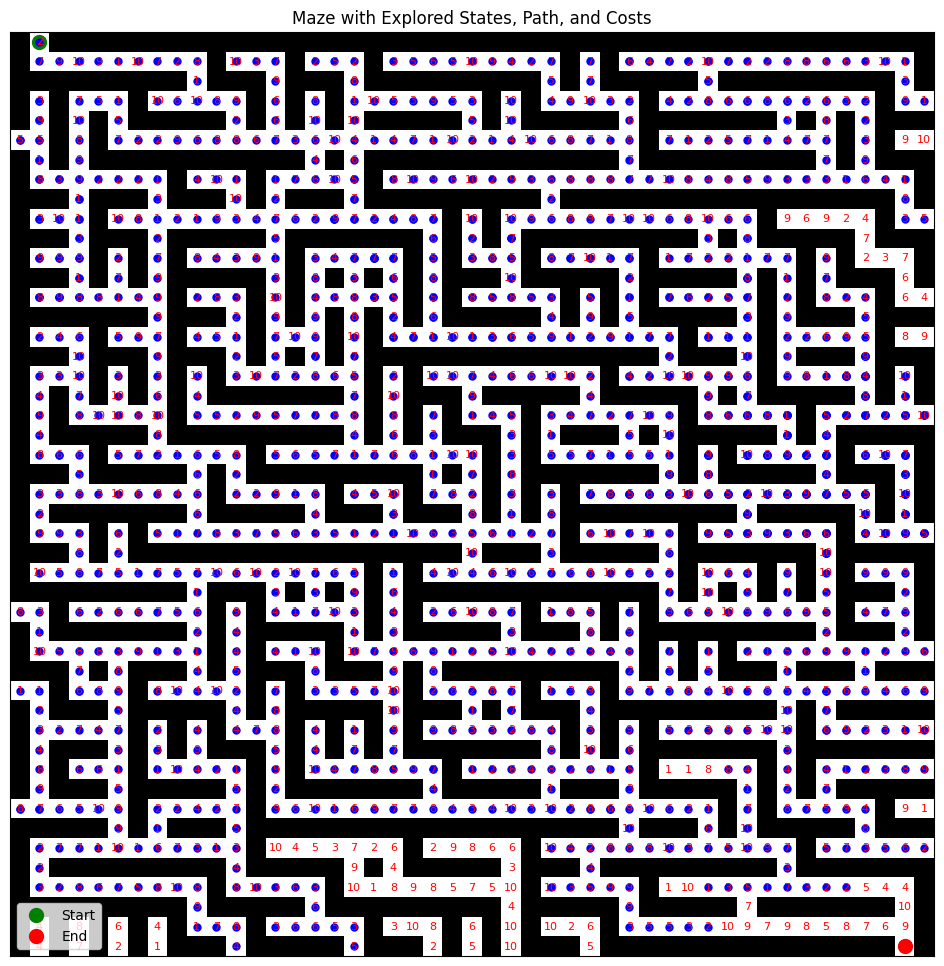

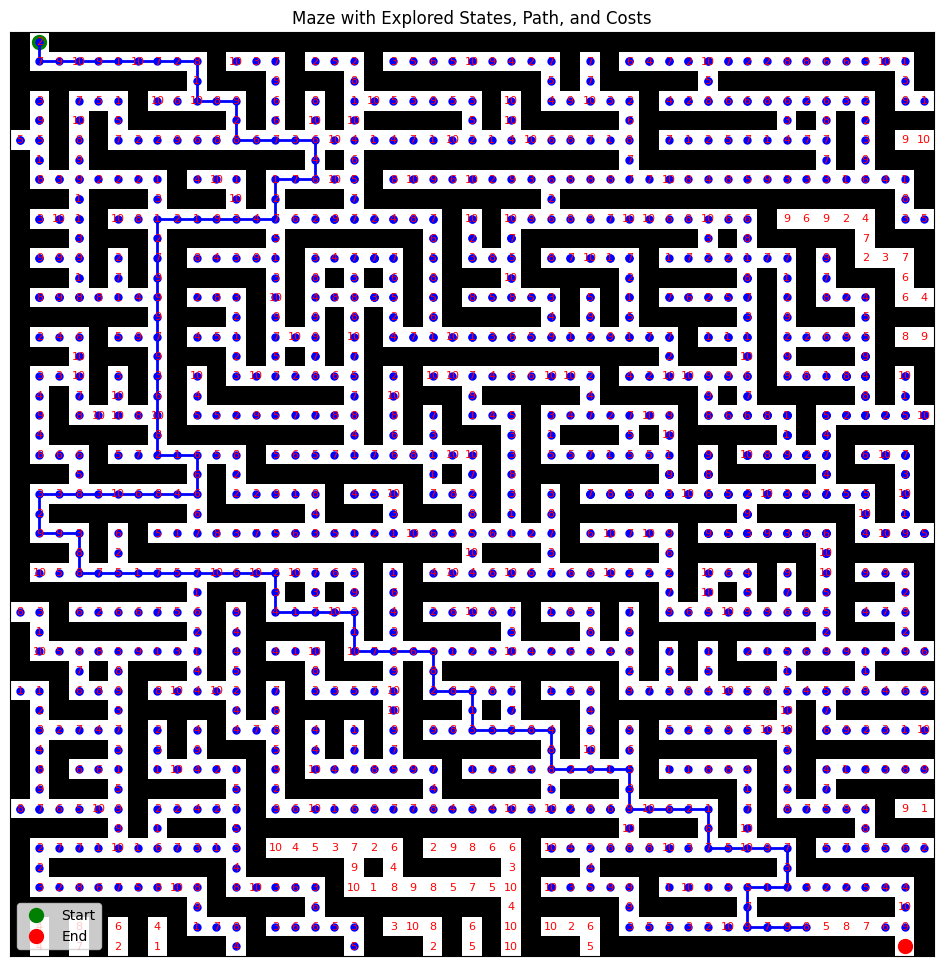

In [ ]:
bfs_graph_performance = measure_performance(breadth_first_graph_search, problem, verbose=True)
dfs_graph_performance = measure_performance(depth_first_graph_search, problem, verbose=True)
ids_graph_performance = measure_performance(iterative_deepening_search, problem, verbose=True)
ucs_graph_performance = measure_performance(uniform_cost_search, problem, verbose=True)

In [ ]:
# Prepare the data for the table
headers = ["Algorithm", "Explored Cells", "Cost", "Solution", "Time (seconds)", "Max Frontier Size (nodes)"]
table_data = [
    ["BFS Graph", bfs_graph_performance['explored_cells'], bfs_graph_performance['cost'], bfs_graph_performance['solution'],
     f"{bfs_graph_performance['elapsed_time']:.4f}", bfs_graph_performance['max_frontier_size']],

    ["DFS Graph", dfs_graph_performance['explored_cells'], dfs_graph_performance['cost'], dfs_graph_performance['solution'],
     f"{dfs_graph_performance['elapsed_time']:.4f}", dfs_graph_performance['max_frontier_size']],

    ["IDS Graph", ids_graph_performance['explored_cells'], ids_graph_performance['cost'], ids_graph_performance['solution'],
     f"{ids_graph_performance['elapsed_time']:.4f}", ids_graph_performance['max_frontier_size']],

    ["UCS Graph", ucs_graph_performance['explored_cells'], total_explored_cost_ucs, ucs_graph_performance['solution'],
     f"{ucs_graph_performance['elapsed_time']:.4f}", ucs_graph_performance['max_frontier_size']],

    ["Greedy Graph", explored_cells_gbfs_2, sum(heuristic_values_gbfs_2), solution_path_gbfs_2,
     "203.232", max_frontier_size_gbfs_2],

      ["A Star Graph", explored_cells_A_2, len(explored_cells_A_2), solution_path_A_2,
     "120.542", max_frontier_size_A_2],
]

# Print the table
print(tabulate(table_data, headers=headers, tablefmt='grid'))

+--------------+------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------